# B73 BLIND-like data analysis
Using count data from 40 B73 tassel primorida, attempt to construct a developmental trajectory
    Raw count data is in ~/Desktop/BLIND/SHSL002/htseq

In [1]:
setwd("/Users/Home/Desktop/BLIND/SHSL002")

library(DESeq2)


Loading required package: S4Vectors
Loading required package: stats4
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, cbind, colMeans, colnames,
    colSums, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, lengths, Map, mapply, match,
    mget, order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rowMeans, rownames, rowSums, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which, which.max, which.min


Attaching packag

In [2]:
#create a count matrix from htseq count files
file_names <- list.files(path="./htseq", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="./htseq", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
counts <- cbind(counts, new_file) # add on the new column
colnames(counts) <- c(file_names[1:f]) # add on the new column's name
}

count <- head(counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [3]:
dim (count); head (count)

[1] 39469    40

,SHSL002_01_S1.count.txt,SHSL002_02_S2.count.txt,SHSL002_03_S3.count.txt,SHSL002_04_S4.count.txt,SHSL002_05_S5.count.txt,SHSL002_06_S6.count.txt,SHSL002_07_S7.count.txt,SHSL002_08_S8.count.txt,SHSL002_09_S9.count.txt,SHSL002_10_S10.count.txt,⋯,SHSL002_31_S31.count.txt,SHSL002_32_S32.count.txt,SHSL002_33_S33.count.txt,SHSL002_34_S34.count.txt,SHSL002_35_S35.count.txt,SHSL002_36_S36.count.txt,SHSL002_37_S37.count.txt,SHSL002_38_S38.count.txt,SHSL002_39_S39.count.txt,SHSL002_40_S40.count.txt
AC148152.3_FG001,0,0,0,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AC148152.3_FG005,2,15,1,9,2,3,6,0,0,0,⋯,0,2,1,0,0,0,0,0,0,0
AC148152.3_FG006,0,0,0,0,0,0,0,0,0,0,⋯,2,0,2,0,0,0,0,0,0,0
AC148152.3_FG008,25,35,25,3,9,3,1,13,6,25,⋯,4,2,2,0,1,0,0,1,1,0
AC148167.6_FG001,578,653,752,567,583,622,563,517,385,545,⋯,326,212,649,651,572,613,365,614,391,442
AC149475.2_FG002,728,921,820,806,767,827,853,706,389,987,⋯,388,365,1110,931,636,652,389,845,525,634


In [4]:
#stabilize varaince within libraries
dds <- DESeqDataSetFromMatrix(count, data.frame(colnames(count)), ~1, tidy = FALSE)
dds <- estimateSizeFactors(dds)
dds <- estimateDispersions(dds)
vsd <- varianceStabilizingTransformation(dds)
vsd_filtered <- assay(vsd)

write.table(vsd_filtered, "./deseq/vsd_nofilter.txt", sep="\t", quote=F, row.names=T)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [5]:
#compare the affect of VSD
head(count); head(vsd_filtered)

,SHSL002_01_S1.count.txt,SHSL002_02_S2.count.txt,SHSL002_03_S3.count.txt,SHSL002_04_S4.count.txt,SHSL002_05_S5.count.txt,SHSL002_06_S6.count.txt,SHSL002_07_S7.count.txt,SHSL002_08_S8.count.txt,SHSL002_09_S9.count.txt,SHSL002_10_S10.count.txt,⋯,SHSL002_31_S31.count.txt,SHSL002_32_S32.count.txt,SHSL002_33_S33.count.txt,SHSL002_34_S34.count.txt,SHSL002_35_S35.count.txt,SHSL002_36_S36.count.txt,SHSL002_37_S37.count.txt,SHSL002_38_S38.count.txt,SHSL002_39_S39.count.txt,SHSL002_40_S40.count.txt
AC148152.3_FG001,0,0,0,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AC148152.3_FG005,2,15,1,9,2,3,6,0,0,0,⋯,0,2,1,0,0,0,0,0,0,0
AC148152.3_FG006,0,0,0,0,0,0,0,0,0,0,⋯,2,0,2,0,0,0,0,0,0,0
AC148152.3_FG008,25,35,25,3,9,3,1,13,6,25,⋯,4,2,2,0,1,0,0,1,1,0
AC148167.6_FG001,578,653,752,567,583,622,563,517,385,545,⋯,326,212,649,651,572,613,365,614,391,442
AC149475.2_FG002,728,921,820,806,767,827,853,706,389,987,⋯,388,365,1110,931,636,652,389,845,525,634


,SHSL002_01_S1.count.txt,SHSL002_02_S2.count.txt,SHSL002_03_S3.count.txt,SHSL002_04_S4.count.txt,SHSL002_05_S5.count.txt,SHSL002_06_S6.count.txt,SHSL002_07_S7.count.txt,SHSL002_08_S8.count.txt,SHSL002_09_S9.count.txt,SHSL002_10_S10.count.txt,⋯,SHSL002_31_S31.count.txt,SHSL002_32_S32.count.txt,SHSL002_33_S33.count.txt,SHSL002_34_S34.count.txt,SHSL002_35_S35.count.txt,SHSL002_36_S36.count.txt,SHSL002_37_S37.count.txt,SHSL002_38_S38.count.txt,SHSL002_39_S39.count.txt,SHSL002_40_S40.count.txt
AC148152.3_FG001,4.612483,4.612483,4.612483,4.884058,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,⋯,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483
AC148152.3_FG005,4.986228,5.546812,4.875213,5.417910,5.004299,5.085842,5.277180,4.612483,4.612483,4.612483,⋯,4.612483,5.183112,4.851497,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483
AC148152.3_FG006,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,⋯,5.094519,4.612483,4.950116,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483,4.612483
AC148152.3_FG008,5.894927,6.009539,5.886181,5.081491,5.435021,5.085842,4.885841,5.621912,5.455445,5.889287,⋯,5.291088,5.183112,4.950116,4.612483,4.885112,4.612483,4.612483,4.876057,4.920415,4.612483
AC148167.6_FG001,9.035898,8.995016,9.365849,9.078829,9.172637,9.226041,9.086808,9.087024,9.226973,8.946567,⋯,8.957145,8.841072,8.920172,9.002306,9.100659,9.198808,9.253625,9.104757,8.922117,9.019203
AC149475.2_FG002,9.341933,9.451957,9.482148,9.548519,9.539810,9.608536,9.643058,9.502707,9.240720,9.740357,⋯,9.186462,9.561681,9.635094,9.478109,9.241207,9.280872,9.338615,9.531330,9.311264,9.499494


In [6]:
dds <- DESeqDataSetFromMatrix(count, data.frame(colnames(count)), ~1, tidy = FALSE)
dds <- estimateSizeFactors(dds)
dds <- dds[ rowSums(counts(dds, normalized=TRUE) >= 5) > 39, ] #only consider detected genes, >= 5 RPM in more than 39 tissues
dds <- estimateDispersions(dds)
vsd <- varianceStabilizingTransformation(dds)
vsd_filtered <- assay(vsd)

write.table(vsd_filtered, "./deseq/vsd_39count_5min.txt", sep="\t", quote=F, row.names=T)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [7]:
dim(count); dim(vsd_filtered);
head(count); head(vsd_filtered);

[1] 39469    40

[1] 18646    40

,SHSL002_01_S1.count.txt,SHSL002_02_S2.count.txt,SHSL002_03_S3.count.txt,SHSL002_04_S4.count.txt,SHSL002_05_S5.count.txt,SHSL002_06_S6.count.txt,SHSL002_07_S7.count.txt,SHSL002_08_S8.count.txt,SHSL002_09_S9.count.txt,SHSL002_10_S10.count.txt,⋯,SHSL002_31_S31.count.txt,SHSL002_32_S32.count.txt,SHSL002_33_S33.count.txt,SHSL002_34_S34.count.txt,SHSL002_35_S35.count.txt,SHSL002_36_S36.count.txt,SHSL002_37_S37.count.txt,SHSL002_38_S38.count.txt,SHSL002_39_S39.count.txt,SHSL002_40_S40.count.txt
AC148152.3_FG001,0,0,0,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AC148152.3_FG005,2,15,1,9,2,3,6,0,0,0,⋯,0,2,1,0,0,0,0,0,0,0
AC148152.3_FG006,0,0,0,0,0,0,0,0,0,0,⋯,2,0,2,0,0,0,0,0,0,0
AC148152.3_FG008,25,35,25,3,9,3,1,13,6,25,⋯,4,2,2,0,1,0,0,1,1,0
AC148167.6_FG001,578,653,752,567,583,622,563,517,385,545,⋯,326,212,649,651,572,613,365,614,391,442
AC149475.2_FG002,728,921,820,806,767,827,853,706,389,987,⋯,388,365,1110,931,636,652,389,845,525,634


,SHSL002_01_S1.count.txt,SHSL002_02_S2.count.txt,SHSL002_03_S3.count.txt,SHSL002_04_S4.count.txt,SHSL002_05_S5.count.txt,SHSL002_06_S6.count.txt,SHSL002_07_S7.count.txt,SHSL002_08_S8.count.txt,SHSL002_09_S9.count.txt,SHSL002_10_S10.count.txt,⋯,SHSL002_31_S31.count.txt,SHSL002_32_S32.count.txt,SHSL002_33_S33.count.txt,SHSL002_34_S34.count.txt,SHSL002_35_S35.count.txt,SHSL002_36_S36.count.txt,SHSL002_37_S37.count.txt,SHSL002_38_S38.count.txt,SHSL002_39_S39.count.txt,SHSL002_40_S40.count.txt
AC148167.6_FG001,8.985065,8.942753,9.325241,9.029457,9.126317,9.181374,9.037704,9.037927,9.182334,8.892557,⋯,8.903521,8.783060,8.865187,8.950301,9.052015,9.153306,9.209789,9.056248,8.867204,8.967791
AC149475.2_FG002,9.300658,9.413666,9.444639,9.512673,9.503750,9.574131,9.609455,9.465721,9.196497,9.708919,⋯,9.140575,9.526156,9.601308,9.440496,9.196999,9.237842,9.297246,9.495061,9.269117,9.462426
AC149475.2_FG003,9.283552,9.534375,9.499202,9.592854,9.463491,9.545336,9.462224,9.554947,9.488882,9.804396,⋯,10.062062,10.067153,9.985415,9.696778,9.514821,9.670974,9.704222,10.035084,9.666849,9.905705
AC149475.2_FG005,8.932364,8.147307,8.774550,8.997886,9.161069,9.062041,9.068825,8.800678,8.354100,8.248298,⋯,8.786691,8.684413,8.557290,8.975111,8.986184,8.870550,8.886872,8.329371,8.828635,8.356655
AC149475.2_FG007,7.543103,7.666569,7.934970,7.670255,7.614149,7.529215,7.723345,7.407345,7.851667,7.852147,⋯,7.318059,7.491935,7.777917,7.672237,7.985636,7.986939,8.223883,8.036426,7.969554,7.592626
AC149818.2_FG001,5.910399,6.260955,5.918660,5.866756,5.993893,6.208410,6.009645,6.108477,6.243425,6.097266,⋯,6.715449,6.030638,6.155936,5.356714,6.161619,6.050317,5.988309,5.697850,5.750296,6.271016


#time for pretty pictures

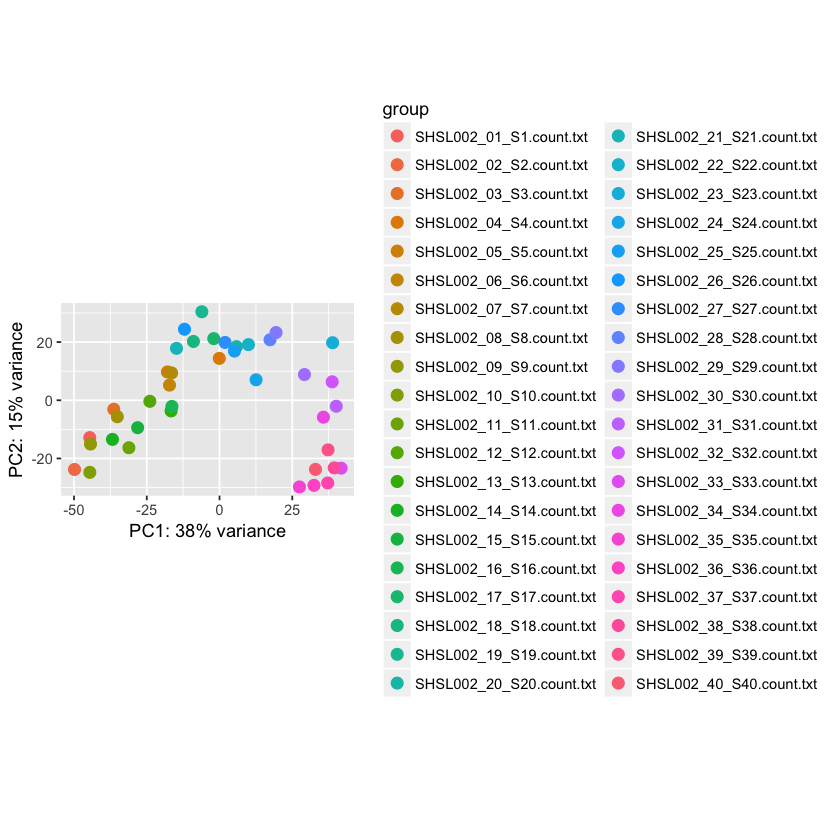

In [9]:
plotPCA(vsd, intgroup='colnames.count.', ntop=15000)

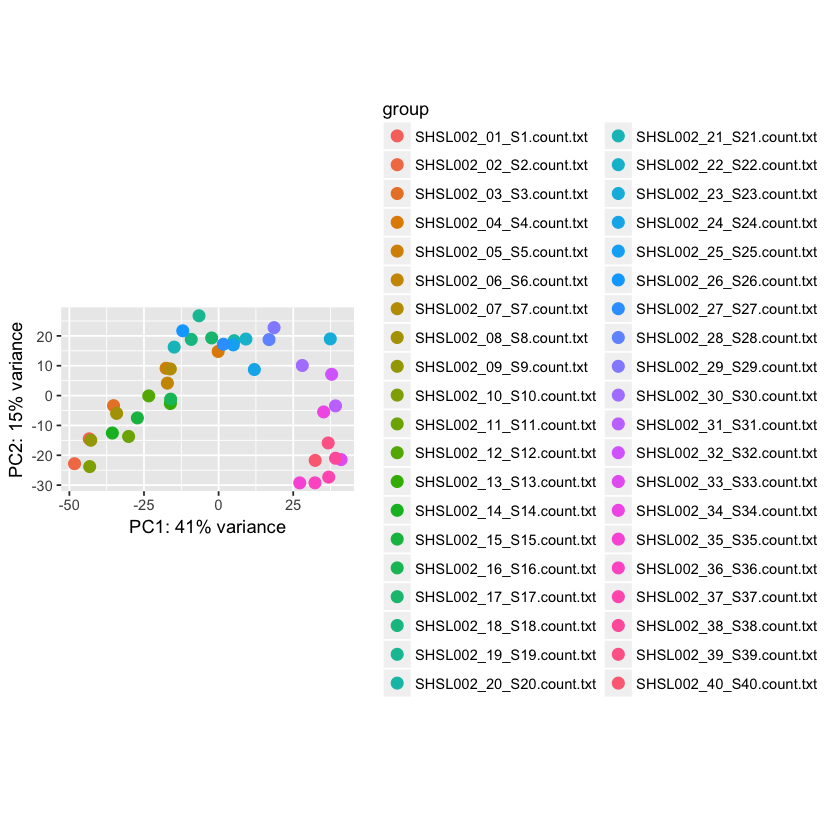

In [10]:
plotPCA(vsd, intgroup='colnames.count.', ntop=10000)

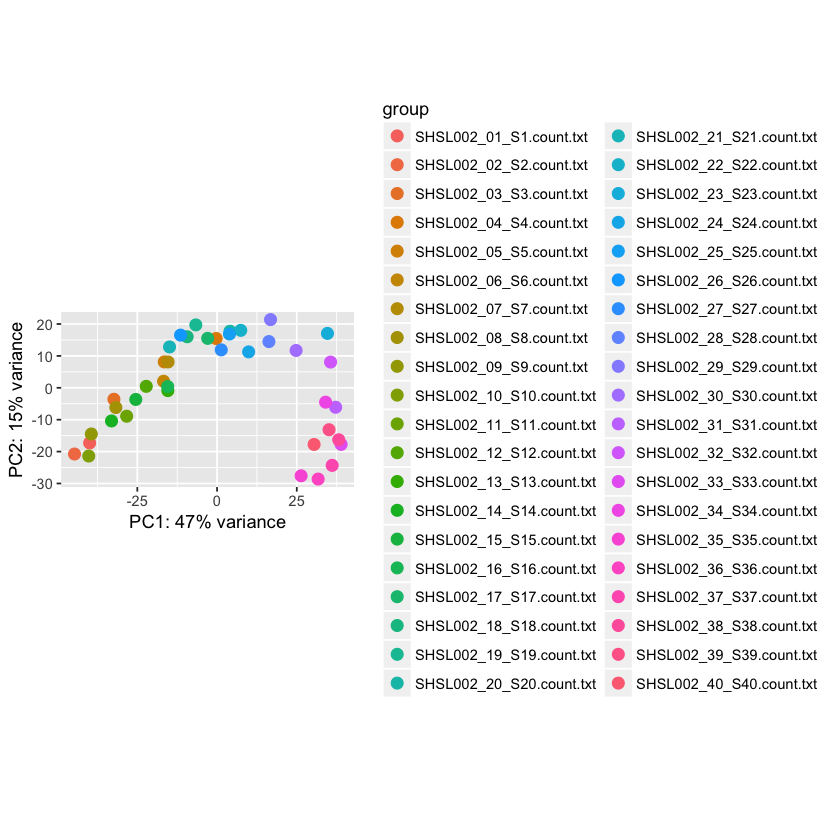

In [11]:
plotPCA(vsd, intgroup='colnames.count.', ntop=5000)

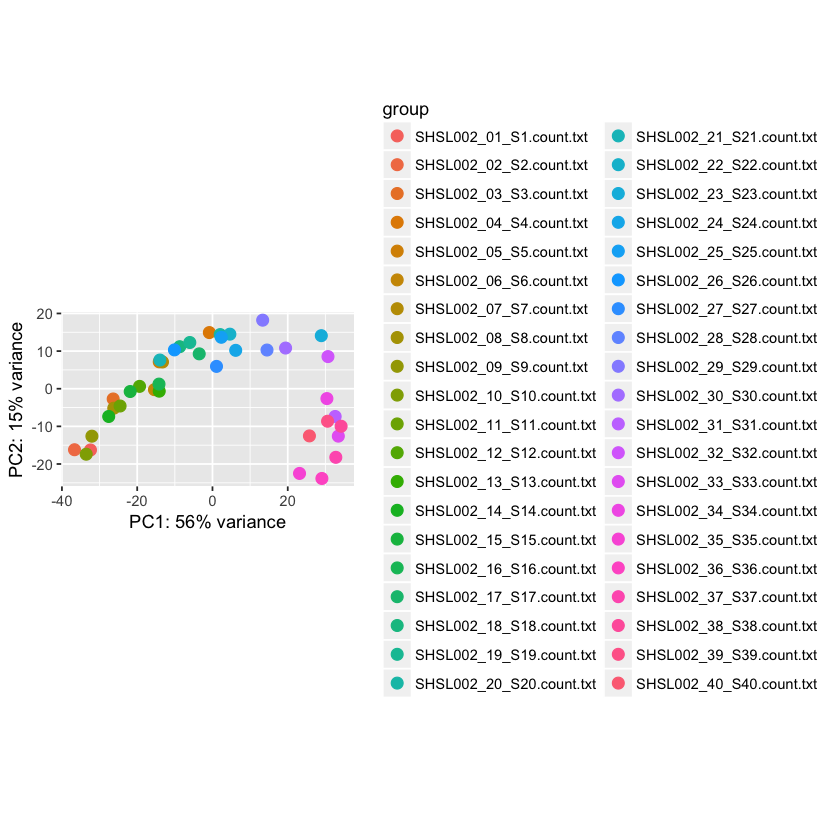

In [12]:
plotPCA(vsd, intgroup='colnames.count.', ntop=1500)

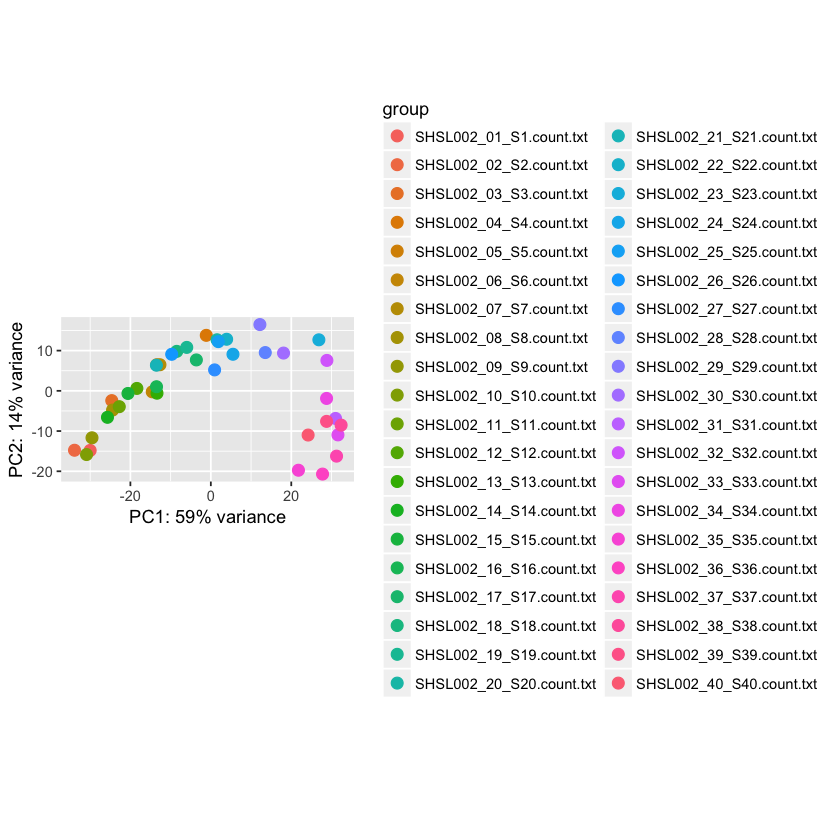

In [13]:
plotPCA(vsd, intgroup='colnames.count.', ntop=1000)

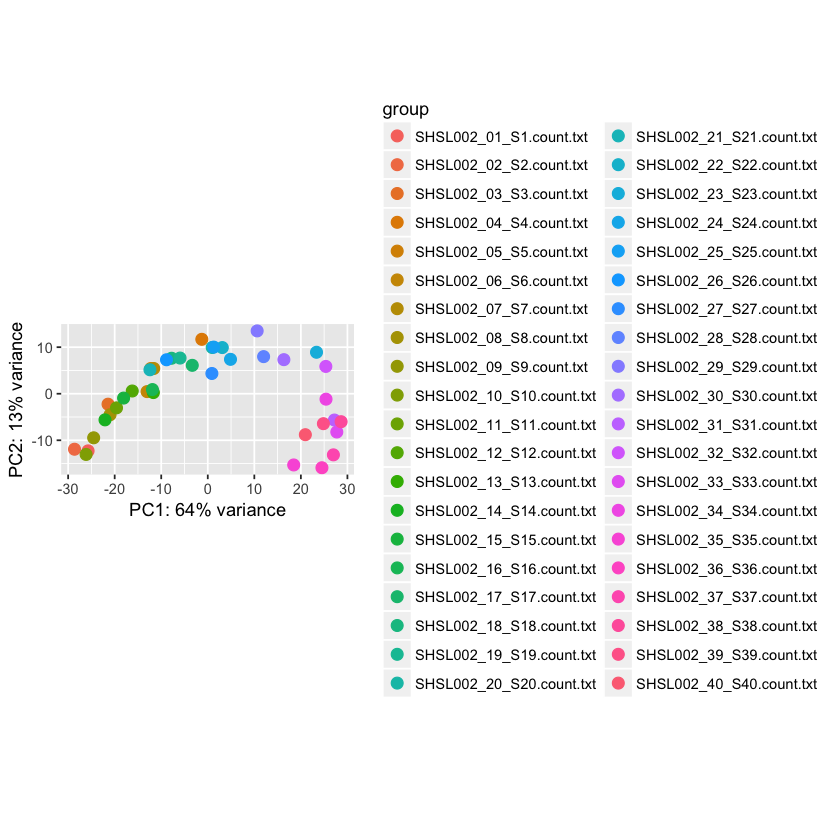

In [14]:
plotPCA(vsd, intgroup='colnames.count.', ntop=500)

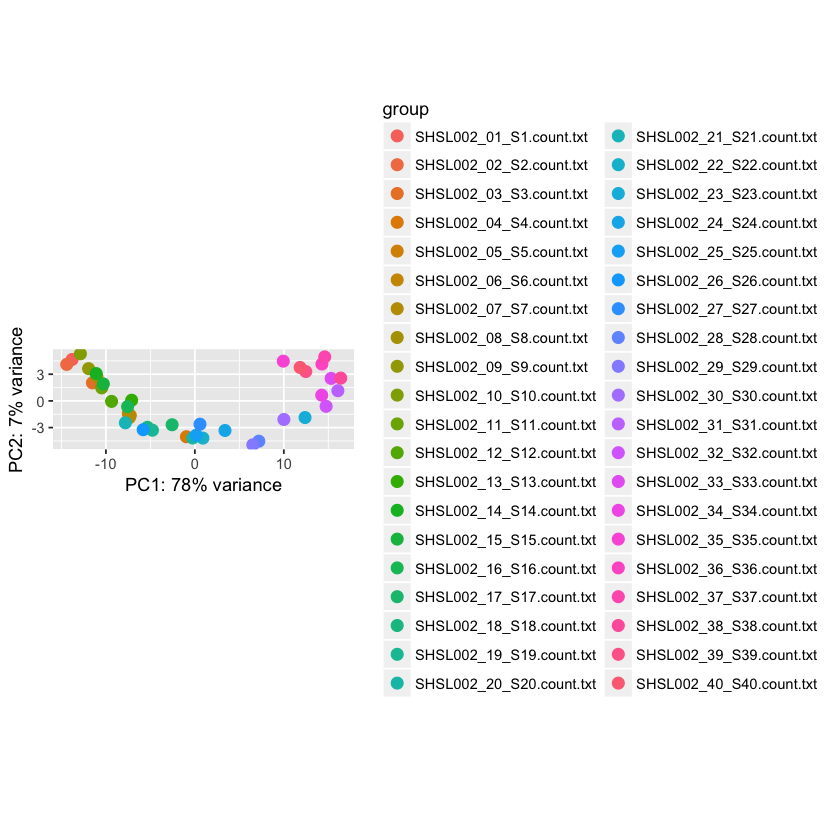

In [15]:
plotPCA(vsd, intgroup='colnames.count.', ntop=50)

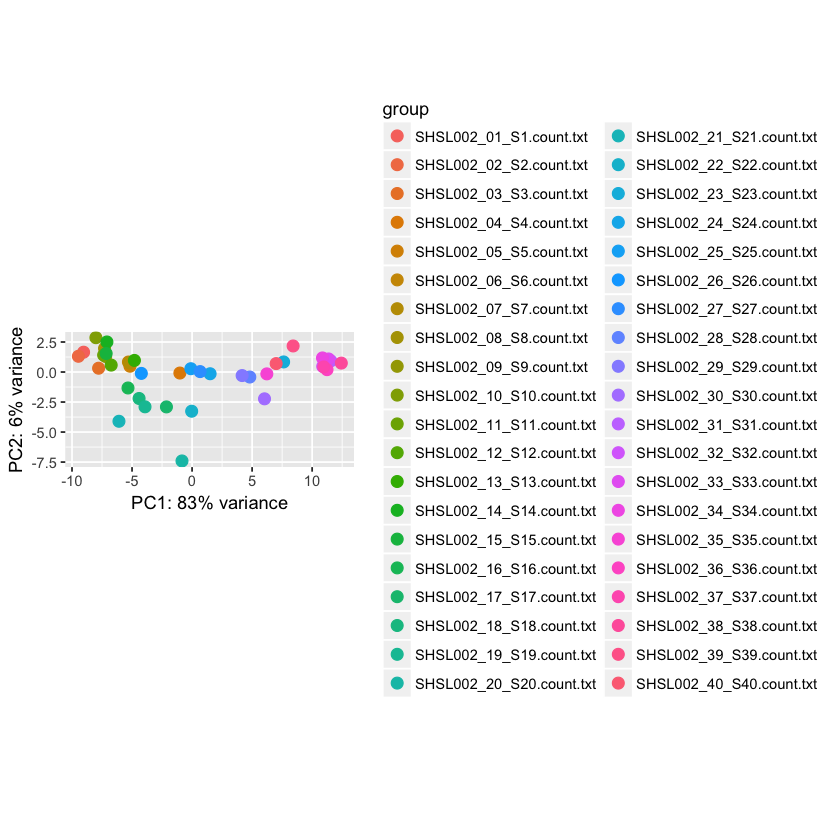

In [16]:
plotPCA(vsd, intgroup='colnames.count.', ntop=15)

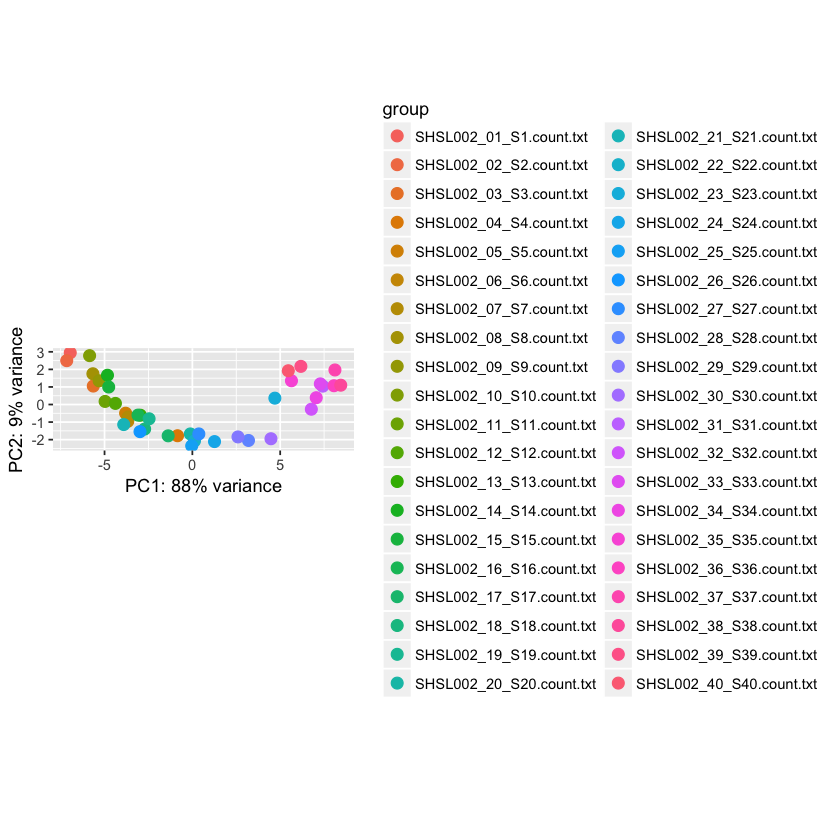

In [17]:
plotPCA(vsd, intgroup='colnames.count.', ntop=5)

In [18]:
pdf(file="./deseq/PCA_vsd39.5_15000.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=15000)
dev.off()

pdf(file="./deseq/PCA_vsd39.5_10000.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=10000)
dev.off()

pdf(file="./deseq/PCA_vsd39.5_5000.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=5000)
dev.off()

pdf(file="./deseq/PCA_vsd39.5_1500.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=1500)
dev.off()

pdf(file="./deseq/PCA_vsd39.5_1000.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=1000)
dev.off()

pdf(file="./deseq/PCA_vsd39.5_500.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=500)
dev.off()

pdf(file="./deseq/PCA_vsd39.5_50.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=50)
dev.off()

pdf(file="./deseq/PCA_vsd39.5_15.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=15)
dev.off()

pdf(file="./deseq/PCA_vsd39.5_5.pdf", wi = 9, he = 6)
plotPCA(vsd, intgroup='colnames.count.', ntop=5)
dev.off()

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

pdf 
  2

# it WORKED!!!!!
## 1500 gives the best rainbow arc
## should I try painting DAS?


In [12]:
#pick the genes with most variance
ntop <- 1500
# calculate the variance for each gene
require(genefilter)
rv <- rowVars(vsd_filtered)
# select the ntop genes by variance
select <- order(rv, decreasing=TRUE)[seq_len(min(ntop, length(rv)))]

selected_genes <- vsd_filtered[select,]

write.table(selected_genes, "./deseq/top1500_vsd39.5.txt", sep="\t", quote=F, row.names=T)

Loading required package: pheatmap
Loading required package: RColorBrewer


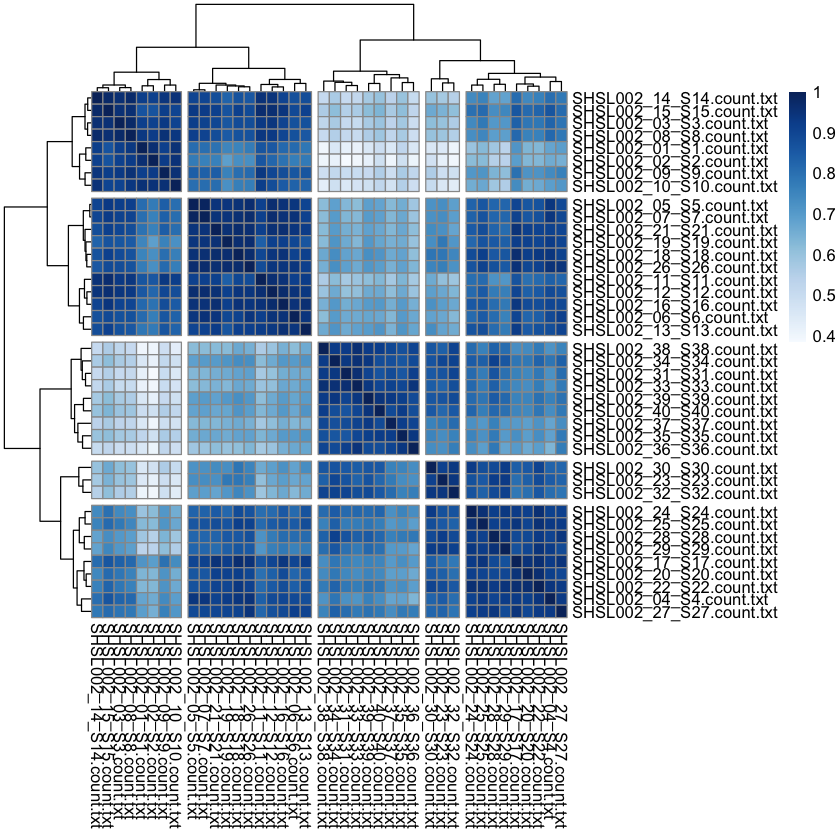

In [20]:
## Heat map and hiearch clust attempts

require("pheatmap")
require("RColorBrewer")
require("genefilter")

sampleDists <- as.dist((1-cor(selected_genes)))
sampleDistMatrix <- as.matrix( sampleDists )
#rownames(sampleDistMatrix) <- paste( rld$dex, rld$cell, sep = " - " )
#colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette( brewer.pal(9, "Blues") )(255)

pheatmap(1-sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=TRUE, cluster_cols=TRUE,
         cutree_rows=5, cutree_cols=5,
         col = colors)

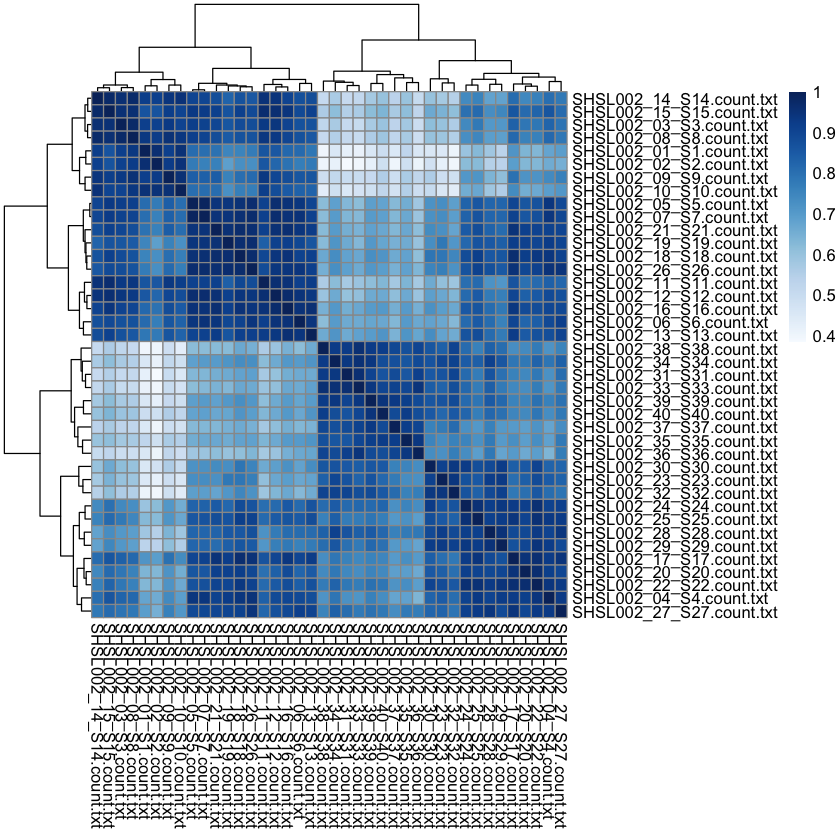

In [21]:
pheatmap(1-sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=TRUE, cluster_cols=TRUE,
         col = colors)


Loading required package: genefilter

Attaching package: ‘genefilter’

The following object is masked from ‘package:spatstat’:

    area

The following objects are masked from ‘package:matrixStats’:

    rowSds, rowVars

Loading required package: ggplot2
Warning message:
“package ‘ggplot2’ was built under R version 3.4.4”

pdf 
  2

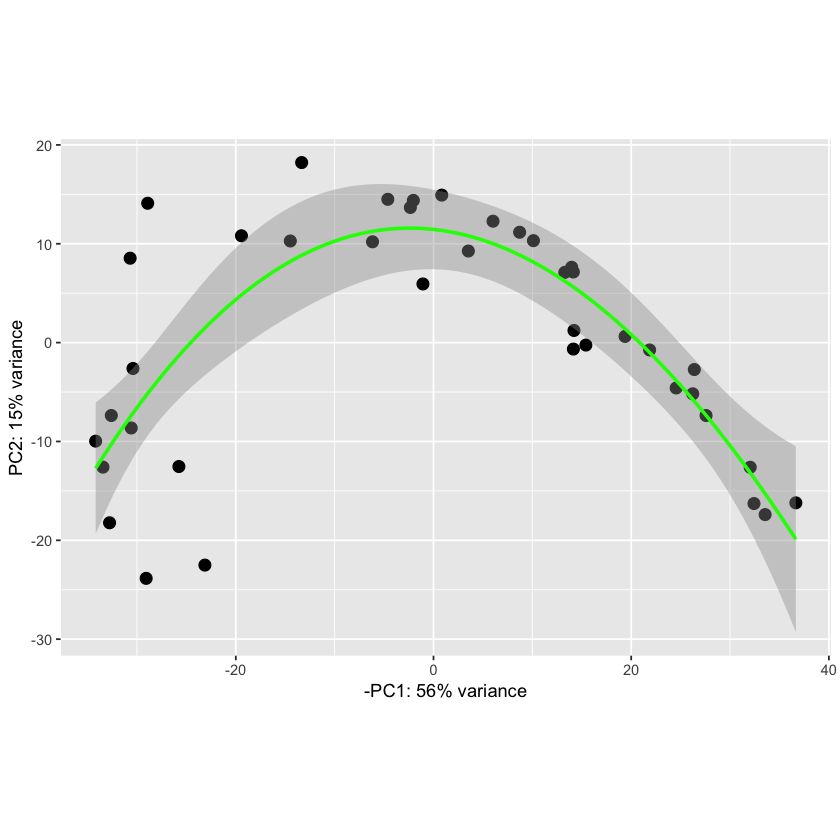

In [11]:
## copied from DESeq GitHub
#pick the genes with most variance

require("genefilter")
require(DESeq2)

ntop <- 1500
object <- vsd
intgroup='colnames.count.'

# calculate the variance for each gene
rv <- rowVars(assay(object))
# select the ntop genes by variance
select <- order(rv, decreasing=TRUE)[seq_len(min(ntop, length(rv)))]
# perform a PCA on the data in assay(x) for the selected genes
pca <- prcomp(t(assay(object)[select,]))
# the contribution to the total variance for each component
percentVar <- pca$sdev^2 / sum( pca$sdev^2 )
if (!all(intgroup %in% names(colData(object)))) {
stop("the argument 'intgroup' should specify columns of colData(dds)")
}
intgroup.df <- as.data.frame(colData(object)[, intgroup, drop=FALSE])
# add the intgroup factors together to create a new grouping factor
group <- if (length(intgroup) > 1) {
factor(apply( intgroup.df, 1, paste, collapse=":"))
} else {
colData(object)[[intgroup]]
}
# assembly the data for the plot
d <- data.frame(PC1=pca$x[,1], PC2=pca$x[,2], group=group, intgroup.df, name=colnames(object))


require(ggplot2)
#options(repr.plot.width=5, repr.plot.height=4)

ggplot(data=d, aes(x=-PC1, y=PC2)) + geom_point(size=3) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	coord_fixed() +
	geom_smooth(method = "lm", formula = y ~ splines::bs(x, 3), color='green')

pdf("./PCA_wSpline.pdf", he=3, wi=3)
ggplot(data=d, aes(x=-PC1, y=PC2)) + geom_point(size=3) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	coord_fixed() +
	geom_smooth(method = "lm", formula = y ~ splines::bs(x, 3), color='green')
dev.off()


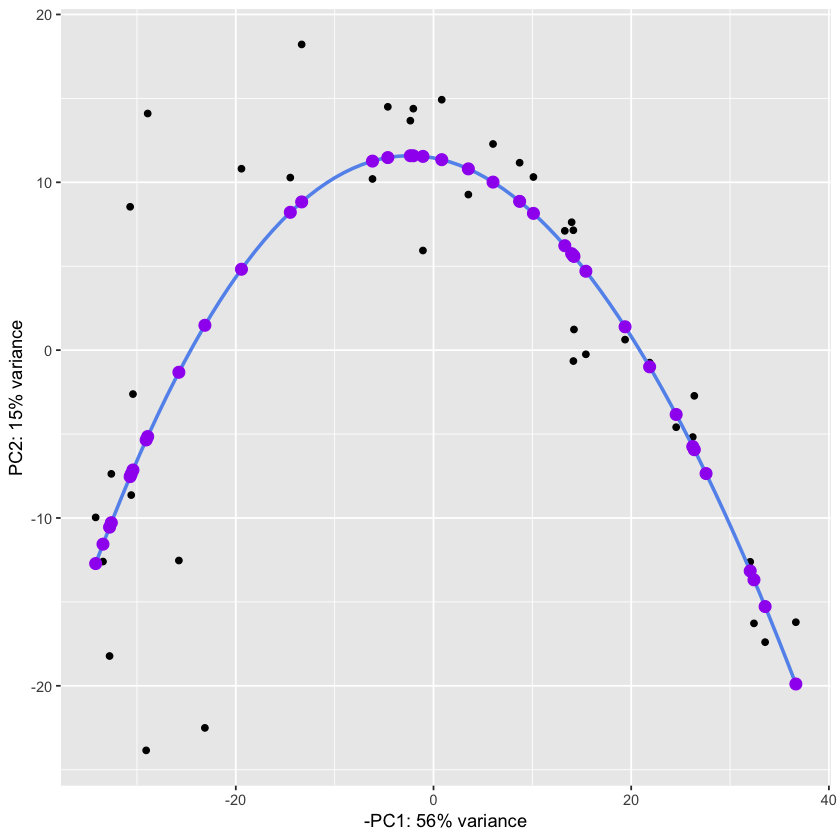

In [12]:
## Can you access developmental-expression time?

# first set up a lowess fit:
lfit <- loess(d$PC2~d$PC1, span=3)

# create a functional version of the lowess fit
lfun <- approxfun(lfit)
fitted <- lfun(d$PC1)
resid <- d$PC2-fitted

#try some splines instead
smod <- lm(formula = d$PC2 ~ splines::bs(d$PC1, 3)) 
sfit <- data.frame(predict(smod))
df <- data.frame(PC1 = d$PC1, PC2 = d$PC2, sfit, d$name)
colnames(df)[3:4] <- c("fit", "name")


ggplot(data=df, aes(x=-PC1, y=PC2)) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	geom_point() + 
	stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="cornflowerblue") +
	geom_point(aes(-PC1, df$fit), size=3, color="purple")


In [13]:
#gives y, pred values as function of x, try extracting line values and assign to regression based on euclidean distance
p <- ggplot(data=df, aes(PC1, PC2)) + 
		geom_point() + 
		stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="cornflowerblue", n=1000) +
		geom_point(aes(PC1, df$fit), size=1, color="purple")
sline <- ggplot_build(p)$data[[2]][1:2] #extract data from ggplot object
sline <- cbind(sline, "rank"=c(1:nrow(sline)))


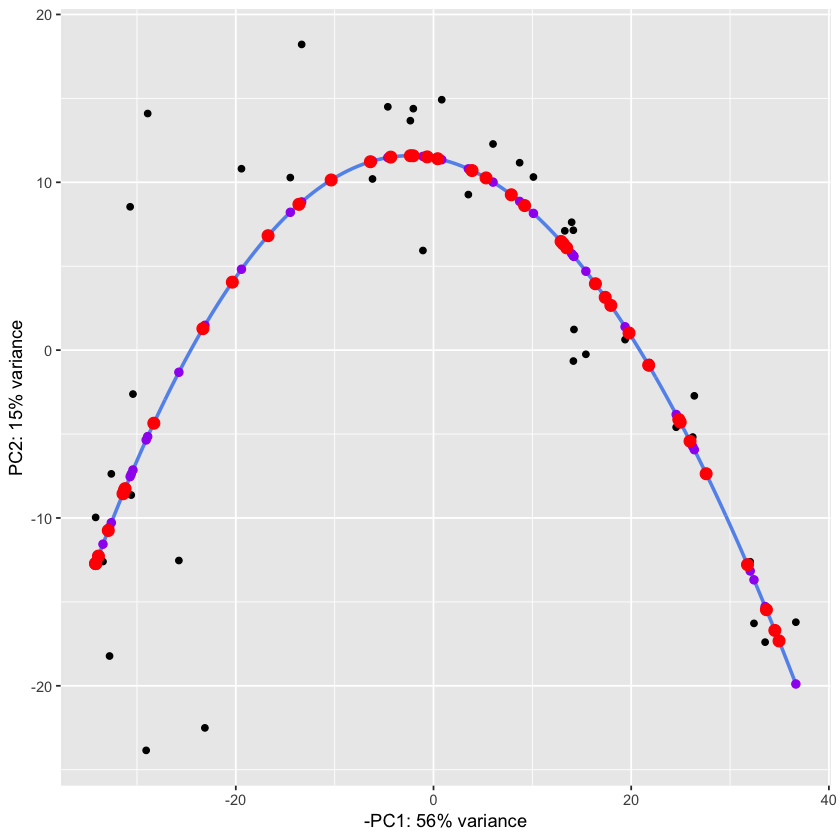

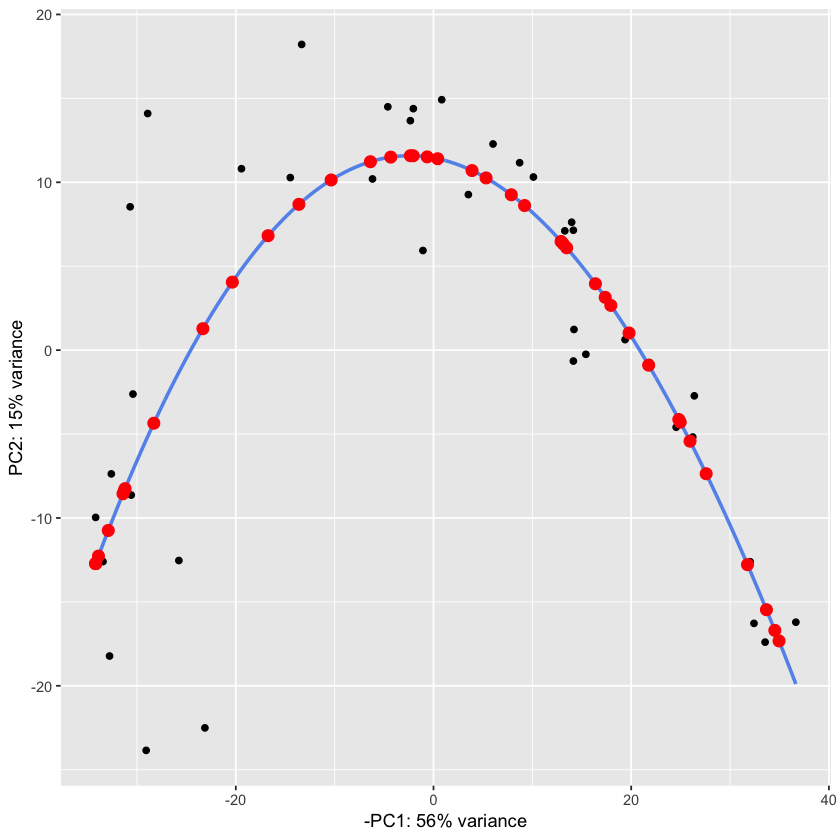

In [14]:
require(spatstat) #designed for comparing ppp point objects

#create point objects with large windows, does it matter?
sppp <- as.ppp(sline, W=c(c(-60,60), c(-60,60))) 
dppp <- ppp(d$PC1, d$PC2, window=owin(c(-60,60), c(-60,60)))

#calculate nearest and get distance -- of limited use here
ddist <- nncross(X=dppp, Y=sppp, k=1)

#pull out spline x, y, and rank
sbest <- sline[ddist$which,] 


ggplot(data=df, aes(-PC1, PC2)) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	geom_point() + 
	stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="cornflowerblue", n=1000) +
	geom_point(aes(-PC1, df$fit), size=2, color="purple") +
	geom_point(aes(-sbest$x, sbest$y), size=3, color="red")

ggplot(data=df, aes(-PC1, PC2)) + 
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	geom_point() + 
	stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="cornflowerblue", n=1000) +
	geom_point(aes(-sbest$x, sbest$y), size=3, color="red")


ERROR while rich displaying an object: Error: `data` must be uniquely named but has duplicate columns

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. repr::mime2repr[[mime]](obj)
8. repr_text.default(obj)


ERROR: Error: `data` must be uniquely named but has duplicate columns


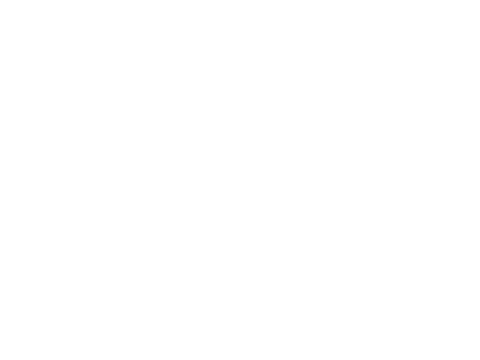

In [21]:
df <- cbind(df, (1000-sbest$rank)/100)
colnames(df)[5] <- "ETU"




In [25]:
head(df)


PC1,PC2,fit,name,ETU
-32.4197597,-16.2801679,-13.685934,SHSL002_01_S1.count.txt,9.57
-36.6569524,-16.2095714,-19.892226,SHSL002_02_S2.count.txt,9.75
-26.3840842,-2.7233960,-5.931393,SHSL002_03_S3.count.txt,8.32
-0.8327836,14.9203840,11.348332,SHSL002_04_S4.count.txt,4.88
-14.1470226,7.1444060,5.628308,SHSL002_05_S5.count.txt,6.72
-15.4151434,-0.2476493,4.700856,SHSL002_06_S6.count.txt,7.35


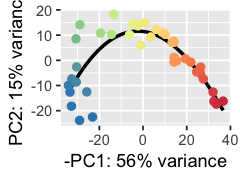

In [31]:

options(repr.plot.width=2, repr.plot.height=1.5)
p <- ggplot(data=df, aes(-PC1, PC2, color=ETU)) +
    stat_smooth(method="lm", formula= y~splines::bs(x,3), se=F, color="black", n=1000) +
	xlab(paste0("-PC1: ",round(percentVar[1] * 100),"% variance")) +
  	ylab(paste0("PC2: ",round(percentVar[2] * 100),"% variance")) +
	geom_point(size = 2) +
	scale_color_distiller(palette="Spectral") +
    theme(legend.position="none")

p

ggsave(plot=p,width=2,height=1.5,dpi=200, filename="./deseq/ColorCode_top1500_ETUcolor.pdf", useDingbats=FALSE)


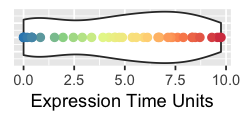

In [37]:
options(repr.plot.width=2, repr.plot.height=1)



p <- ggplot(data=df, aes(x=0, y=ETU, color=ETU)) +
		ylab("Expression Time Units") +
		geom_violin() +
		geom_point(size = 2) +
		scale_color_distiller(palette="Spectral") +
		coord_flip() +
        xlab(NULL) +
        theme(legend.position="none", axis.text.y = element_blank(), axis.ticks.y = element_blank())

p

ggsave(plot=p,width=2,height=1,dpi=200, filename="./deseq/ColorCode_top1500_ETUdist.pdf", useDingbats=FALSE)

In [38]:
das <- read.table (text=
"45
45
45
42
42
42
42
42
42
42
42
41
41
41
41
40
40
40
39
39
39
39
38
38
38
38
38
38
36
36
35
35
34
34
34
33
33
33
32
32", header =F)

In [39]:
#add DAS to dataframe -- only run this block once!!
df <- cbind(df, das$V1)
colnames(df)[6] <- "DAS"
head(df)

PC1,PC2,fit,name,ETU,DAS
-32.4197597,-16.2801679,-13.685934,SHSL002_01_S1.count.txt,9.57,45
-36.6569524,-16.2095714,-19.892226,SHSL002_02_S2.count.txt,9.75,45
-26.3840842,-2.7233960,-5.931393,SHSL002_03_S3.count.txt,8.32,45
-0.8327836,14.9203840,11.348332,SHSL002_04_S4.count.txt,4.88,42
-14.1470226,7.1444060,5.628308,SHSL002_05_S5.count.txt,6.72,42
-15.4151434,-0.2476493,4.700856,SHSL002_06_S6.count.txt,7.35,42


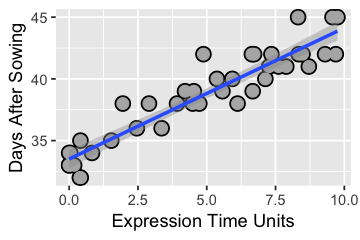

In [40]:

p <- ggplot(data=df, aes(x=ETU, y=DAS)) +
		xlab("Expression Time Units") +
		ylab("Days After Sowing") +
		geom_point(color="black", size = 4) +
		geom_point(color="grey70", size = 3) +
		stat_smooth(method="lm")

options(repr.plot.width=3, repr.plot.height=2)
p

ggsave(plot=p,width=3,height=2,dpi=300, filename="./ETUvDAS.pdf", useDingbats=FALSE)

In [31]:
DvE <- lm(df$ETU ~ df$DAS)
summary(DvE)


Call:
lm(formula = df$ETU ~ df$DAS)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.7292 -0.6728 -0.1717  0.8379  2.0808 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -27.09012    1.94462  -13.93   <2e-16 ***
df$DAS        0.82617    0.05009   16.49   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.154 on 38 degrees of freedom
Multiple R-squared:  0.8774,	Adjusted R-squared:  0.8742 
F-statistic:   272 on 1 and 38 DF,  p-value: < 2.2e-16


# R^2 is 0.87 -- DAS explains a lot but not everything
similar finding in sorghum, R^2 was lower in sorghum

In [41]:
tassel_height <- read.table (text=
"12.051
10.015
11.391
4.786
7.504
7.891
6.861
7.135
5.575
9.43
4.993
8.749
5.127
6.334
5.18
6.822
4.999
7.026
6.536
4.234
7.436
4.232
2.968
4.028
4.425
5.868
4.357
3.433
3.822
2.989
1.642
2.043
1.686
2.024
1.061
1.208
0.538
1.52
1.358
1.534", header =F)

In [42]:
#add DAS to dataframe -- only run this block once!!
df <- cbind(df, tassel_height$V1)
colnames(df)[7] <- "tassel_height"
head(df)

PC1,PC2,fit,name,ETU,DAS,tassel_height
-32.4197597,-16.2801679,-13.685934,SHSL002_01_S1.count.txt,9.57,45,12.051
-36.6569524,-16.2095714,-19.892226,SHSL002_02_S2.count.txt,9.75,45,10.015
-26.3840842,-2.7233960,-5.931393,SHSL002_03_S3.count.txt,8.32,45,11.391
-0.8327836,14.9203840,11.348332,SHSL002_04_S4.count.txt,4.88,42,4.786
-14.1470226,7.1444060,5.628308,SHSL002_05_S5.count.txt,6.72,42,7.504
-15.4151434,-0.2476493,4.700856,SHSL002_06_S6.count.txt,7.35,42,7.891


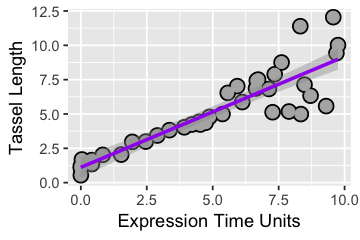

In [43]:

p <- ggplot(data=df, aes(x=ETU, y=tassel_height)) +
		xlab("Expression Time Units") +
		ylab("Tassel Length") +
		geom_point(color="black", size = 4) +
		geom_point(color="grey70", size = 3) +
		stat_smooth(method="lm", col="purple")

options(repr.plot.width=3, repr.plot.height=2)
p

ggsave(plot=p,width=3,height=2,dpi=300, filename="./ETUvTasselLength.pdf", useDingbats=FALSE)

In [35]:
TvE <- lm(df$ETU ~ df$tassel_height)
summary(TvE)


Call:
lm(formula = df$ETU ~ df$tassel_height)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.9065 -0.8854 -0.3366  0.4408  3.9025 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)      -0.19001    0.45777  -0.415     0.68    
df$tassel_height  1.00224    0.07907  12.676 3.19e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.442 on 38 degrees of freedom
Multiple R-squared:  0.8087,	Adjusted R-squared:  0.8037 
F-statistic: 160.7 on 1 and 38 DF,  p-value: 3.193e-15


In [51]:
pdf("./DASvTasselLength.pdf", he=2, wi=3)
ggplot(data=df, aes(x=DAS, y=tassel_height)) +
		xlab("Days After Sowing") +
		ylab("Tassel Length") +
		geom_point(color="black", size = 4) +
		geom_point(color="grey70", size = 3) +
		stat_smooth(method="lm")
dev.off()

pdf 
  2

In [37]:
DvT <- lm(df$tassel_height ~ df$DAS)
summary(DvT)


Call:
lm(formula = df$tassel_height ~ df$DAS)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.6263 -0.8253 -0.1351  0.8888  2.4965 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -22.57768    2.14902  -10.51 8.51e-13 ***
df$DAS        0.71405    0.05536   12.90 1.86e-15 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.276 on 38 degrees of freedom
Multiple R-squared:  0.8141,	Adjusted R-squared:  0.8092 
F-statistic: 166.4 on 1 and 38 DF,  p-value: 1.857e-15


In [84]:
write.table(df, file="./deseq/ETU_vsd_39count_5min.txt", sep="\t", quote=F)

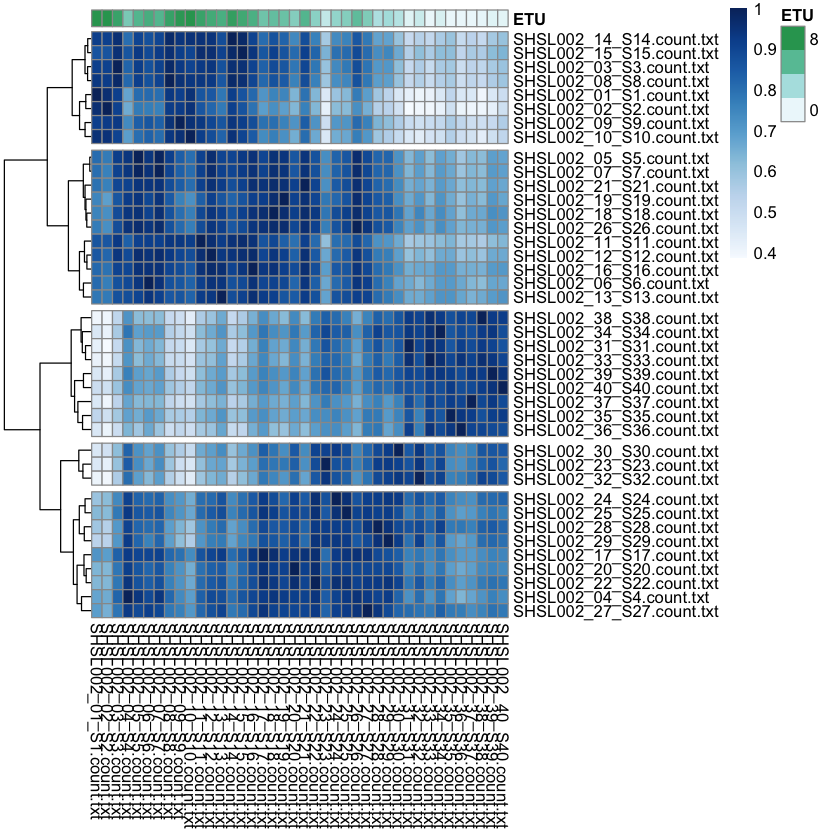

In [85]:
### Revisit heatmaps with ETU values

require("pheatmap")
require("RColorBrewer")
require("genefilter")

sampleDists <- as.dist((1-abs(cor(selected_genes))))
sampleDistMatrix <- as.matrix( sampleDists )
#rownames(sampleDistMatrix) <- paste( rld$dex, rld$cell, sep = " - " )
#colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette( brewer.pal(9, "Blues") )(255)

an_col <- data.frame(df$ETU)
rownames(an_col) <- df$name
colnames(an_col)[1] <- "ETU"

#snag the ggplot colors
p <- ggplot(data=df, aes(x=0, y=ETU, color=ETU)) +
		ylab("Expression Time Units") +
		geom_violin() +
		geom_point(color="black", size = 4) +
		geom_point(size = 3) +
		scale_color_distiller(palette="Spectral") +
		coord_flip() 
pg <- ggplot_build(p)
color_data <- pg$data[[3]]

an_colors <- list ( DTU = color_data[,1])
#attach to other data
df <- cbind(df, an_colors)
colnames(df)[7] <- "ETU_color"


pheatmap(1-sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=TRUE, cluster_cols=F,
         cutree_rows=5, cutree_cols=5,
         col = colors,
         annotation_col = an_col,
         annotation_colors = an_colors
         )



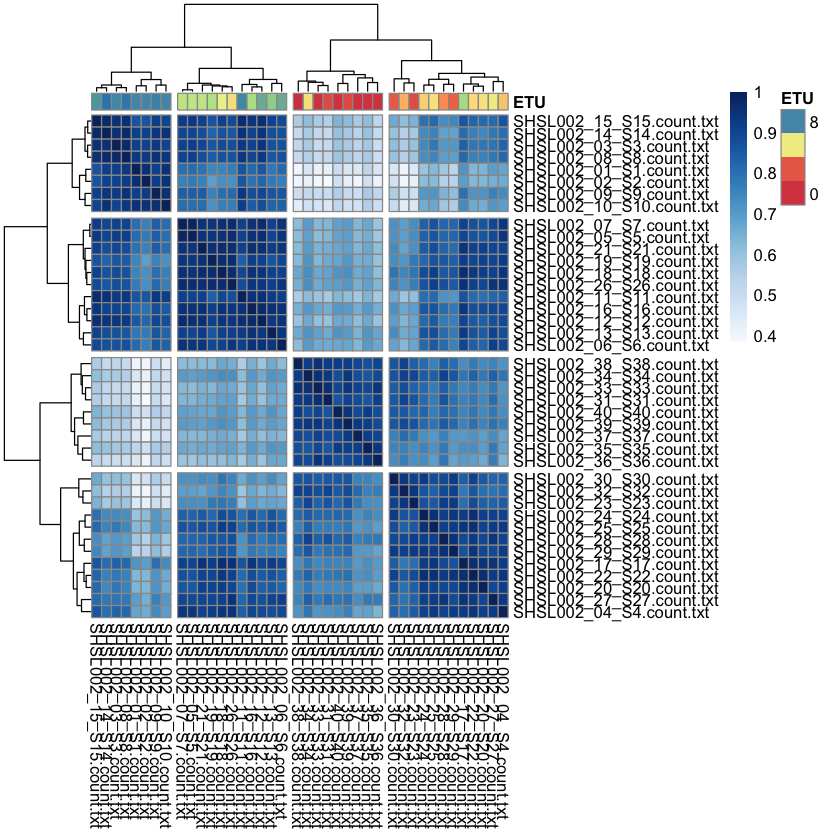

In [86]:

ordered_genes <- selected_genes[,order(df$ETU)]
sampleDists <- as.dist((1-abs(cor(ordered_genes))))
sampleDistMatrix <- as.matrix( sampleDists )
#rownames(sampleDistMatrix) <- paste( rld$dex, rld$cell, sep = " - " )
#colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette( brewer.pal(9, "Blues") )(255)

an_col <- data.frame(df$ETU)
rownames(an_col) <- df$name
colnames(an_col)[1] <- "ETU"

an_colors <- list ( ETU = as.character(df$ETU_color))

pheatmap(1-sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=T, cluster_cols=T,
         cutree_rows=4, cutree_cols=4,
         col = colors,
         annotation_col = an_col,
         annotation_colors = an_colors)

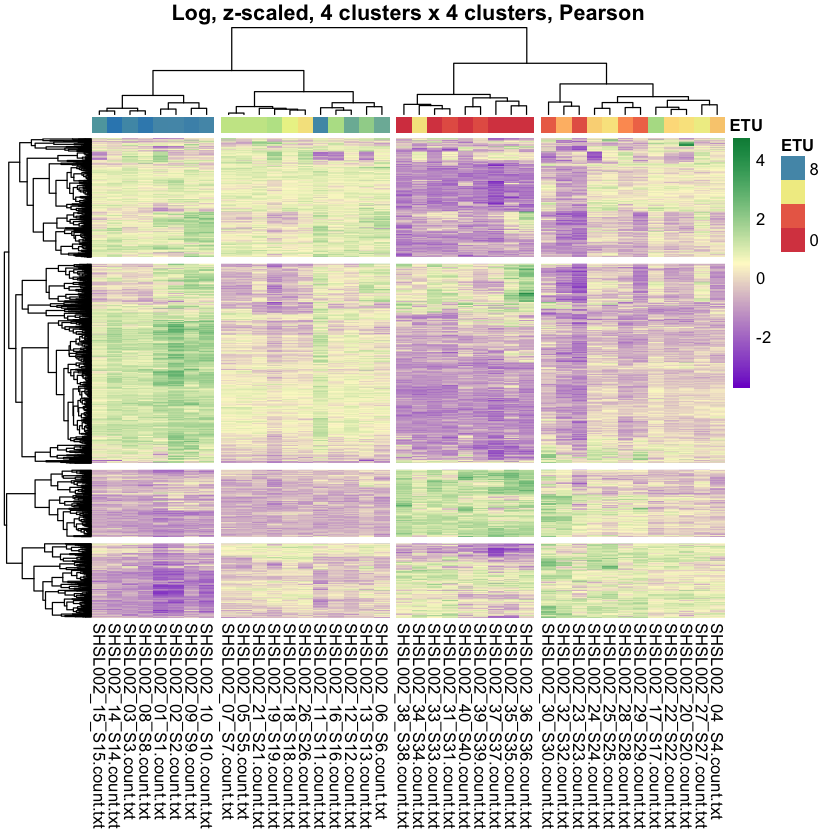

In [87]:
#samples x genes

geneDists <- as.dist((1 - cor(t(ordered_genes))))
geneDistMatrix <- as.matrix( geneDists )

colors <- colorRampPalette( c("purple3", "lemonchiffon1", "springgreen4") )(200)

pheatmap(t(scale(t(ordered_genes))),
          clustering_distance_rows = geneDists,
          clustering_distance_cols = sampleDists,
          cluster_rows=TRUE, cluster_cols=TRUE,
          show_rownames = F, show_colnames = T,
          cutree_cols=4, cutree_rows=4,
          annotation_col = an_col,
          annotation_colors = an_colors,
          col=colors, main="Log, z-scaled, 4 clusters x 4 clusters, Pearson")


Row.names,PC1,PC2,fit,name,ETU,DAS,tassel_height,k4_clust,k5_clust
SHSL002_01_S1.count.txt,-32.4197597,-16.2801679,-13.685934,SHSL002_01_S1.count.txt,9.57,45,12.051,1,1
SHSL002_02_S2.count.txt,-36.6569524,-16.2095714,-19.892226,SHSL002_02_S2.count.txt,9.75,45,10.015,1,1
SHSL002_03_S3.count.txt,-26.3840842,-2.7233960,-5.931393,SHSL002_03_S3.count.txt,8.32,45,11.391,2,2
SHSL002_04_S4.count.txt,-0.8327836,14.9203840,11.348332,SHSL002_04_S4.count.txt,4.88,42,4.786,3,3
SHSL002_05_S5.count.txt,-14.1470226,7.1444060,5.628308,SHSL002_05_S5.count.txt,6.72,42,7.504,2,2
SHSL002_06_S6.count.txt,-15.4151434,-0.2476493,4.700856,SHSL002_06_S6.count.txt,7.35,42,7.891,2,2


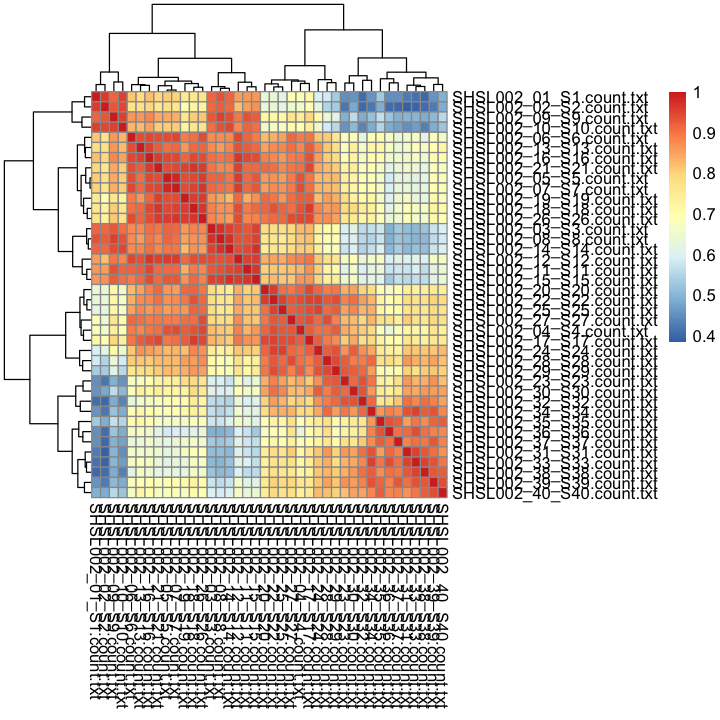

In [78]:
genePheat <- pheatmap(1-sampleDistMatrix)

## add cluster info to sample dataframe and export

df.pre <- df
rownames(df.pre) <- df[,4]

geneClust <- data.frame(cutree(genePheat$tree_row, k = 4))

df.clust <- merge(df.pre, geneClust, by=0, all=TRUE)
colnames(df.clust)[9] <- "k4_clust"

df.clust[,1] <- NULL
rownames(df.clust) <- df.clust[,4]

geneClust <- data.frame(cutree(genePheat$tree_row, k = 5))

df.clust <- merge(df.clust, geneClust, by=0, all=TRUE)
colnames(df.clust)[10] <- "k5_clust"

write.table(df.clust, "./deseq/geneClust_info.txt", sep="\t", quote=F)
head(df.clust)

In [40]:
# try to do some tree magic with dendextend
require (dendextend)
require (magrittr)

Loading required package: dendextend

---------------------
Welcome to dendextend version 1.6.0
Type citation('dendextend') for how to cite the package.

Type browseVignettes(package = 'dendextend') for the package vignette.
The github page is: https://github.com/talgalili/dendextend/

Suggestions and bug-reports can be submitted at: https://github.com/talgalili/dendextend/issues
Or contact: <tal.galili@gmail.com>

	To suppress this message use:  suppressPackageStartupMessages(library(dendextend))
---------------------


Attaching package: ‘dendextend’

The following object is masked from ‘package:spatstat’:

    rotate

The following object is masked from ‘package:rpart’:

    prune

The following object is masked from ‘package:stats’:

    cutree

Loading required package: magrittr


In [90]:
class(sampleDistMatrix)

[1] "matrix"

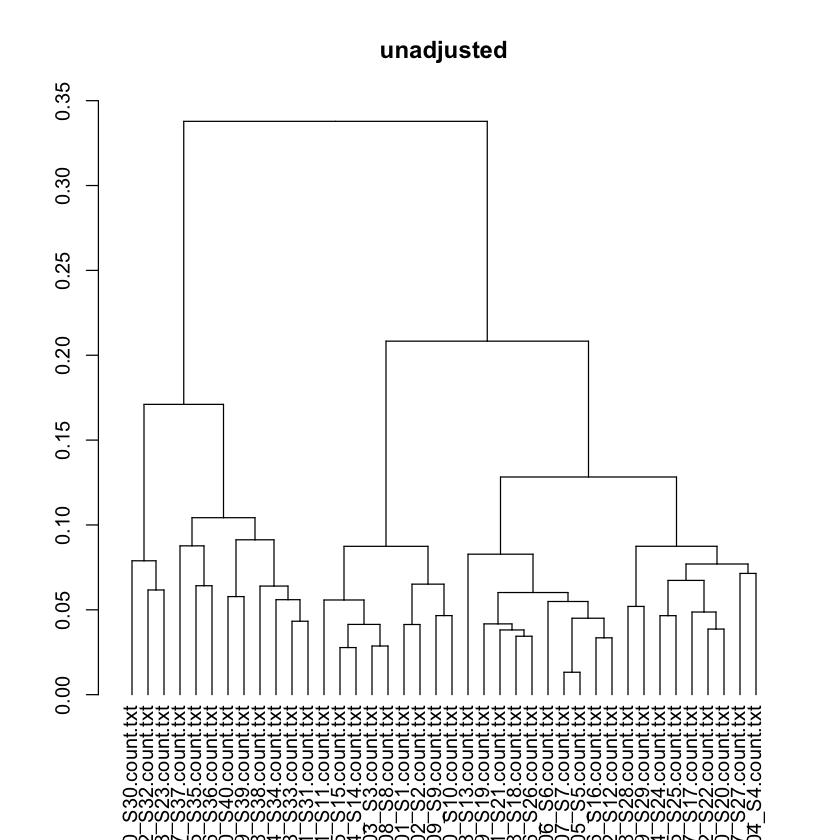

In [224]:
dend <-  sampleDists %>% # recall a distance matrix from above, 
         hclust(method = "average") %>% # on it compute hierarchical clustering using the "average" method, 
         as.dendrogram # turn that object into a dendrogram.
dend %>% plot(main="unadjusted") # plot it


[1] "SHSL002_30_S30.count.txt" "SHSL002_32_S32.count.txt"
 [3] "SHSL002_23_S23.count.txt" "SHSL002_37_S37.count.txt"
 [5] "SHSL002_35_S35.count.txt" "SHSL002_36_S36.count.txt"
 [7] "SHSL002_40_S40.count.txt" "SHSL002_39_S39.count.txt"
 [9] "SHSL002_38_S38.count.txt" "SHSL002_34_S34.count.txt"
[11] "SHSL002_33_S33.count.txt" "SHSL002_31_S31.count.txt"
[13] "SHSL002_11_S11.count.txt" "SHSL002_15_S15.count.txt"
[15] "SHSL002_14_S14.count.txt" "SHSL002_03_S3.count.txt" 
[17] "SHSL002_08_S8.count.txt"  "SHSL002_01_S1.count.txt" 
[19] "SHSL002_02_S2.count.txt"  "SHSL002_09_S9.count.txt" 
[21] "SHSL002_10_S10.count.txt" "SHSL002_13_S13.count.txt"
[23] "SHSL002_19_S19.count.txt" "SHSL002_21_S21.count.txt"
[25] "SHSL002_18_S18.count.txt" "SHSL002_26_S26.count.txt"
[27] "SHSL002_06_S6.count.txt"  "SHSL002_07_S7.count.txt" 
[29] "SHSL002_05_S5.count.txt"  "SHSL002_16_S16.count.txt"
[31] "SHSL002_12_S12.count.txt" "SHSL002_28_S28.count.txt"
[33] "SHSL002_29_S29.count.txt" "SHSL002_24_S24.count.txt"
[35] "SHSL002_25_S25.count.txt" "SHSL002_17_S17.count.txt"
[37] "SHSL002_22_S22.count.txt" "SHSL002_20_S20.count.txt"
[39] "SHSL002_27_S27.count.txt" "SHSL002_04_S4.count.txt"

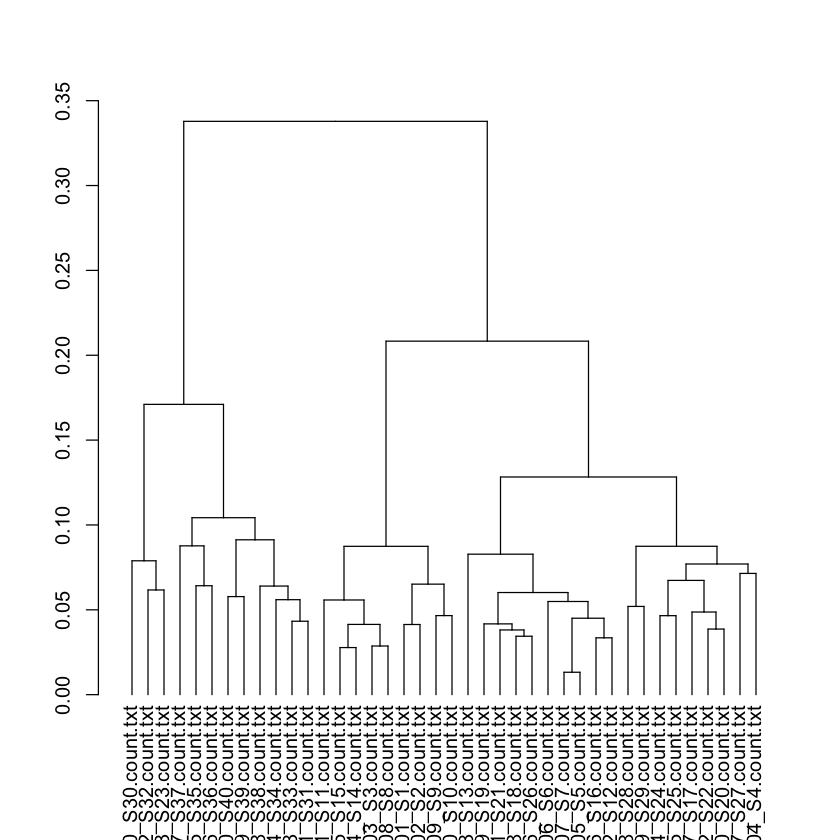

In [225]:
# current labels
old.labels <- labels(dend)
labels(dend)

# split out library name
split.labels <- strsplit(labels(dend), "_")
simple.labels <- matrix(unlist(split.labels), ncol=3, byrow=TRUE)[,2]

# relabel dendrogram object with library names
short.dend <- dend %>% set("labels", simple.labels)
plot(dend)

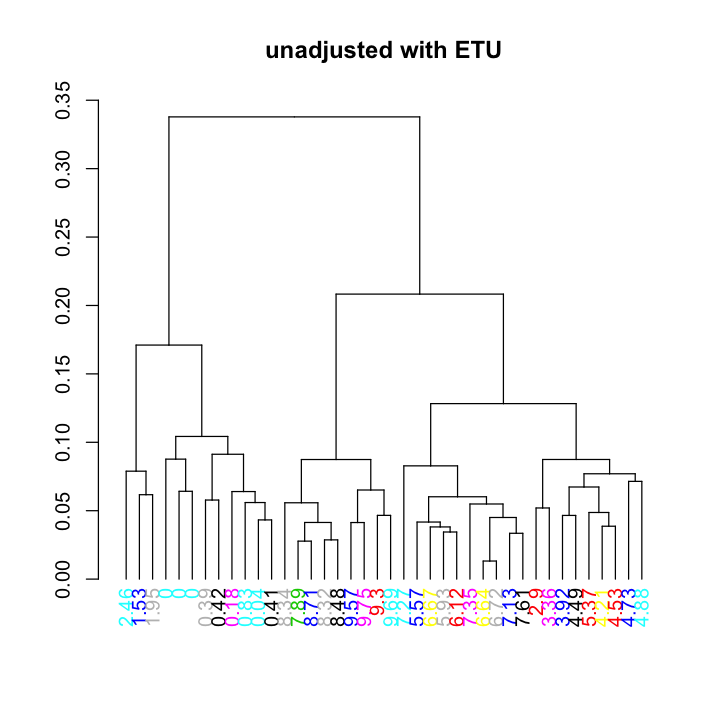

In [81]:
# match labels to ETU
temp <- df
rownames(temp) <- df$name
labels.ETU <- temp[old.labels,]$ETU

# replace labels with ETU
dend %>% set("labels", labels.ETU) %>% 
set("labels_col", 10*(labels.ETU+0.5)) %>%
plot(main="unadjusted with ETU")

In [299]:
#Order current labels by their ETU
#Use that order to sort tree

sortlabels.ETU <- temp[order(temp$ETU),4]
sortlabels.ETU



[1] SHSL002_35_S35.count.txt SHSL002_36_S36.count.txt SHSL002_37_S37.count.txt
 [4] SHSL002_33_S33.count.txt SHSL002_38_S38.count.txt SHSL002_40_S40.count.txt
 [7] SHSL002_31_S31.count.txt SHSL002_39_S39.count.txt SHSL002_34_S34.count.txt
[10] SHSL002_32_S32.count.txt SHSL002_23_S23.count.txt SHSL002_30_S30.count.txt
[13] SHSL002_28_S28.count.txt SHSL002_29_S29.count.txt SHSL002_24_S24.count.txt
[16] SHSL002_22_S22.count.txt SHSL002_25_S25.count.txt SHSL002_20_S20.count.txt
[19] SHSL002_27_S27.count.txt SHSL002_04_S4.count.txt  SHSL002_17_S17.count.txt
[22] SHSL002_19_S19.count.txt SHSL002_18_S18.count.txt SHSL002_26_S26.count.txt
[25] SHSL002_07_S7.count.txt  SHSL002_21_S21.count.txt SHSL002_05_S5.count.txt 
[28] SHSL002_16_S16.count.txt SHSL002_13_S13.count.txt SHSL002_06_S6.count.txt 
[31] SHSL002_12_S12.count.txt SHSL002_15_S15.count.txt SHSL002_03_S3.count.txt 
[34] SHSL002_11_S11.count.txt SHSL002_08_S8.count.txt  SHSL002_14_S14.count.txt
[37] SHSL002_09_S9.count.txt  SHSL002_01_S1.count.txt  SHSL002_10_S10.count.txt
[40] SHSL002_02_S2.count.txt 
40 Levels: SHSL002_01_S1.count.txt ... SHSL002_40_S40.count.txt

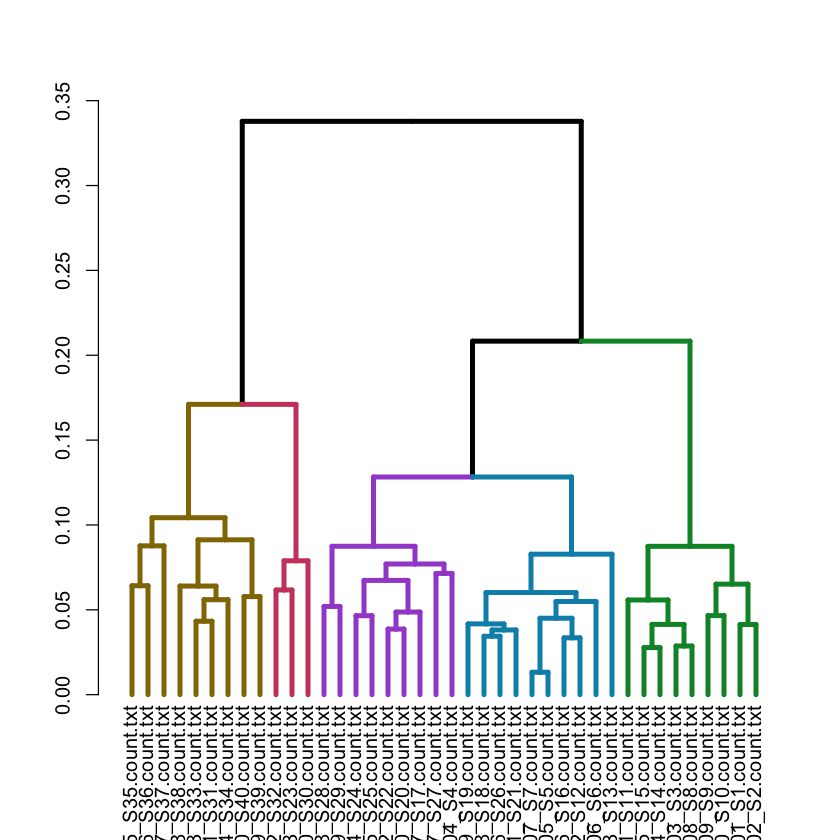

In [377]:
relab.dend <- dend %>% set("branches_k_color", k = 5) %>% 
            set("branches_lwd", 4) %>% 
            rotate (as.character(sortlabels.ETU)) 
plot (relab.dend)

[1] "SHSL002_35_S35.count.txt" "SHSL002_36_S36.count.txt"
 [3] "SHSL002_37_S37.count.txt" "SHSL002_38_S38.count.txt"
 [5] "SHSL002_33_S33.count.txt" "SHSL002_31_S31.count.txt"
 [7] "SHSL002_34_S34.count.txt" "SHSL002_40_S40.count.txt"
 [9] "SHSL002_39_S39.count.txt" "SHSL002_32_S32.count.txt"
[11] "SHSL002_23_S23.count.txt" "SHSL002_30_S30.count.txt"
[13] "SHSL002_28_S28.count.txt" "SHSL002_29_S29.count.txt"
[15] "SHSL002_24_S24.count.txt" "SHSL002_25_S25.count.txt"
[17] "SHSL002_22_S22.count.txt" "SHSL002_20_S20.count.txt"
[19] "SHSL002_17_S17.count.txt" "SHSL002_27_S27.count.txt"
[21] "SHSL002_04_S4.count.txt"  "SHSL002_19_S19.count.txt"
[23] "SHSL002_18_S18.count.txt" "SHSL002_26_S26.count.txt"
[25] "SHSL002_21_S21.count.txt" "SHSL002_07_S7.count.txt" 
[27] "SHSL002_05_S5.count.txt"  "SHSL002_16_S16.count.txt"
[29] "SHSL002_12_S12.count.txt" "SHSL002_06_S6.count.txt" 
[31] "SHSL002_13_S13.count.txt" "SHSL002_11_S11.count.txt"
[33] "SHSL002_15_S15.count.txt" "SHSL002_14_S14.count.txt"
[35] "SHSL002_03_S3.count.txt"  "SHSL002_08_S8.count.txt" 
[37] "SHSL002_09_S9.count.txt"  "SHSL002_10_S10.count.txt"
[39] "SHSL002_01_S1.count.txt"  "SHSL002_02_S2.count.txt"

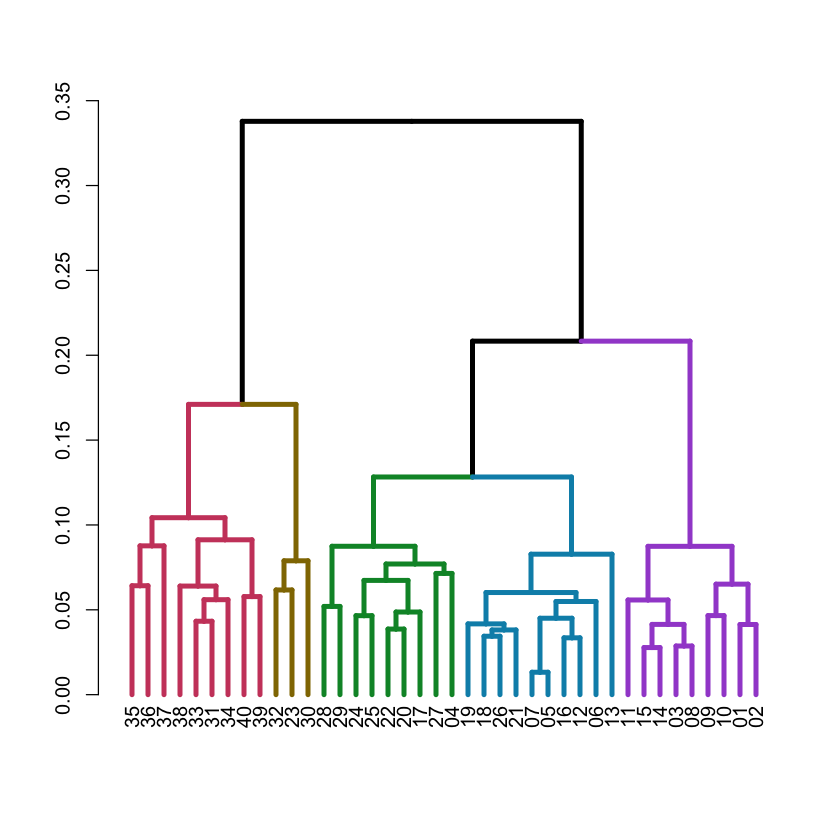

In [378]:
# current labels
old.relabels <- labels(relab.dend)
labels(relab.dend)

# split out library name
split.labels <- strsplit(labels(relab.dend), "_")
simple.labels <- matrix(unlist(split.labels), ncol=3, byrow=TRUE)[,2]

# relabel dendrogram object with library names
shortre.dend <- relab.dend %>% set("labels", simple.labels) %>% set("branches_k_color", k = 5)
plot(shortre.dend)

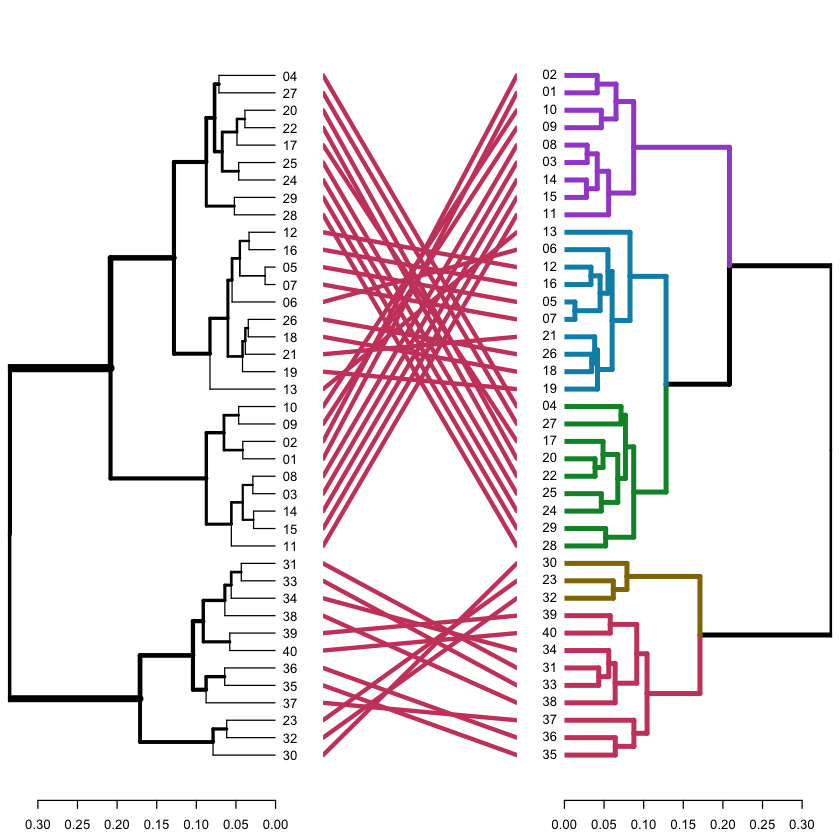

In [379]:
# check that it worked
changes <- dendlist(short.dend, shortre.dend)
tanglegram(changes)

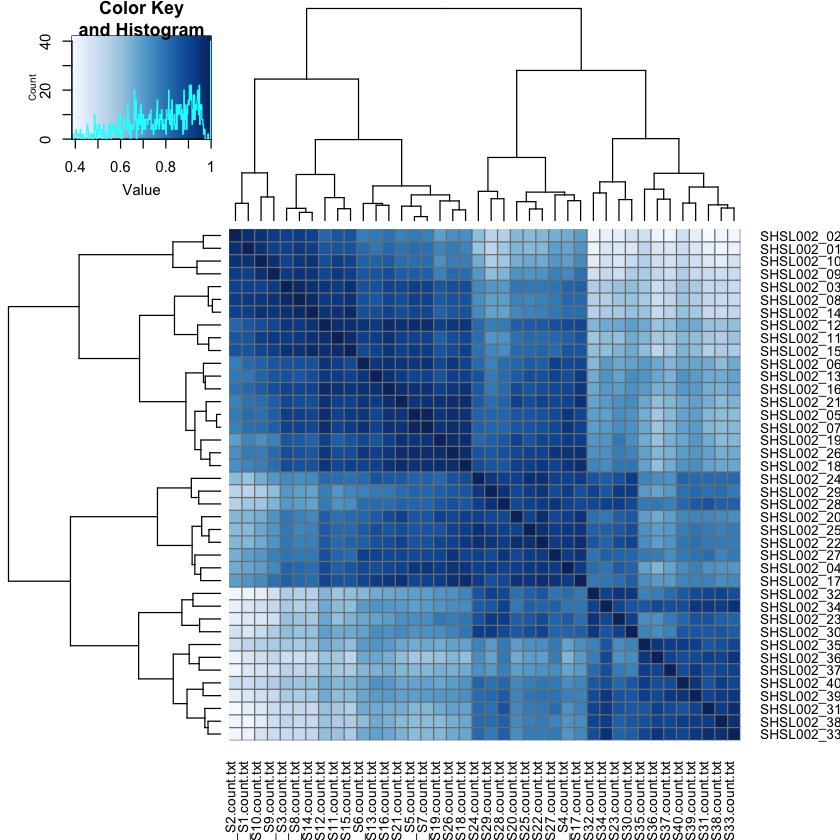

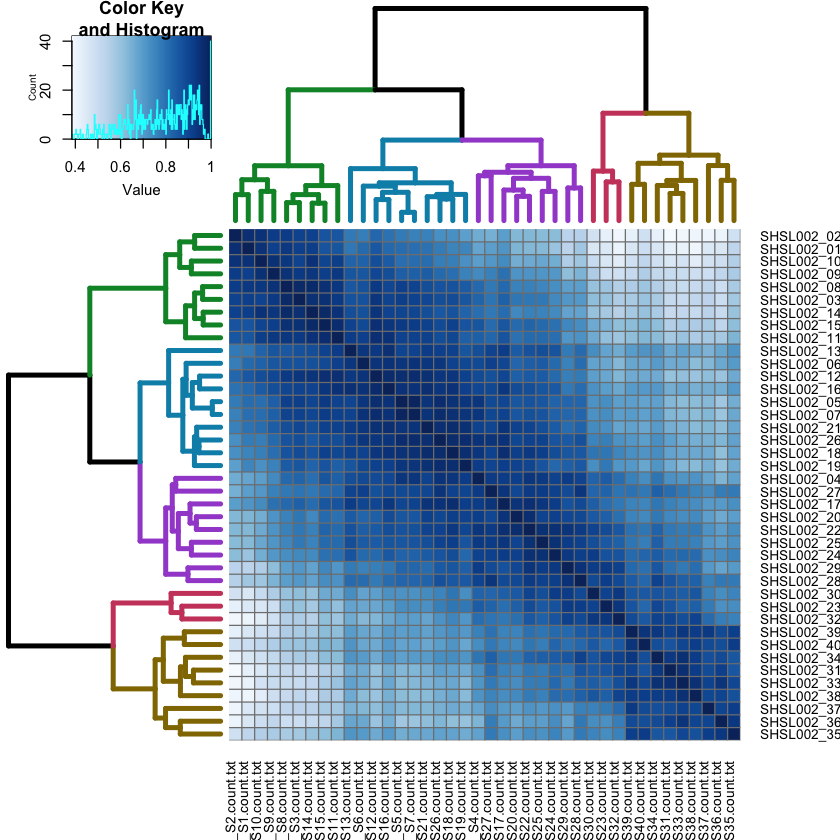

In [380]:
# try to use new dendrogram with heatmap.2
# bummer that pheatmap might not be compatible?

require (gplots)

#without ETU ordering
colors <- colorRampPalette( brewer.pal(9, "Blues") )(255)
heatmap.2 (1-sampleDistMatrix, 
           trace = "none",
           col = colors,
           symm=T, revC=T,
           sepcolor='grey50',
           sepwidth=c(0.0001,0.0001),
           colsep=1:ncol(sampleDistMatrix),
           rowsep=1:nrow(sampleDistMatrix)
          )
#with ETU ordering
heatmap.2 (1-sampleDistMatrix, 
           Rowv = relab.dend, 
           Colv = rev(relab.dend),
           trace = "none",
           col = colors,
           sepcolor='grey50',
           sepwidth=c(0.0001,0.0001),
           colsep=1:ncol(sampleDistMatrix),
           rowsep=1:nrow(sampleDistMatrix)
          )

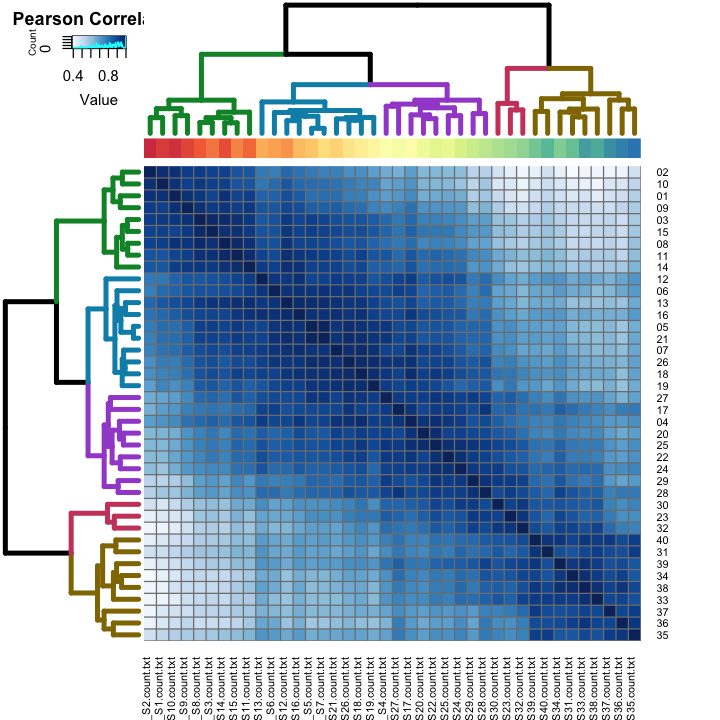

In [629]:
#not sure if ETU ordering is more believable -- maybe signifies that development is more continuous than discrete
#anyway, try adding in ETU colorbar, just for comparison

#get dendrogram labels, in order
den.labels <- colnames(sampleDistMatrix)

#get ETU values from dendrogram labels
den.ETUs <- temp[den.labels,]$ETU

#create color palette to match -- try spectral
den.colors <- colorRampPalette( rev (brewer.pal(9, "Spectral")) )(length(den.ETUs))

#replot with ColSideColors
heatmap.2 (1-sampleDistMatrix, 
           Rowv = relab.dend, 
           Colv = rev(relab.dend),
           trace = "none",
           col = colors,
           ColSideColors = den.colors,
           sepcolor='grey50',
           sepwidth=c(0.0001,0.0001),
           colsep=1:ncol(sampleDistMatrix),
           rowsep=1:nrow(sampleDistMatrix),
           keysize = 1,
           key.title = "Pearson Correlation",
           labRow = as.vector(simple.labels),
           
          )


[1] "SHSL002_35_S35.count.txt" "SHSL002_36_S36.count.txt"
 [3] "SHSL002_37_S37.count.txt" "SHSL002_33_S33.count.txt"
 [5] "SHSL002_38_S38.count.txt" "SHSL002_40_S40.count.txt"
 [7] "SHSL002_31_S31.count.txt" "SHSL002_39_S39.count.txt"
 [9] "SHSL002_34_S34.count.txt" "SHSL002_32_S32.count.txt"
[11] "SHSL002_23_S23.count.txt" "SHSL002_30_S30.count.txt"
[13] "SHSL002_28_S28.count.txt" "SHSL002_29_S29.count.txt"
[15] "SHSL002_24_S24.count.txt" "SHSL002_22_S22.count.txt"
[17] "SHSL002_25_S25.count.txt" "SHSL002_20_S20.count.txt"
[19] "SHSL002_27_S27.count.txt" "SHSL002_04_S4.count.txt" 
[21] "SHSL002_17_S17.count.txt" "SHSL002_19_S19.count.txt"
[23] "SHSL002_18_S18.count.txt" "SHSL002_26_S26.count.txt"
[25] "SHSL002_07_S7.count.txt"  "SHSL002_21_S21.count.txt"
[27] "SHSL002_05_S5.count.txt"  "SHSL002_16_S16.count.txt"
[29] "SHSL002_13_S13.count.txt" "SHSL002_06_S6.count.txt" 
[31] "SHSL002_12_S12.count.txt" "SHSL002_15_S15.count.txt"
[33] "SHSL002_03_S3.count.txt"  "SHSL002_11_S11.count.txt"
[35] "SHSL002_08_S8.count.txt"  "SHSL002_14_S14.count.txt"
[37] "SHSL002_09_S9.count.txt"  "SHSL002_01_S1.count.txt" 
[39] "SHSL002_10_S10.count.txt" "SHSL002_02_S2.count.txt"

[1] "35" "36" "37" "33" "38" "40" "31" "39" "34" "32" "23" "30" "28" "29" "24"
[16] "22" "25" "20" "27" "04" "17" "19" "18" "26" "07" "21" "05" "16" "13" "06"
[31] "12" "15" "03" "11" "08" "14" "09" "01" "10" "02"

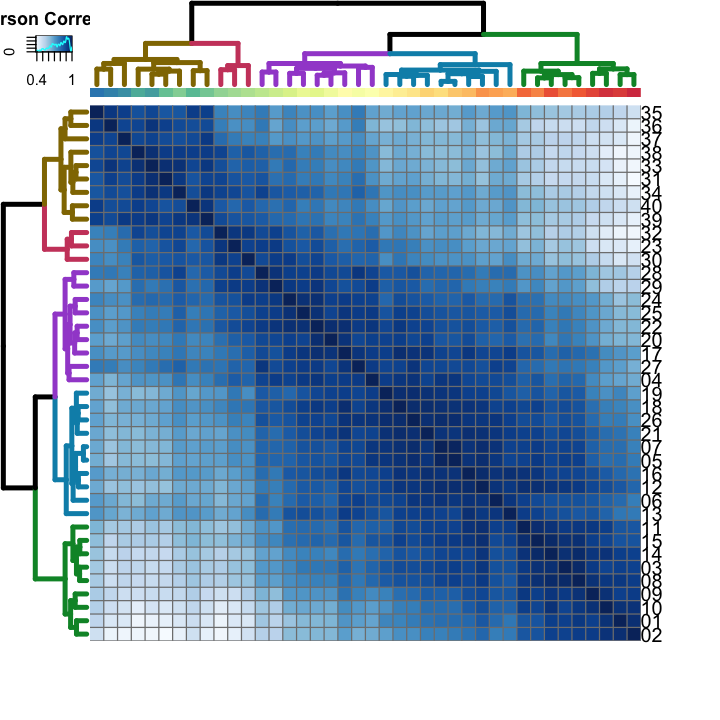

In [631]:
#Library labling looks really strange -- try relabeling the sample matrix directly

colnames(sampleDistMatrix)

# split out library name
split.Mlabels <- strsplit(colnames(sampleDistMatrix), "_")
simple.Mlabels <- matrix(unlist(split.Mlabels), ncol=3, byrow=TRUE)[,2]
simple.Mlabels
                          
# relabel heatmap with short library names
# looks like heatmap.2 wants the original matrix to be relabeled
# providing the tree-ordered label created the discrepancies
heatmap.2 (1-sampleDistMatrix, 
           Rowv = rev(relab.dend), 
           Colv = relab.dend,
           trace = "none",
           col = colors,
           ColSideColors = den.colors,
           sepcolor='grey50',
           sepwidth=c(0.0001,0.0001),
           colsep=1:ncol(sampleDistMatrix),
           rowsep=1:nrow(sampleDistMatrix),
           labRow = as.vector(simple.Mlabels),
           labCol = NA,
           density.info = 'density',
           cexRow = 1.5,
           srtRow = 0,
           offsetRow = -1,
           key = T,
           key.title = "Pearson Correlation",
           key.xlab= NA,
           key.ylab= NA,
           key.ytick = NULL,
           lhei = c(1,7),
           lwid = c(1,7)
          )


In [632]:
#save image

pdf(file="./deseq/ETU_ordered_heatmap_wDendro_k5.pdf", he=6, wi=6)
heatmap.2 (1-sampleDistMatrix, 
           Rowv = rev(relab.dend), 
           Colv = relab.dend,
           trace = "none",
           col = colors,
           ColSideColors = den.colors,
           sepcolor='black',
           #sepwidth=c(0,0),
           #colsep=1:ncol(sampleDistMatrix),
           #rowsep=1:nrow(sampleDistMatrix),
           labRow = as.vector(simple.Mlabels),
           labCol = NA,
           density.info = 'density',
           cexRow = 1.2,
           srtRow = 0,
           offsetRow = -1,
           key = F,
           key.title = "Pearson Correlation",
           key.xlab= NA,
           key.ylab= NA,
           key.ytick = NULL,
           lhei = c(1,7),
           lwid = c(1,7)
          )
dev.off()


quartz_off_screen 
                2

# Explore predicted stages and potential marker expression patterns
1. Retreve stage info
2. Look for DEG based on stage (GLM ordinal?)
3. Also call DEG based on ETU (in GLM mode)
4. Generate SOMs to summarize expression patterns for different DEG assignments 
    (likely needs to be summarized by stage)

In [41]:
#create stage info from dendrogram
tree_cut <- relab.dend %>% cutree(k=5) %>% data.frame 
colnames(tree_cut) <- "K5_stage"

head(tree_cut);

,K5_stage
SHSL002_35_S35.count.txt,1
SHSL002_36_S36.count.txt,1
SHSL002_37_S37.count.txt,1
SHSL002_33_S33.count.txt,1
SHSL002_38_S38.count.txt,1
SHSL002_40_S40.count.txt,1


lookin good, merge this with the ETU data

In [42]:
rownames(tree_cut)
stage_factors <- cbind(tree_cut, temp[rownames(tree_cut),]$ETU, temp[rownames(tree_cut),]$DAS, temp[rownames(tree_cut),]$tassel_height)
colnames (stage_factors) <- c("K5_stage", "ETU", "DAS", "tassel_height")
head(stage_factors)

[1] "SHSL002_35_S35.count.txt" "SHSL002_36_S36.count.txt"
 [3] "SHSL002_37_S37.count.txt" "SHSL002_33_S33.count.txt"
 [5] "SHSL002_38_S38.count.txt" "SHSL002_40_S40.count.txt"
 [7] "SHSL002_31_S31.count.txt" "SHSL002_39_S39.count.txt"
 [9] "SHSL002_34_S34.count.txt" "SHSL002_32_S32.count.txt"
[11] "SHSL002_23_S23.count.txt" "SHSL002_30_S30.count.txt"
[13] "SHSL002_28_S28.count.txt" "SHSL002_29_S29.count.txt"
[15] "SHSL002_24_S24.count.txt" "SHSL002_22_S22.count.txt"
[17] "SHSL002_25_S25.count.txt" "SHSL002_20_S20.count.txt"
[19] "SHSL002_27_S27.count.txt" "SHSL002_04_S4.count.txt" 
[21] "SHSL002_17_S17.count.txt" "SHSL002_19_S19.count.txt"
[23] "SHSL002_18_S18.count.txt" "SHSL002_26_S26.count.txt"
[25] "SHSL002_07_S7.count.txt"  "SHSL002_21_S21.count.txt"
[27] "SHSL002_05_S5.count.txt"  "SHSL002_16_S16.count.txt"
[29] "SHSL002_13_S13.count.txt" "SHSL002_06_S6.count.txt" 
[31] "SHSL002_12_S12.count.txt" "SHSL002_15_S15.count.txt"
[33] "SHSL002_03_S3.count.txt"  "SHSL002_11_S11.count.txt"
[35] "SHSL002_08_S8.count.txt"  "SHSL002_14_S14.count.txt"
[37] "SHSL002_09_S9.count.txt"  "SHSL002_01_S1.count.txt" 
[39] "SHSL002_10_S10.count.txt" "SHSL002_02_S2.count.txt"

ERROR: Error in data.frame(..., check.names = FALSE): arguments imply differing number of rows: 40, 0


[1] "ETU summary by stage"


$`1`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.1800  0.2522  0.4100  0.8300 

$`2`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.530   1.740   1.950   1.980   2.205   2.460 

$`3`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  2.900   3.920   4.490   4.266   4.730   5.370 

$`4`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  5.570   6.250   6.695   6.701   7.235   7.610 

$`5`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  7.890   8.340   8.710   8.894   9.570   9.750 


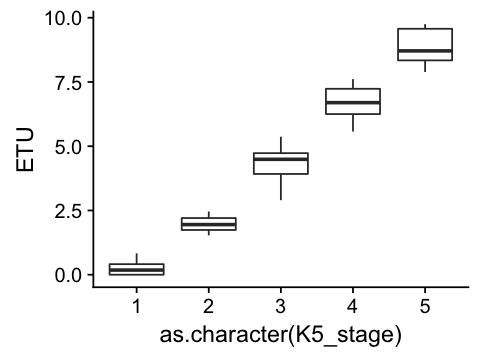

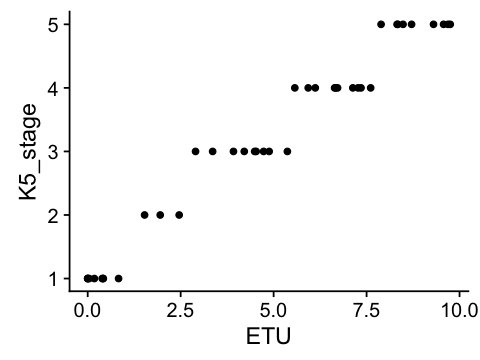

In [83]:
print("ETU summary by stage"); tapply(stage_factors$ETU, stage_factors$K5_stage, summary)
require(ggplot2)
options(repr.plot.width=4, repr.plot.height=3)
qplot(data=stage_factors, x=as.character(K5_stage), y=ETU, geom='boxplot')
qplot(data=stage_factors, x=ETU, y=K5_stage)

[1] "DAS summary by stage"


$`1`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  32.00   33.00   33.00   33.33   34.00   35.00 

$`2`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  35.00   35.50   36.00   36.33   37.00   38.00 

$`3`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  36.00   38.00   38.00   38.67   39.00   42.00 

$`4`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  38.00   39.25   40.50   40.40   41.75   42.00 

$`5`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  41.00   42.00   42.00   42.78   45.00   45.00 


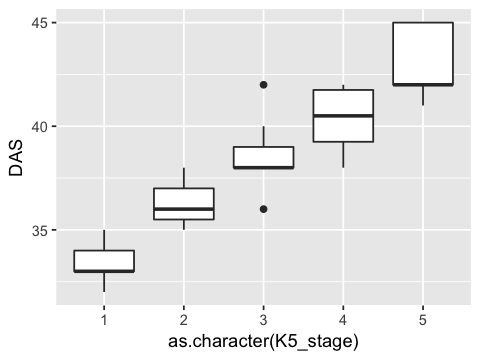

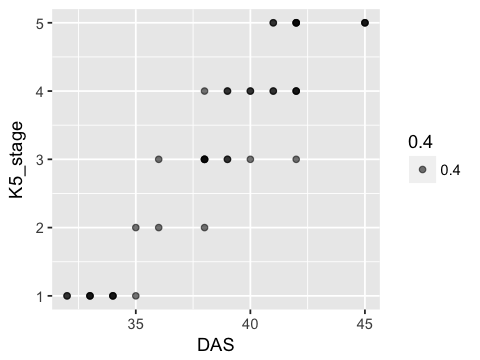

In [484]:
print("DAS summary by stage"); tapply(stage_factors$DAS, stage_factors$K5_stage, summary)
require(ggplot2)
options(repr.plot.width=4, repr.plot.height=3)
qplot(data=stage_factors, x=as.character(K5_stage), y=DAS, geom='boxplot')
qplot(data=stage_factors, x=DAS, y=K5_stage, alpha=0.4)

[1] "Tassel length summary by stage"


$`1`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.538   1.208   1.520   1.397   1.642   2.024 

$`2`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  2.043   2.506   2.968   2.667   2.978   2.989 

$`3`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  3.433   4.028   4.234   4.257   4.425   4.999 

$`4`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  5.127   6.607   6.944   6.982   7.487   8.749 

$`5`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  4.993   5.575   7.135   8.012  10.020  12.050 


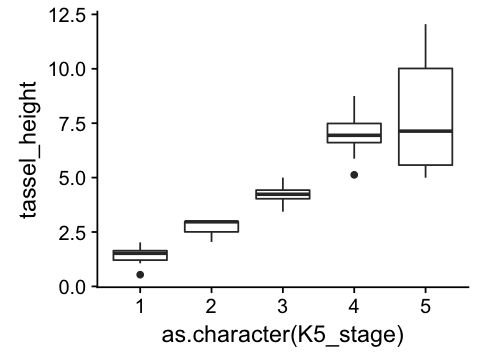

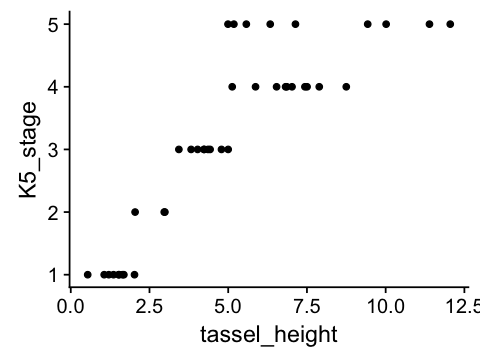

In [84]:
print("Tassel length summary by stage"); tapply(stage_factors$tassel_height, stage_factors$K5_stage, summary)
require(ggplot2)
options(repr.plot.width=4, repr.plot.height=3)
qplot(data=stage_factors, x=as.character(K5_stage), y=tassel_height, geom='boxplot')
qplot(data=stage_factors, x=tassel_height, y=K5_stage)

seems pretty useful.  *save*, to be used with morphological data

In [471]:
write.table(stage_factors, file="./deseq/ETU_K5_factors.txt", sep="\t", quote=F)

In [620]:
#create ETU model matrix and test add to DESeq object
coldata <- stage_factors[ order(row.names(stage_factors)), ]

#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = coldata,
                                design = ~ ETU,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)


using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


In [656]:
#create a VSD dataset to match DESeq filtering criteria
dds.vsd <- DESeqDataSetFromMatrix(countData = count,
                                colData = coldata,
                                design = ~ ETU,
                                tidy = F)
dds.vsd <- estimateSizeFactors(dds.vsd)
dds.vsd <- dds.vsd[ rowSums(counts(dds.vsd, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.vsd <- estimateDispersions(dds.vsd)
vsd <- varianceStabilizingTransformation(dds.vsd)
vsdWF <- assay(vsd)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


[1] "Intercept" "ETU"


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 7029, 28% 
LFC < 0 (down)   : 6793, 27% 
outliers [1]     : 43, 0.17% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



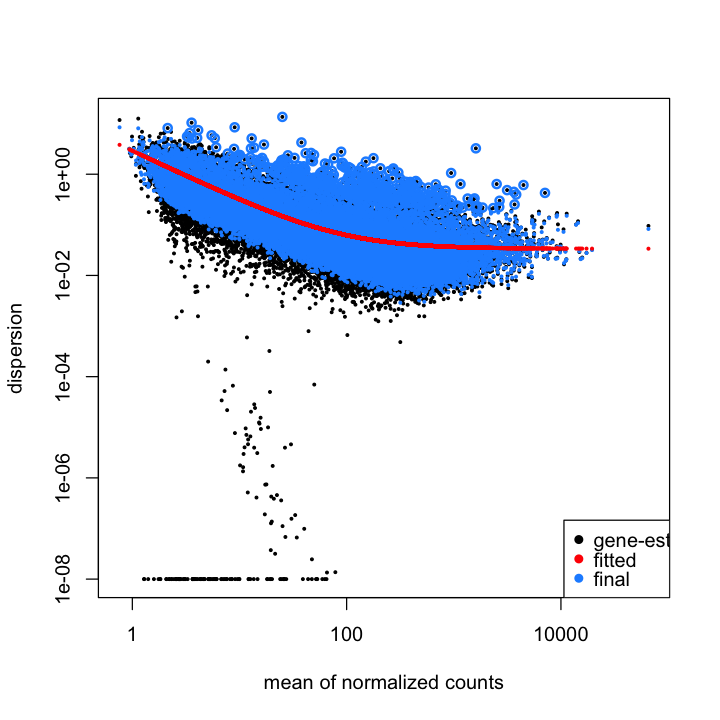

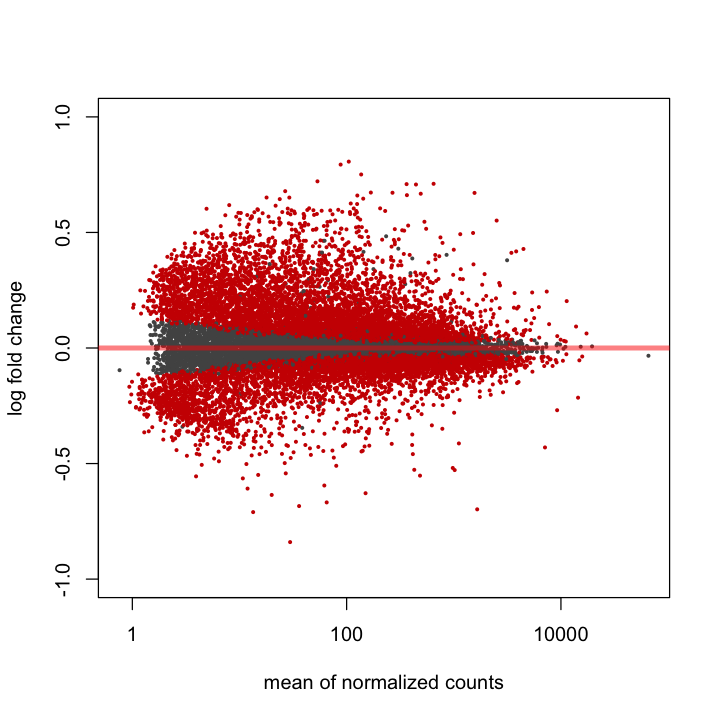

In [621]:
options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res <- results(ddsWF, contrasts=ETU, alpha=0.05)
summary(res)
plotMA(res, ylim=c(-1,1))

In [633]:
#Sort by log2FC
resOrdered <- res[rev(order(res$log2FoldChange)),]
resOrdered
#export as TSV
write.table(as.data.frame(resOrdered), 
            file="./deseq/ETU_affected_3s.5c.txt",
            sep="\t", quote=F)

log2 fold change (MAP): ETU 
Wald test p-value: ETU 
DataFrame with 24727 rows and 6 columns
                baseMean log2FoldChange      lfcSE      stat        pvalue
               <numeric>      <numeric>  <numeric> <numeric>     <numeric>
GRMZM2G085854  104.70976      0.8064827 0.03459300  23.31346 3.237332e-120
GRMZM2G063550   87.89740      0.7936516 0.03837862  20.67952  5.296212e-95
GRMZM2G447785  136.66282      0.7507937 0.04193730  17.90277  1.122029e-71
GRMZM2G333049   53.41209      0.7210992 0.03062049  23.54956 1.268357e-122
GRMZM2G158394  647.92511      0.7105071 0.03774393  18.82441  4.765141e-79
...                  ...            ...        ...       ...           ...
GRMZM2G124663   65.13941     -0.6681071 0.04685886 -14.25786  4.005350e-46
GRMZM2G118821   35.99994     -0.6839701 0.04588737 -14.90541  3.039392e-50
GRMZM2G460544 1653.90965     -0.6980896 0.03170333 -22.01944 1.875556e-107
GRMZM2G069016   13.41051     -0.7101046 0.05244633 -13.53964  9.122910e-42
GRMZM2G

In [58]:
write.csv(count, file="./B73_count.csv")
write.csv(vsdWF, file="./B73_vsdWF.csv")
write.csv(coldata, file="./B73_coldata.csv")

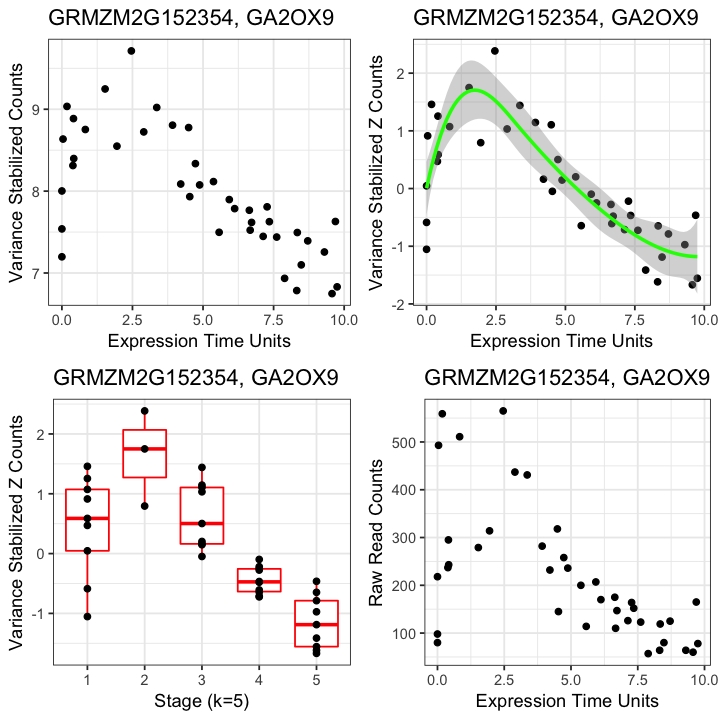

In [5]:
require(ggplot2)
require(cowplot)

GeneName <- "GA2OX9"
GID <- "GRMZM2G152354"
norm <- ggplot() +
            geom_point(aes(y=vsdWF[GID,], x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Variance Stabilized Counts") +
            ggtitle(paste(GID,GeneName, sep=", "))

zee <- ggplot() +
            geom_point(aes(y=scale(vsdWF[GID,]), x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Variance Stabilized Z Counts") +
            ggtitle(paste(GID,GeneName, sep=", ")) +
            geom_smooth(aes(y=scale(vsdWF[GID,]), x=coldata$ETU), method = "lm", formula = y ~ splines::bs(x, 5), color='green')

avg <- ggplot() +
            geom_boxplot(aes(y=scale(vsdWF[GID,]), x=coldata$K5_stage, group=coldata$K5_stage), color="red") +
            geom_point(aes(y=scale(vsdWF[GID,]), x=coldata$K5_stage)) +
            theme_bw() +
            xlab("Stage (k=5)") +
            ylab("Variance Stabilized Z Counts") +
            ggtitle(paste(GID,GeneName, sep=", ")) 
 

raw <- ggplot() +
            geom_point(aes(y=as.numeric(count[GID,]), x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Raw Read Counts") +
            ggtitle(paste(GID,GeneName, sep=", "))
            
options(repr.plot.width=6, repr.plot.height=6)
plot_grid(norm, zee, avg, raw)


In [6]:
#function to pull out plots for gene expression values
#requires GeneID and GeneName as input
#uses matrix of expression values, 'vsdWF'
#rownames are geneIDs, columns are samples

#builds formatted ggplots as variables: norm, zee, avg, and raw
#uses cowplot extension to ggsave to make grid of plots
#saves as pdf

plotGene <- function(GID, GeneName) {

    require(ggplot2)
    require(cowplot)

    #data from vsdWF -- already VSD normalized by DESeq2
    norm <- ggplot() +
            geom_point(aes(y=vsdWF[GID,], x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Variance Stabilized Counts") +
            ggtitle(paste(GID,GeneName, sep="   "))
    
    #z-scaled data from vsdWF with 5-knot smoothing spling
    zee <- ggplot() +
            geom_point(aes(y=scale(vsdWF[GID,]), x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Variance Stabilized Z Counts") +
            ggtitle(paste(GID,GeneName, sep="   ")) +
            geom_smooth(aes(y=scale(vsdWF[GID,]), x=coldata$ETU), method = "lm", formula = y ~ splines::bs(x, 5), color='green')

    #z-scaled data as boxplot by stage, defined in coldata$K5_stage
    avg <- ggplot() +
            geom_boxplot(aes(y=scale(vsdWF[GID,]), x=coldata$K5_stage, group=coldata$K5_stage), color="red") +
            geom_point(aes(y=scale(vsdWF[GID,]), x=coldata$K5_stage)) +
            theme_bw() +
            xlab("Stage (k=5)") +
            ylab("Variance Stabilized Z Counts") +
            ggtitle(paste(GID,GeneName, sep="   ")) 

    #raw, non-normalized counts as output from HTSeq-counts
    raw <- ggplot() +
            geom_point(aes(y=as.numeric(count[GID,]), x=coldata$ETU)) +
            theme_bw() +
            xlab("Expression Time Units") +
            ylab("Raw Read Counts") +
            ggtitle(paste(GID,GeneName, sep="   "))
            
    ggsave(file=paste("./deseq/geneplot_",GeneName,".pdf",sep=""), 
           plot=plot_grid(norm, zee, avg, raw),
           height=6, width=6, units="in",
           device="pdf")

    }



# GID_v3	MarkerName
GRMZM2G307119	BD1
GRMZM2G160917	UB2
GRMZM2G460544	UB3
GRMZM2G022489	CG1
GRMZM2G397518	BA1
GRMZM2G003927	RA1
AC233943.1_FG002	RA2
GRMZM2G014729	RA3
GRMZM2G130953	BIF1
GRMZM5G864847	BIF4
GRMZM2G171822	BIF2
GRMZM2G127308	VT2
GRMZM2G025222	SPI1
GRMZM2G307588	TSH4
GRMZM2G370777	TU1
GRMZM2G101511	TGA1
GRMZM2G160565	BDE1/ZAG3
GRMZM2G110242	WAB1/BAD1
GRMZM2G036297	LG1
GRMZM2G060216	LG2
GRMZM2G133331	FEA4
GRMZM2G300133	TD1

In [20]:
markers <- read.table (text=
"GRMZM2G303655	GRMZM2G303655
GRMZM2G426486	GRMZM2G426486
GRMZM2G160279	GRMZM2G160279
GRMZM2G110381	GRMZM2G110381
GRMZM5G838435	GRMZM5G838435
GRMZM2G126002	GRMZM2G126002
GRMZM2G125931	umc130
GRMZM2G011746	y9
GRMZM2G011355	GRMZM2G011355
GRMZM2G011136	GRMZM2G011136
GRMZM2G006042	arftf28
GRMZM2G106622	GRMZM2G106622
GRMZM2G083347	nactf67", 
header=F, sep="\t")

In [21]:
for (marker in 1:nrow(markers)) {
    plotGene( as.character(markers[marker,1]) , as.character(markers[marker,2]) )
    
}

In [55]:
plotGene("GRMZM2G148693", "zap1")

In [776]:
## lets do some SOM stuff

# all the packages needed for this analysis
# 'require' will load the package, if not already loaded into your workspace
# will return an error if the package is not available on your computer

require(kohonen)
require(reshape)
require(colorRamps)
require(ggplot2)

# read data into a data.frame named 'res'
# in this case, 'res <- t(scale(log(t(selected_genes))) as defined above
# the kohonen package works with a data type called a data.matrix
# it's easy to make from a data.frame

res <- t(scale(t(vsdWF)))
fitted_cpm <- data.matrix(res)



Loading required package: kohonen
Loading required package: reshape

Attaching package: ‘reshape’

The following objects are masked from ‘package:S4Vectors’:

    expand, rename

Loading required package: colorRamps


In [796]:
# use the kohonen package to create a 'grid' of nodes
# empirically test the largest grid you can produce without any empty nodes

som_grid <- somgrid(xdim=5, ydim=5, topo="hexagonal")

# run the clustering algorithm, rlen = number of iterations, alpha = decaying learning rate

som_model <- som(fitted_cpm, grid=som_grid, rlen=20000, alpha=c(0.15,0.01), keep.data = TRUE)


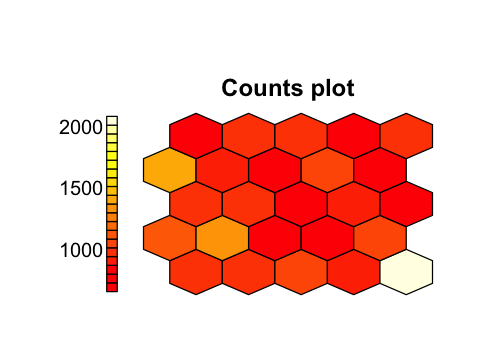

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  656.0   846.0   971.0   989.1  1013.0  2082.0 

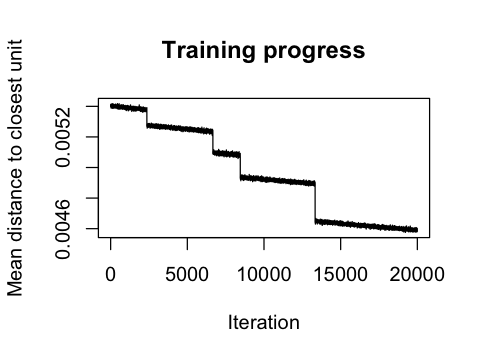

In [797]:
# might be fun to check some of the kohonen object diagnostic plots
# try one type at a type
options(repr.plot.width=4, repr.plot.height=3)
som_counts <- plot(som_model, type = "counts", shape = "straight")
plot(som_model, type = "changes")

summary(som_counts)


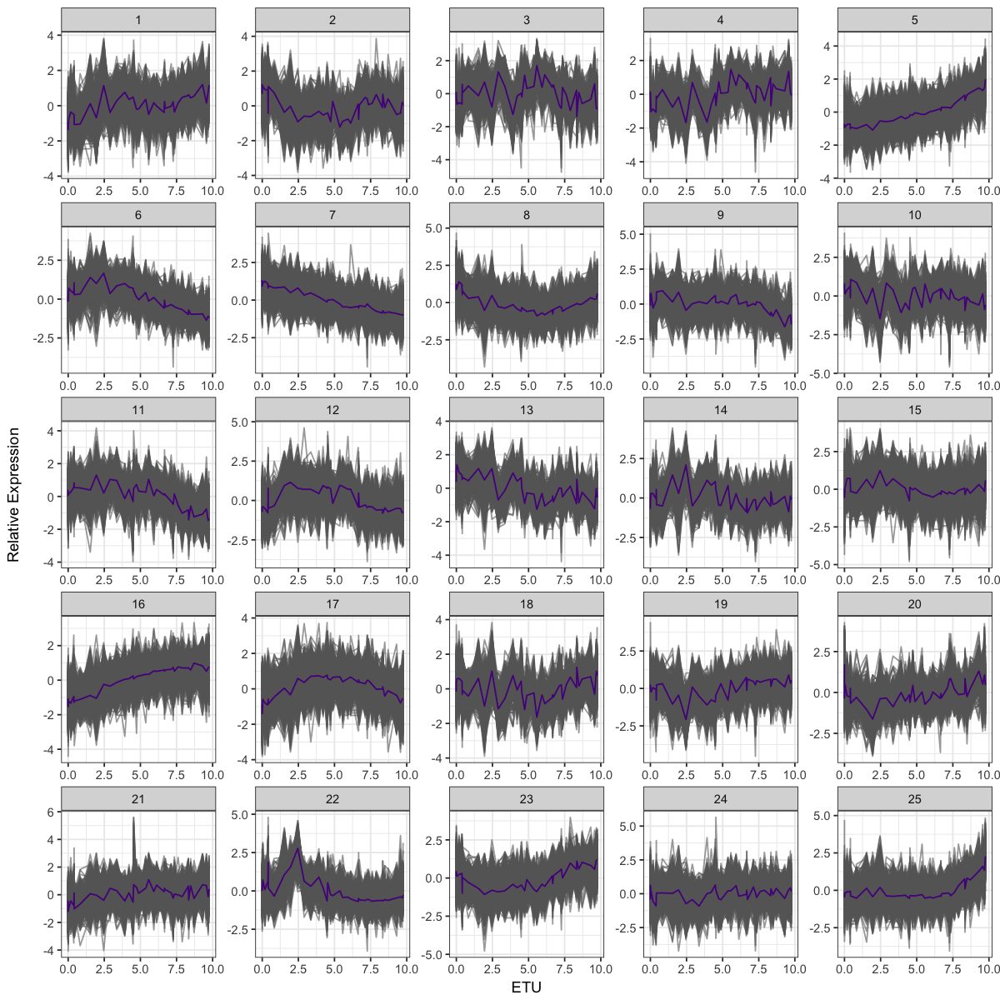

In [805]:
# extract and plot the data, but first write to file

som_result <- cbind(fitted_cpm, as.factor(som_model$unit.classif))
colnames(som_result)[ncol(som_result)] <- "Node"  # change last column name to Node
#write.table(som_result, file="SOM_10x10_Dec15.txt", sep="\t", quote=F)

# as a heatmap (dendrogram optional: dendrogram = c("both","row","column","none"))

#som_sorted <- som_result[order(som_result[,ncol(som_result)]),]
#som_colors <- primary.colors(length(levels(as.factor(som_model$unit.classif))))[som_result[,ncol(som_result)]]
#heatmap.2(t(som_result[,ncol(som_result)]), Rowv=F, Colv=F, scale="column", ColSideColors=som_colors, trace="none", col="topo.colors")

# as line graphs (this one was hard to code)


node_values <- as.matrix(data.frame(som_model$codes)) #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(data.frame(som_model$codes)))  #very ugly way to make clean rownames
colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(as.matrix(node_values), varnames=c("Node", "ETU"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

colnames(fitted_cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(fitted_cpm), varnames=c("GeneID", "ETU"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

#pdf(file="som_linegraph.pdf", wi=9, he=9)
# try one type at a type
options(repr.plot.width=10, repr.plot.height=10)
ggplot(data = somplot, aes(x=ETU, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=ETU, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
	facet_wrap(~Node, scales="free") + 
	ylab("Relative Expression")
#dev.off()


#Looks real bad, too many fine details
#try summarizing by stage??

In [869]:
stage_vsd <- t(scale(t(vsdWF)))

colnames(stage_vsd) <- coldata$K5_stage
stage_mean <- as.data.frame(sapply(unique(colnames(stage_vsd)), 
                                   function(col) rowMeans(stage_vsd[,colnames(stage_vsd) == col])))
                                       
head(stage_vsd); head(stage_mean)

,5,5,5,3,4,4,4,5,5,5,⋯,1,2,1,1,1,1,1,1,1,1
AC148152.3_FG005,0.1387583,2.1309008,-0.25342924,1.6705371,0.2026459,0.4911400,1.16968021,-1.18031253,-1.1803125,-1.1803125,⋯,-1.18031253,0.83577729,-0.3371547,-1.18031253,-1.18031253,-1.18031253,-1.18031253,-1.18031253,-1.1803125,-1.1803125
AC148152.3_FG008,2.0205577,2.3434671,1.99597123,-0.2378873,0.7375297,-0.2259252,-0.77510024,1.25665247,0.7941297,2.0047027,⋯,0.33950164,0.04176214,-0.5987594,-1.52417887,-0.77710034,-1.52417887,-1.52417887,-0.80193431,-0.6802620,-1.5241789
AC148167.6_FG001,-0.4573357,-0.7522169,1.93129718,-0.1474048,0.5307502,0.9173657,-0.08977124,-0.08820894,0.9241131,-1.1013498,⋯,-1.02515585,-1.86029087,-1.2914064,-0.69965333,0.01029649,0.72016620,1.11720739,0.03990793,-1.2774087,-0.5777872
AC149475.2_FG002,-0.1655265,0.3293864,0.46535452,0.7644881,0.7252210,1.0352557,1.19111002,0.55797854,-0.6199700,1.6308114,⋯,-0.86323891,0.82384756,1.1551487,0.44715993,-0.61778555,-0.43979041,-0.18043883,0.68699012,-0.3033175,0.5435005
AC149475.2_FG003,-1.8684264,-0.7223841,-0.88365708,-0.4538758,-1.0472122,-0.6720946,-1.05300988,-0.62798174,-0.9309380,0.5212044,⋯,1.71611878,1.73979946,1.3599036,0.02443697,-0.81206370,-0.09445888,0.05874847,1.59066684,-0.1134592,0.9901265
AC149475.2_FG005,0.4740566,-1.7754394,0.01473995,0.6656819,1.1451401,0.8538112,0.87373444,0.09056069,-1.1920253,-1.4914148,⋯,0.04996072,-0.24612342,-0.6120873,0.59901524,0.63142024,0.29376652,0.34132596,-1.26216585,0.1717913,-1.1847735


,5,3,4,2,1
AC148152.3_FG005,-0.2328527,0.26708512,0.75893422,0.62740710,-1.08662833
AC148152.3_FG008,1.3407804,-0.22552934,-0.02703974,-0.38386402,-0.95725221
AC148167.6_FG001,0.1497654,-0.05689564,0.65932186,-1.48173749,-0.33153706
AC149475.2_FG002,0.5780579,-0.85076628,0.21539411,-0.04259786,0.04758089
AC149475.2_FG003,-0.3742140,-0.08523079,-0.50132599,1.47608120,0.52444660
AC149475.2_FG005,-0.8064891,0.18228591,0.78874749,-0.43263332,-0.10797185


In [870]:
# read data into a data.frame named 'res'
# in this case, 'res <- t(scale(log(t(selected_genes))) as defined above
# the kohonen package works with a data type called a data.matrix
# it's easy to make from a data.frame

res <- stage_mean
cpm <- data.matrix(res)


In [920]:
# use the kohonen package to create a 'grid' of nodes
# empirically test the largest grid you can produce without any empty nodes

som_grid <- somgrid(xdim=20, ydim=20, topo="hexagonal")

# run the clustering algorithm, rlen = number of iterations, alpha = decaying learning rate

som_model <- som(cpm, grid=som_grid, rlen=50000, alpha=c(0.15,0.01), keep.data = TRUE)


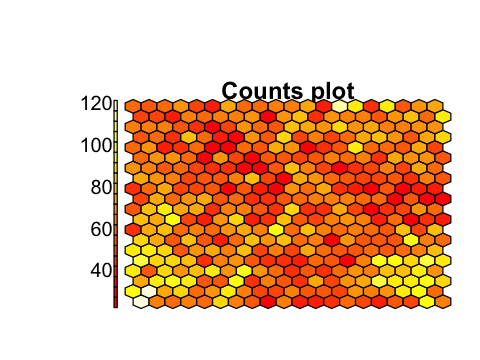

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  22.00   51.00   61.00   61.82   72.00  121.00 

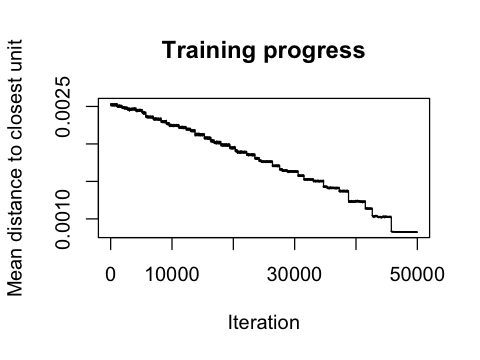

In [921]:
# might be fun to check some of the kohonen object diagnostic plots
# try one type at a type
options(repr.plot.width=4, repr.plot.height=3)
som_counts <- plot(som_model, type = "counts", shape = "straight")
plot(som_model, type = "changes")

summary(som_counts)

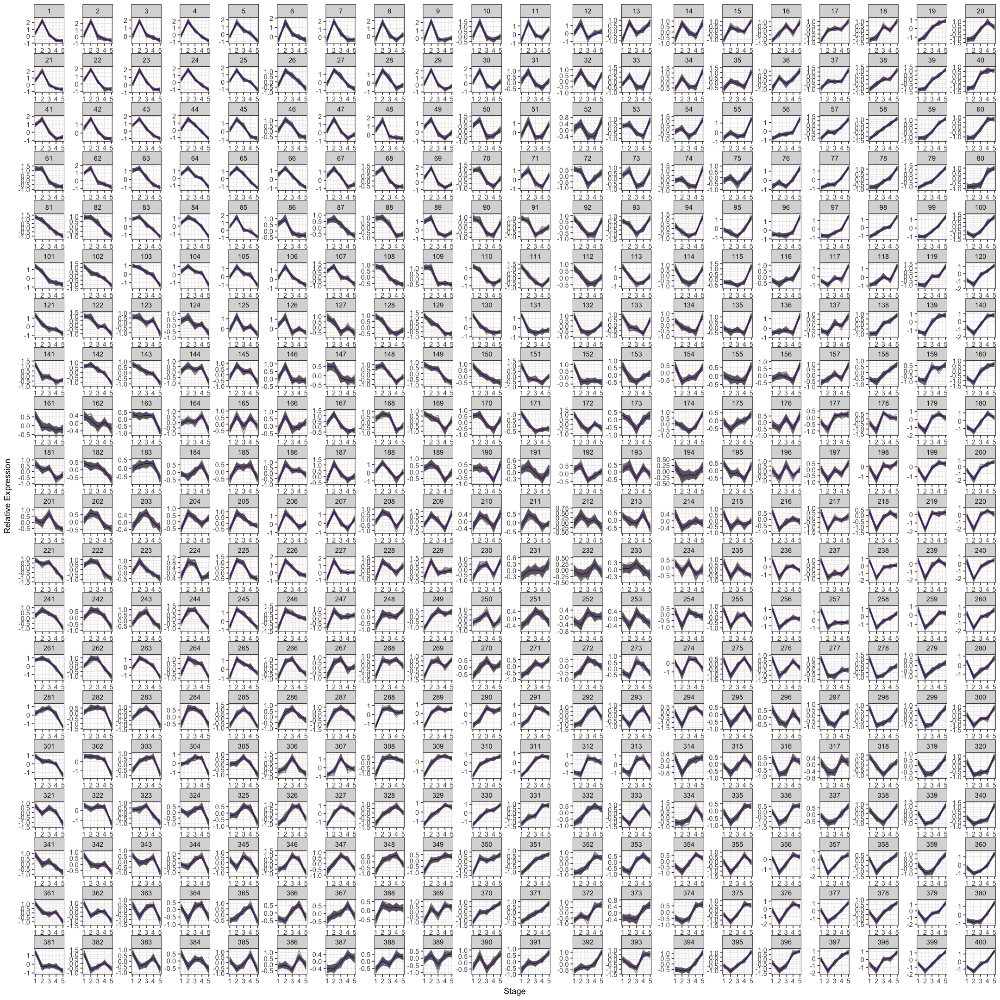

In [934]:
# extract and plot the data, but first write to file

som_result <- cbind(cpm, as.factor(som_model$unit.classif))
colnames(som_result)[ncol(som_result)] <- "Node"  # change last column name to Node
#write.table(som_result, file="SOM_10x10_Dec15.txt", sep="\t", quote=F)

# as a heatmap (dendrogram optional: dendrogram = c("both","row","column","none"))

#som_sorted <- som_result[order(som_result[,ncol(som_result)]),]
#som_colors <- primary.colors(length(levels(as.factor(som_model$unit.classif))))[som_result[,ncol(som_result)]]
#heatmap.2(t(som_result[,ncol(som_result)]), Rowv=F, Colv=F, scale="column", ColSideColors=som_colors, trace="none", col="topo.colors")

# as line graphs (this one was hard to code)


node_values <- som_model$codes[[1]] #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(som_model$codes[[1]]))  #very ugly way to make clean rownames
#colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(node_values, varnames=c("Node", "Stage"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

#colnames(cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(cpm), varnames=c("GeneID", "Stage"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

#pdf(file="som_linegraph.pdf", wi=9, he=9)
# try one type at a type
options(repr.plot.width=18, repr.plot.height=18)
ggplot(data = somplot, aes(x=Stage, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=Stage, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
    theme(panel.spacing= unit(1, "points")) +
	facet_wrap(~Node, scales="free", ncol=20) + 
	ylab("Relative Expression")
#dev.off()


# Still too many patterns, but it's looking much better
Data reduction is necessary.
Perhaps DEG between stages will help?

In [906]:
#create Stage K=5 model matrix and test add to DESeq object
coldata <- stage_factors[ order(row.names(stage_factors)), ]
coldata$K5_stage <- as.factor(coldata$K5_stage)

#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = coldata,
                                design = ~ K5_stage,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)


using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 55 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "K5_stage1" "K5_stage2" "K5_stage3" "K5_stage4" "K5_stage5"

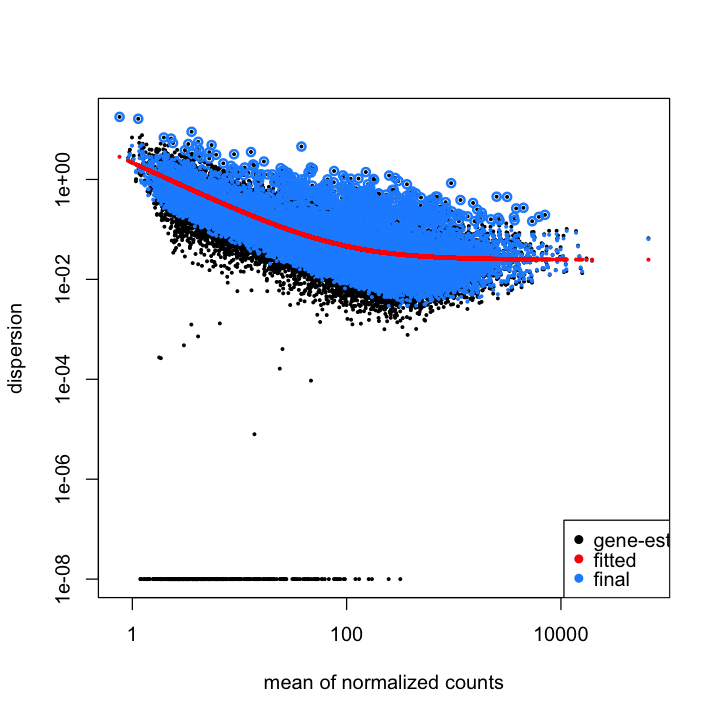

In [939]:
options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res54 <- results(ddsWF, contrast=list(c("K5_stage5","K5_stage4")), alpha=0.05)
res43 <- results(ddsWF, contrast=list(c("K5_stage4","K5_stage3")), alpha=0.05)
res32 <- results(ddsWF, contrast=list(c("K5_stage3","K5_stage2")), alpha=0.05)
res21 <- results(ddsWF, contrast=list(c("K5_stage2","K5_stage1")), alpha=0.05)



out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 7365, 30% 
LFC < 0 (down)   : 7008, 28% 
outliers [1]     : 33, 0.13% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



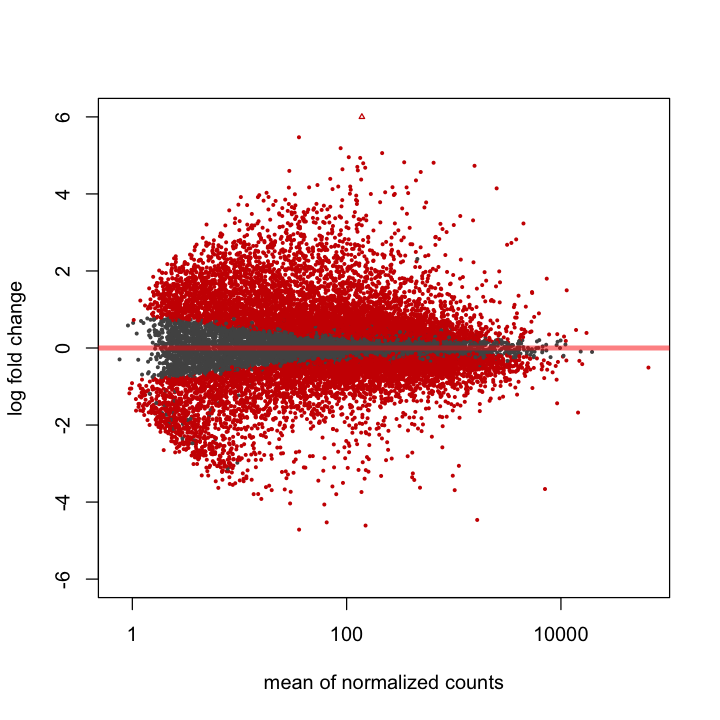

In [951]:
summary(res54);
plotMA(res54,ylim=c(-6,6));


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 3441, 14% 
LFC < 0 (down)   : 3995, 16% 
outliers [1]     : 33, 0.13% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



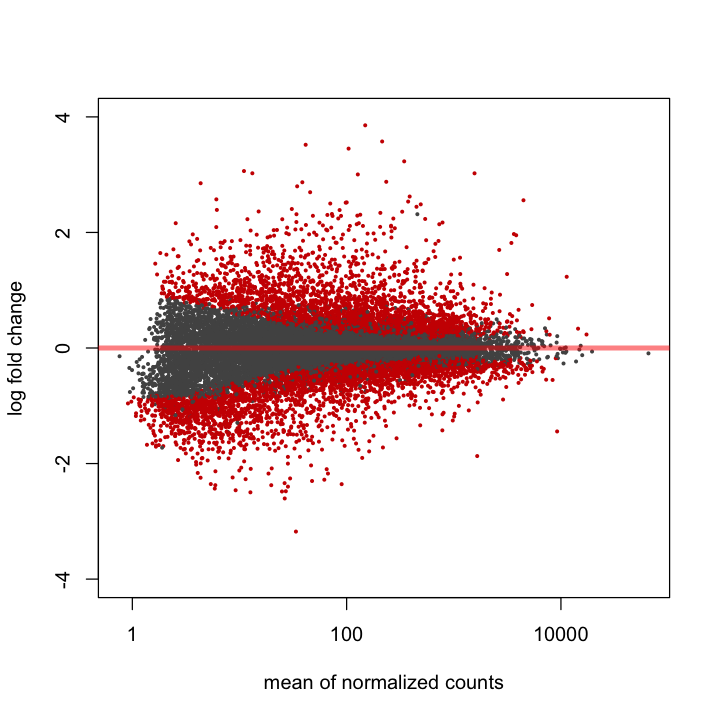

In [949]:
summary(res43);
plotMA(res43,ylim=c(-4,4));


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 5551, 22% 
LFC < 0 (down)   : 4877, 20% 
outliers [1]     : 33, 0.13% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



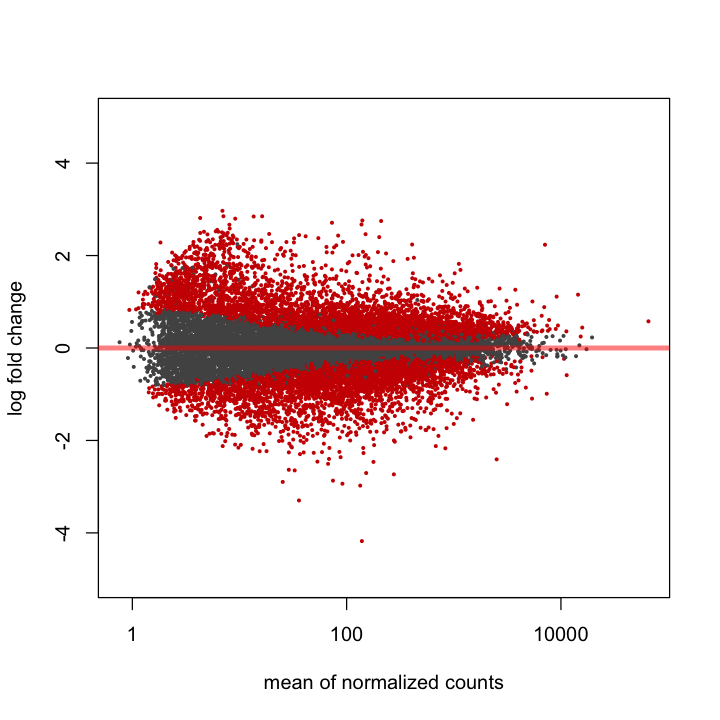

In [948]:
summary(res32);
plotMA(res32,ylim=c(-5,5));


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 6127, 25% 
LFC < 0 (down)   : 6106, 25% 
outliers [1]     : 33, 0.13% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



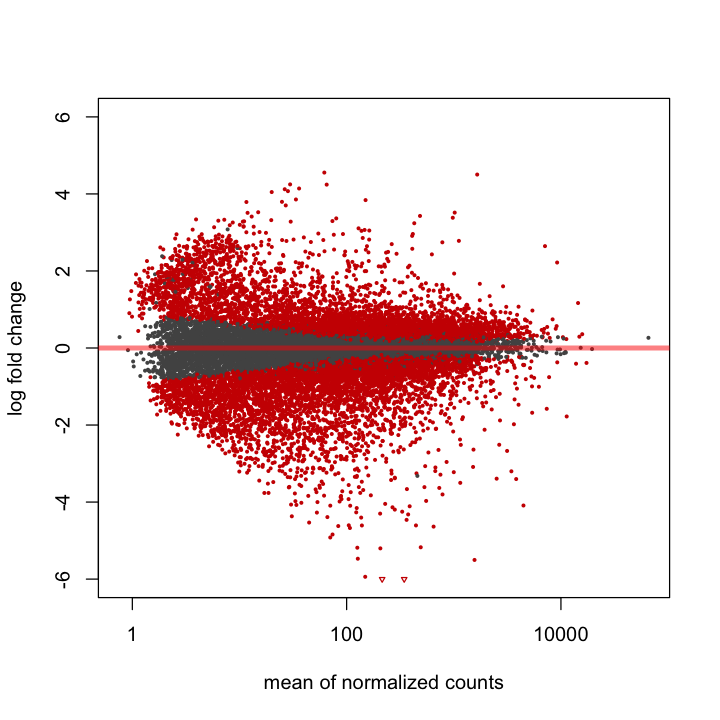

In [946]:
summary(res21);
plotMA(res21, ylim=c(-6,6));

In [956]:
pairwise.res <- cbind(res21,res32,res43,res54)
#export as TSV
write.table(as.data.frame(pairwise.res), 
            file="./deseq/continuous_pairwise_3s.5c.txt",
            sep="\t", quote=F)

In [987]:
#Filter by padj
pair_sigs <- c(rownames(subset(res21, padj < 0.05)), 
               rownames(subset(res32, padj < 0.05)), 
               rownames(subset(res43, padj < 0.05)), 
               rownames(subset(res54, padj < 0.05)))
#make into count table -- counts number of occurances in list
pair_table <- table(pair_sigs)
#appears 1+ times
dim(pair_table)
#appears 2+ times
dim(pair_table[pair_table > 1])
#appears 3+ times
dim(pair_table[pair_table > 2])
#appears 4 times
dim(pair_table[pair_table > 3])

[1] 18562

[1] 14599

[1] 9135

[1] 2174

In [991]:
#Try different subsets of total stage mean scaled values by DE thresholds
#DE 2+ times -- minmum for 'up' and 'down'
res <- stage_mean[rownames(pair_table > 3),]
cpm <- data.matrix(res)

In [998]:
# use the kohonen package to create a 'grid' of nodes
# empirically test the largest grid you can produce without any empty nodes

som_grid <- somgrid(xdim=20, ydim=20, topo="hexagonal")

# run the clustering algorithm, rlen = number of iterations, alpha = decaying learning rate

som_model <- som(cpm, grid=som_grid, rlen=50000, alpha=c(0.15,0.01), keep.data = TRUE)


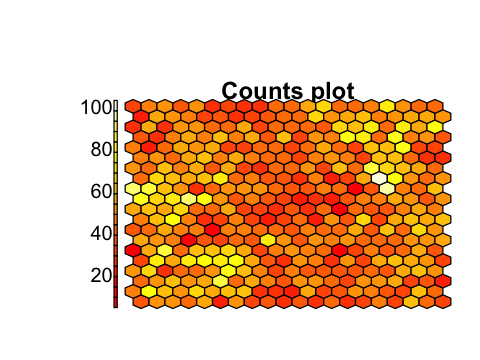

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.00   36.00   45.00   46.40   55.25  103.00 

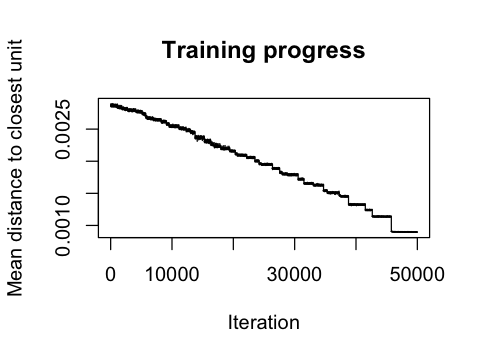

In [999]:
# might be fun to check some of the kohonen object diagnostic plots
# try one type at a type
options(repr.plot.width=4, repr.plot.height=3)
som_counts <- plot(som_model, type = "counts", shape = "straight")
plot(som_model, type = "changes")

summary(som_counts)

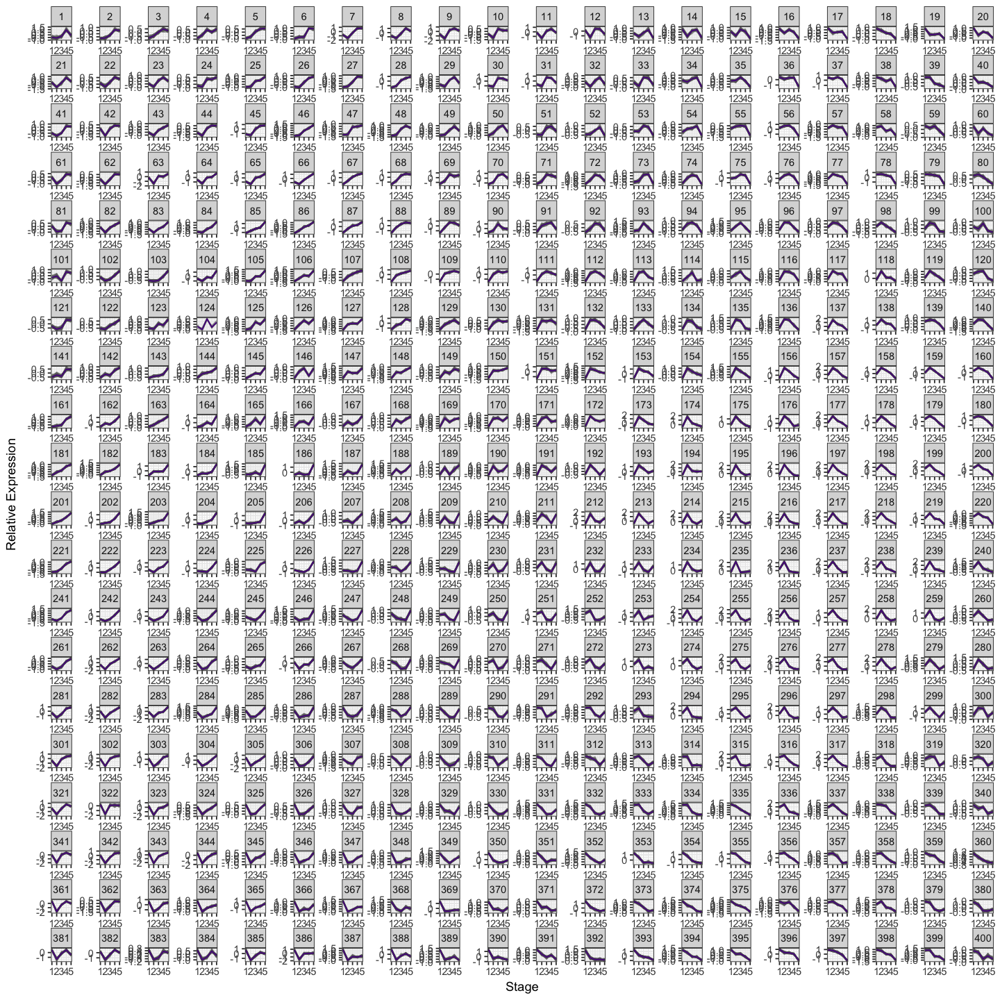

In [1000]:
# extract and plot the data, but first write to file

som_result <- cbind(cpm, as.factor(som_model$unit.classif))
colnames(som_result)[ncol(som_result)] <- "Node"  # change last column name to Node
#write.table(som_result, file="SOM_10x10_Dec15.txt", sep="\t", quote=F)

# as a heatmap (dendrogram optional: dendrogram = c("both","row","column","none"))

#som_sorted <- som_result[order(som_result[,ncol(som_result)]),]
#som_colors <- primary.colors(length(levels(as.factor(som_model$unit.classif))))[som_result[,ncol(som_result)]]
#heatmap.2(t(som_result[,ncol(som_result)]), Rowv=F, Colv=F, scale="column", ColSideColors=som_colors, trace="none", col="topo.colors")

# as line graphs (this one was hard to code)


node_values <- som_model$codes[[1]] #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(som_model$codes[[1]]))  #very ugly way to make clean rownames
#colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(node_values, varnames=c("Node", "Stage"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

#colnames(cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(cpm), varnames=c("GeneID", "Stage"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

#pdf(file="som_linegraph.pdf", wi=9, he=9)
# try one type at a type
options(repr.plot.width=12, repr.plot.height=12)
ggplot(data = somplot, aes(x=Stage, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=Stage, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
    theme(panel.spacing= unit(1, "points")) +
	facet_wrap(~Node, scales="free") + 
	ylab("Relative Expression")
#dev.off()


In [2]:
### try a random forest walk? 
#did you bring your boots?

require(randomForest)

#try forest on all genes, with ETU as a continuous response group
set.seed(1234)
print(date())
rf.1 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=1000)
rf.2 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=2000)
rf.3 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=3000)
rf.4 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=4000)
rf.5 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=5000)
rf.6 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=6000)
rf.7 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=7000)
rf.8 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=8000)
rf.9 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=9000)
rf.10 <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=10000)
print(date())

Loading required package: randomForest
randomForest 4.6-12
Type rfNews() to see new features/changes/bug fixes.


[1] "Wed Feb 14 23:47:22 2018"
[1] "Thu Feb 15 00:31:50 2018"


In [3]:
print(rf.1);print(rf.2);print(rf.3);print(rf.4);print(rf.5)
print(rf.6);print(rf.7);print(rf.8);print(rf.9);print(rf.10)


Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 1000) 
               Type of random forest: regression
                     Number of trees: 1000
No. of variables tried at each split: 8242

          Mean of squared residuals: 0.5216095
                    % Var explained: 94.95

Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 2000) 
               Type of random forest: regression
                     Number of trees: 2000
No. of variables tried at each split: 8242

          Mean of squared residuals: 0.4987676
                    % Var explained: 95.17

Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 3000) 
               Type of random forest: regression
                     Number of trees: 3000
No. of variables tried at each split: 8242

          Mean of squared residuals: 0.4668225
                    % Var explained: 95.48

Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 4000) 
               Type of random forest: regression
     

mtry = 3604  OOB error = 0.4550065 
Searching left ...
mtry = 3569 	OOB error = 0.4739478 
-0.04162859 0.01 
Searching right ...
mtry = 3640 	OOB error = 0.4694851 
-0.0318207 0.01 
     mtry  OOBError
3569 3569 0.4739478
3604 3604 0.4550065
3640 3640 0.4694851
[1] 3604


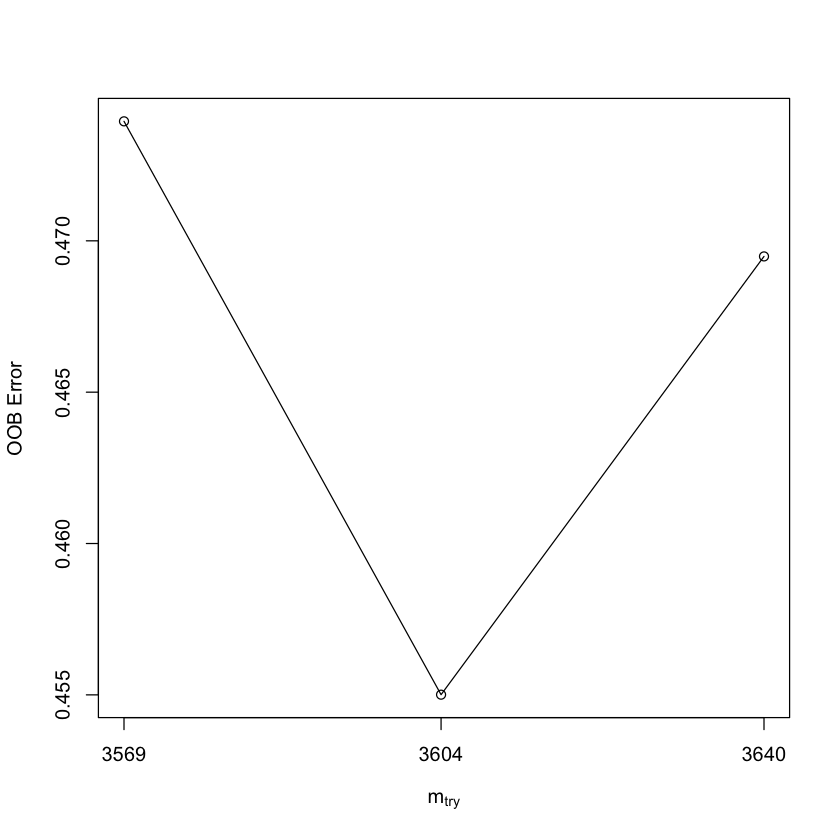

In [11]:
mtry <- tuneRF(x=t(vsdWF), y=coldata$ETU, ntreeTry=8000, mtryStart=3604,
               stepFactor=1.01,improve=0.01, trace=TRUE, plot=TRUE)
best.m <- mtry[mtry[, 2] == min(mtry[, 2]), 1]
print(mtry)
print(best.m)

In [12]:
print(date())
rf <- randomForest(x=t(vsdWF), y=coldata$ETU, ntree=8000, mtry=3604, importance=TRUE)
print(date())

[1] "Thu Feb 15 12:16:04 2018"
[1] "Thu Feb 15 12:19:17 2018"


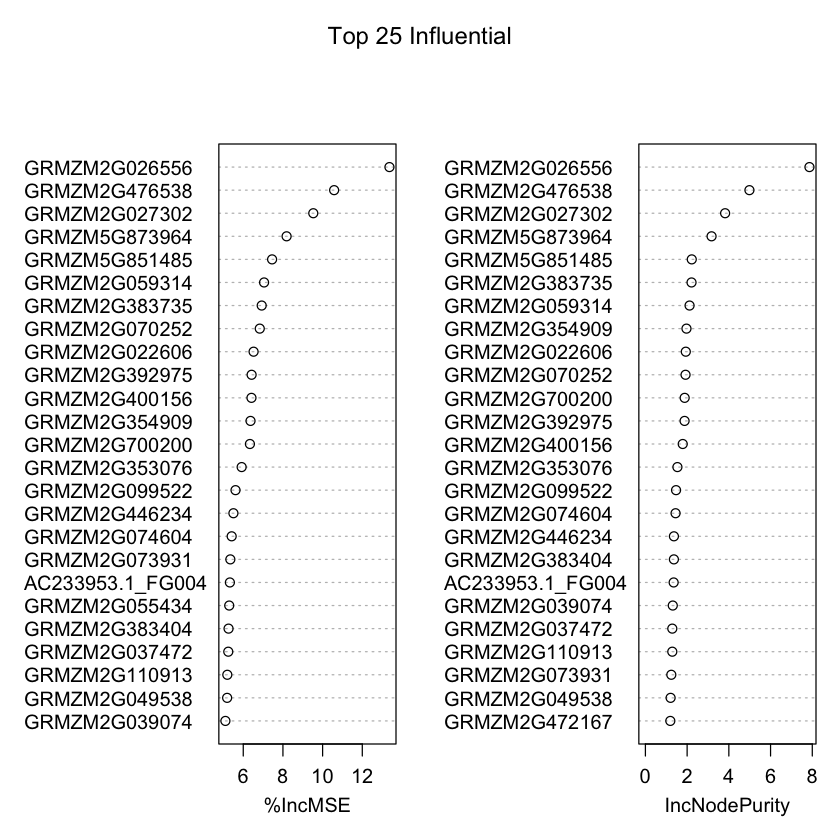

In [14]:
varImpPlot(rf, n.var=25, main="Top 25 Influential")

In [15]:
#extract influence metrics from random forest generation
influence <- importance(rf)

In [16]:
#order by error and output
head(influence[order(influence[,1], decreasing=T),])
influence.order <- influence[order(influence[,1], decreasing=T),]
write.table(influence.order, 
            file="./deseq/randomForest_vsd_3s.5c.txt", sep="\t", quote=F)

,%IncMSE,IncNodePurity
GRMZM2G026556,13.368324,7.863664
GRMZM2G476538,10.580468,4.986584
GRMZM2G027302,9.529605,3.821275
GRMZM5G873964,8.184891,3.171455
GRMZM5G851485,7.453566,2.222001
GRMZM2G059314,7.049578,2.117139


In [17]:
colnames(influence) <- c("IncMSE","IncNodePurity") 
head(influence)

,IncMSE,IncNodePurity
AC148152.3_FG005,-1.2746805,2.651149e-03
AC148152.3_FG008,2.3693767,1.164606e-02
AC148167.6_FG001,0.0000000,0.000000e+00
AC149475.2_FG002,0.0000000,0.000000e+00
AC149475.2_FG003,1.0000625,1.378687e-04
AC149475.2_FG005,0.6271568,5.170796e-05


Loading required package: ggplot2

Attaching package: ‘ggplot2’

The following object is masked from ‘package:randomForest’:

    margin

Warning message in log(IncMSE):
“NaNs produced”Warning message in log(IncMSE):
“NaNs produced”Warning message:
“Removed 11429 rows containing non-finite values (stat_bin).”

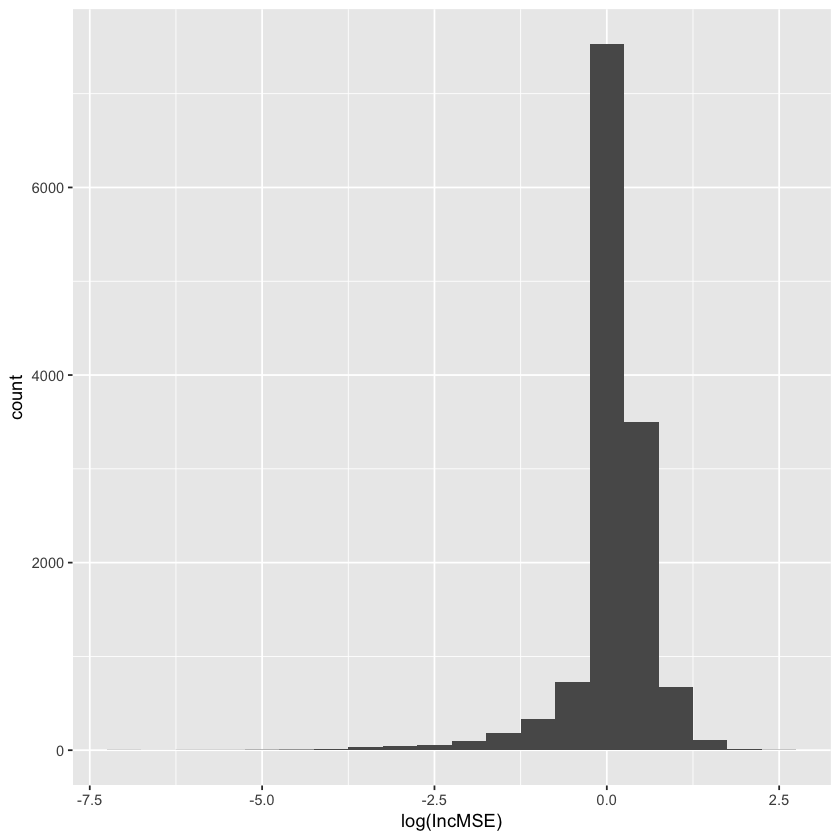

In [21]:
require(ggplot2)

inf.df <- data.frame(influence)
ggplot(inf.df, aes(x=log(IncMSE))) + geom_histogram(binwidth=0.5)

Warning message:
“Removed 2338 rows containing non-finite values (stat_bin).”

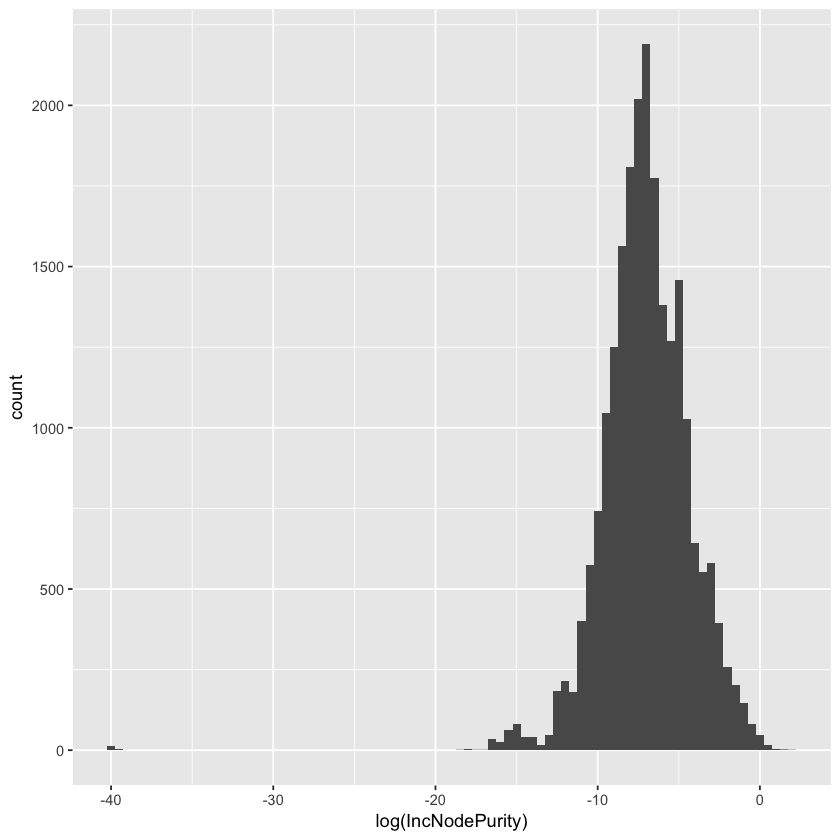

In [22]:
ggplot(inf.df, aes(x=log(IncNodePurity))) + geom_histogram(binwidth=0.5)

Warning message in log(IncMSE):
“NaNs produced”Warning message in log(IncMSE):
“NaNs produced”Warning message:
“Removed 6137 rows containing missing values (geom_point).”

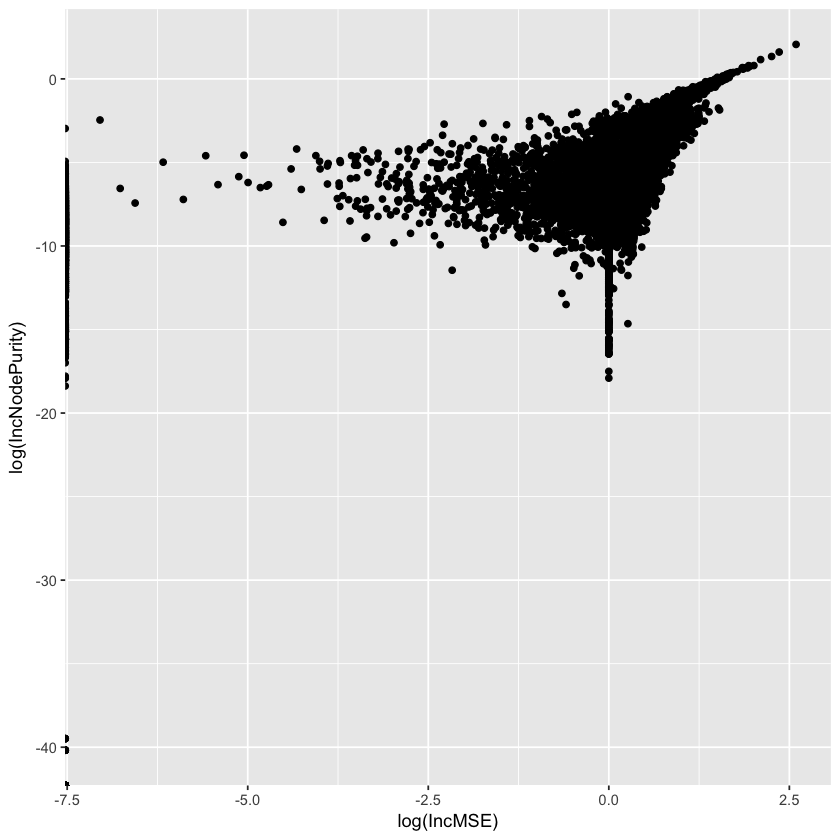

In [23]:
ggplot(inf.df, aes(x=log(IncMSE), y=log(IncNodePurity))) + geom_point()

[1] "Sat Feb  3 00:09:09 2018"


Warning message:
“closing unused connection 9 (<-localhost:11079)”Warning message:
“closing unused connection 8 (<-localhost:11079)”Warning message:
“closing unused connection 7 (<-localhost:11079)”Warning message:
“closing unused connection 6 (<-localhost:11079)”Warning message:
“closing unused connection 5 (<-localhost:11079)”Warning message:
“closing unused connection 4 (<-localhost:11079)”

In [1140]:
#try looking at the top 50 forest informers
forest.marker <- read.table(text=
"GRMZM2G026556	BOP2L
GRMZM2G476538	ILL6L
GRMZM2G027302	LSH6L
GRMZM5G873964	UNK
GRMZM2G383735	DUF1677
GRMZM5G851485	UNK_TF
GRMZM2G059314	NADPOx
GRMZM2G353076	zhd9
GRMZM2G070252	P_loop
GRMZM2G352132	Reticulon
GRMZM2G354909	NADPRoss
GRMZM2G134306	NTTL
GRMZM2G022606	BOP1L
GRMZM2G400156	SAUR33
GRMZM2G047759	UNK
GRMZM2G073931	UNK
GRMZM2G165987	PirinL
GRMZM2G446234	DUF593
GRMZM2G700200	UNK
GRMZM2G099522	zmm14
GRMZM2G170008	TRX-M4L
GRMZM2G074604	pal1
GRMZM2G055434	ENODL3L
GRMZM2G110913	lbd3
GRMZM2G456217	CysProteinL
GRMZM2G392975	pip1d
GRMZM2G087824	UNK
GRMZM2G049538	tps1
GRMZM2G472167	prc3
GRMZM2G016802	RPP13L
GRMZM2G180452	bhlh3
AC233953.1_FG004	KINL
GRMZM2G004909	SS2SL
GRMZM2G097683	srs4
GRMZM2G134708	MDAR1L
GRMZM2G416388	cbs1
GRMZM2G037472	P_loop
GRMZM2G043075	MATEL
GRMZM2G377615	ROPGEF12L
GRMZM2G080354	trpp10
GRMZM2G117707	DAHPsynth
GRMZM2G178533	NADPOx
GRMZM2G039074	glk23
GRMZM2G032095	KCS17L
GRMZM2G142721	LSH6L
AC209208.3_FG002	pip1b
GRMZM2G110567	zfdL
GRMZM2G074914	hydrolase
GRMZM2G176998	DPP6L
GRMZM2G073351	PORAL", sep="\t", header=F)

In [1146]:
for (marker in 1:nrow(forest.marker)) {
    plotGene( as.character(forest.marker[marker,1]) , as.character(forest.marker[marker,2]) )
    
}

In [1145]:
#what about the least informative?
forest.marker <- read.table(text=
"GRMZM5G869762	UNK
GRMZM2G079625	SCRL11L
GRMZM2G010604	UNK
GRMZM2G545891	UNK
GRMZM2G319138	PDR6L
GRMZM2G134023	BRH1L
GRMZM2G132968	ARP1L
GRMZM2G094581	UNK
GRMZM2G122607	atg18a
AC198781.3_FG002	ZPR3L
GRMZM2G410963	RLP2L
GRMZM5G853245	ZFDL
GRMZM2G126917	UNK
GRMZM2G158008	pld14
GRMZM2G025867	Ox
GRMZM2G111501	P17.1
GRMZM2G302405	UNK
GRMZM2G024561	UNK
GRMZM2G090971	UNK
GRMZM2G159953	UNK
GRMZM2G169114	KEA4L
GRMZM2G173989	PNAS3RL
GRMZM2G035405	arftf18
GRMZM2G074280	SRB7L
GRMZM5G886785	SPRYL
GRMZM2G018678	UNK
GRMZM5G875655	UNK
GRMZM2G022266	UDP-GTL
GRMZM2G078895	DNAJL
GRMZM2G146951	ENDO
GRMZM2G461948	UPL7L
GRMZM2G169704	UNK
GRMZM2G457415	UNK
GRMZM2G578411	UNK
AC214266.3_FG002	UDP-galT
GRMZM2G426154	mterf23
GRMZM2G363187	UNK
GRMZM2G323844	GLTP3L
GRMZM2G137971	UNK
GRMZM2G120115	UNK
AC155434.2_FG005	glk59
GRMZM2G028980	arftf16
GRMZM2G065692	RPM1L
GRMZM2G400444	UNK
GRMZM2G138566	Efhand
GRMZM2G003853	HYD1L
GRMZM2G126338	ECT2L
GRMZM2G311059	myb68
GRMZM2G127490	myb149
GRMZM2G150952	ORG1", sep="\t", header=F)


In [1147]:
summary(rf)

                Length Class  Mode     
call                 5 -none- call     
type                 1 -none- character
predicted           40 -none- numeric  
mse             100000 -none- numeric  
rsq             100000 -none- numeric  
oob.times           40 -none- numeric  
importance       49454 -none- numeric  
importanceSD     24727 -none- numeric  
localImportance      0 -none- NULL     
proximity            0 -none- NULL     
ntree                1 -none- numeric  
mtry                 1 -none- numeric  
forest              11 -none- list     
coefs                0 -none- NULL     
y                   40 -none- numeric  
test                 0 -none- NULL     
inbag                0 -none- NULL     

In [1176]:
#try to plot descision tree -- doesn't work. need classifiers?
require(reprtree)

tree <- getTree(rf, k=1, labelVar=TRUE)
tree
reprtree:::as.tree
realtree <- reprtree:::as.tree(tree, rf)
plot(realtree)


left daughter,right daughter,split var,split point,status,prediction
2,3,GRMZM2G017804,7.315275,-3,5.6030000
4,5,GRMZM5G800457,5.329744,-3,8.0025000
6,7,GRMZM2G021607,5.418439,-3,2.0037500
8,9,GRMZM2G101533,8.074267,-3,9.0858333
10,11,GRMZM2G017081,9.143831,-3,6.9191667
12,13,GRMZM2G019335,5.608190,-3,0.2822222
14,15,GRMZM2G073892,8.169393,-3,4.2171429
16,17,GRMZM2G082670,7.184421,-3,9.5785714
0,0,NA,0.000000,-1,8.3960000
18,19,GRMZM2G057475,7.966133,-3,7.4400000


function (gTree, rforest, max.depth = 3) 
{
    if (is.numeric(gTree[, "split var"])) 
        stop("labelVar=T required")
    bl <- matrix("", nrow = nrow(gTree), ncol = 3)
    for (row in 1:nrow(gTree)) {
        if (row == 1) {
            bl[row, 1:2] <- c("10", "11")
            next
        }
        if (gTree[row, 1] > 0) {
            bl[row, 1:2] <- paste0(bl[which(gTree[, 1:2] == row, 
                arr.ind = T)], c("0", "1"))
        }
        else {
            bl[row, 3] <- bl[which(gTree[, 1:2] == row, arr.ind = T)]
        }
    }
    bl <- data.frame(bl, stringsAsFactors = F)
    names(bl) <- c("left", "right", "terminal")
    fr <- list()
    fr$var <- as.character(gTree[, "split var"])
    fr$var[is.na(fr$var)] <- "<leaf>"
    fr$n <- fr$dev <- rep(0, length(fr$var))
    fr$yval <- gTree[, "prediction"]
    classes <- attributes(rforest$terms)$dataClasses
    blah <- data.frame(var = fr$var, splits = as.character(gTree[, 
        "split point"]), classes = classes[fr$var], stringsAsFactors = F)
    index <- which(blah$classes == "factor" & !is.na(blah$classes))
    blah$splits[index] <- sapply(blah$splits[index], factor.repr)
    splits <- cbind(cutleft = paste0(ifelse(blah$classes == "factor" & 
        !is.na(blah$classes), ": ", "<"), blah$splits), cutright = paste0(ifelse(blah$classes == 
        "factor" & !is.na(blah$classes), ": ", ">"), blah$splits))
    splits[fr$var == "<leaf>", ] <- ""
    fr <- as.data.frame(fr, stringsAsFactors = F)
    fr$splits <- splits
    x <- ifelse(fr$var == "<leaf>", bl[, 3], gsub(".{1}$", "", 
        bl[, 1]))
    if (rforest$type == "classification") {
        fr$yprob = matrix(1/length(rforest$classes), nrow = nrow(fr), 
            ncol = length(rforest$classes))
    }
    row.names(fr) <- strtoi(x, 2)
    fr <- fr[order(x), ]
    newtr <- list()
    newtr$frame = fr
    attr(newtr, "xlevels") <- rforest$forest$xlevels
    if (rforest$type == "classification") 
        attr(newtr, "ylevels") <- rforest$classes
    class(newtr) <- "tree"
    return(newtr)
}
<environment: namespace:reprtree>

ERROR: Error in data.frame(var = fr$var, splits = as.character(gTree[, "split point"]), : arguments imply differing number of rows: 23, 0


In [1188]:
fr <- list()
fr$var <- as.character(tree[,"split var"])
fr$var[is.na(fr$var)] <- "<leaf>"
fr$var
length(fr$var)
as.character(tree[,"split point"])
classes <- attributes(rf$terms)$dataClasses
attributes(rf)
attributes(fr$var)
data.frame(var=fr$var, splits=as.character(tree[,"split point"]), 
                classes=classes[fr$var], stringsAsFactors=F)
#reprtree wants rf$terms -- none is produced
#maybe the $terms variable is a feature of classification trees?

[1] "GRMZM2G017804" "GRMZM5G800457" "GRMZM2G021607" "GRMZM2G101533"
 [5] "GRMZM2G017081" "GRMZM2G019335" "GRMZM2G073892" "GRMZM2G082670"
 [9] "<leaf>"        "GRMZM2G057475" "GRMZM2G071450" "<leaf>"       
[13] "<leaf>"        "<leaf>"        "GRMZM2G315730" "<leaf>"       
[17] "<leaf>"        "<leaf>"        "<leaf>"        "<leaf>"       
[21] "<leaf>"        "<leaf>"        "<leaf>"

[1] 23

[1] "7.31527536883952" "5.32974359397651" "5.41843895941942" "8.07426736532578"
 [5] "9.14383051186342" "5.60818960259988" "8.16939311166566" "7.18442062630658"
 [9] "0"                "7.96613283962189" "6.28173745818188" "0"               
[13] "0"                "0"                "7.22142290637123" "0"               
[17] "0"                "0"                "0"                "0"               
[21] "0"                "0"                "0"

$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"          

$class
[1] "randomForest"

NULL

ERROR: Error in data.frame(var = fr$var, splits = as.character(tree[, "split point"]), : arguments imply differing number of rows: 23, 0


ntree      OOB      1      2      3
  100:   6.00%  0.00%  6.00% 12.00%
  200:   5.33%  0.00%  6.00% 10.00%
  300:   5.33%  0.00%  6.00% 10.00%
  400:   5.33%  0.00%  6.00% 10.00%
  500:   5.33%  0.00%  6.00% 10.00%


Species ~ Sepal.Length + Sepal.Width + Petal.Length + Petal.Width
attr(,"variables")
list(Species, Sepal.Length, Sepal.Width, Petal.Length, Petal.Width)
attr(,"factors")
             Sepal.Length Sepal.Width Petal.Length Petal.Width
Species                 0           0            0           0
Sepal.Length            1           0            0           0
Sepal.Width             0           1            0           0
Petal.Length            0           0            1           0
Petal.Width             0           0            0           1
attr(,"term.labels")
[1] "Sepal.Length" "Sepal.Width"  "Petal.Length" "Petal.Width" 
attr(,"order")
[1] 1 1 1 1
attr(,"intercept")
[1] 0
attr(,"response")
[1] 1
attr(,".Environment")
<environment: R_GlobalEnv>
attr(,"predvars")
list(Species, Sepal.Length, Sepal.Width, Petal.Length, Petal.Width)
attr(,"dataClasses")
     Species Sepal.Length  Sepal.Width Petal.Length  Petal.Width 
    "factor"    "numeric"    "numeric"    "numeric"    "numeric" 


Call:
 randomForest(formula = Species ~ ., data = iris, importance = TRUE,      ntree = 500, mtry = 2, do.trace = 100) 
               Type of random forest: classification
                     Number of trees: 500
No. of variables tried at each split: 2

        OOB estimate of  error rate: 5.33%
Confusion matrix:
           setosa versicolor virginica class.error
setosa         50          0         0        0.00
versicolor      0         47         3        0.06
virginica       0          5        45        0.10

NULL


Call:
 randomForest(x = t(vsdWF), y = coldata$ETU, ntree = 1e+05, importance = T) 
               Type of random forest: regression
                     Number of trees: 1e+05
No. of variables tried at each split: 8242

          Mean of squared residuals: 0.4721698
                    % Var explained: 95.43

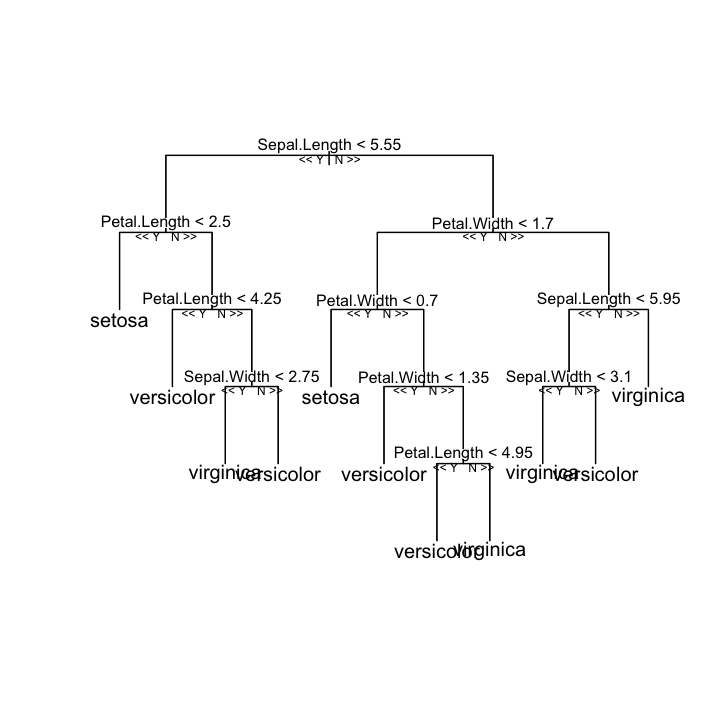

In [1193]:
library(randomForest)
library(reprtree)

model <- randomForest(Species ~ ., data=iris, importance=TRUE, ntree=500, mtry = 2, do.trace=100)

reprtree:::plot.getTree(model)
model$terms
model
rf$terms
rf

#plotting function works great on classification trees (iris dataset)
#must be because of regression dataset?

In [24]:
## try random forest to classify into stages
require(randomForest)

#try forest on all genes, with ETU as a continuous response group
set.seed(1234)
print(date())
rf.k5.1 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=1000)
rf.k5.2 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=2000)
rf.k5.3 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=3000)
rf.k5.4 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=4000)
rf.k5.5 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=5000)
rf.k5.6 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=6000)
rf.k5.7 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=7000)
rf.k5.8 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=8000)
rf.k5.9 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=9000)
rf.k5.10 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=10000)
print(date())

[1] "Thu Feb 15 12:42:02 2018"
[1] "Thu Feb 15 13:01:09 2018"


In [25]:
print(rf.k5.1);print(rf.k5.2);print(rf.k5.3);print(rf.k5.4);print(rf.k5.5)
print(rf.k5.6);print(rf.k5.7);print(rf.k5.8);print(rf.k5.9);print(rf.k5.10)


Call:
 randomForest(x = t(vsdWF), y = coldata$K5_stage, ntree = 1000) 
               Type of random forest: classification
                     Number of trees: 1000
No. of variables tried at each split: 157

        OOB estimate of  error rate: 10%
Confusion matrix:
  1 2 3  4 5 class.error
1 9 0 0  0 0   0.0000000
2 2 0 1  0 0   1.0000000
3 0 0 8  1 0   0.1111111
4 0 0 0 10 0   0.0000000
5 0 0 0  0 9   0.0000000

Call:
 randomForest(x = t(vsdWF), y = coldata$K5_stage, ntree = 2000) 
               Type of random forest: classification
                     Number of trees: 2000
No. of variables tried at each split: 157

        OOB estimate of  error rate: 7.5%
Confusion matrix:
  1 2 3  4 5 class.error
1 9 0 0  0 0           0
2 2 0 1  0 0           1
3 0 0 9  0 0           0
4 0 0 0 10 0           0
5 0 0 0  0 9           0

Call:
 randomForest(x = t(vsdWF), y = coldata$K5_stage, ntree = 3000) 
               Type of random forest: classification
                     Number of tre

mtry = 106  OOB error = 7.5% 
Searching left ...
mtry = 105 	OOB error = 10% 
-0.3333333 0.001 
Searching right ...
mtry = 107 	OOB error = 7.5% 
0 0.001 
        mtry OOBError
105.OOB  105    0.100
106.OOB  106    0.075
107.OOB  107    0.075
106.OOB 107.OOB 
    106     107 


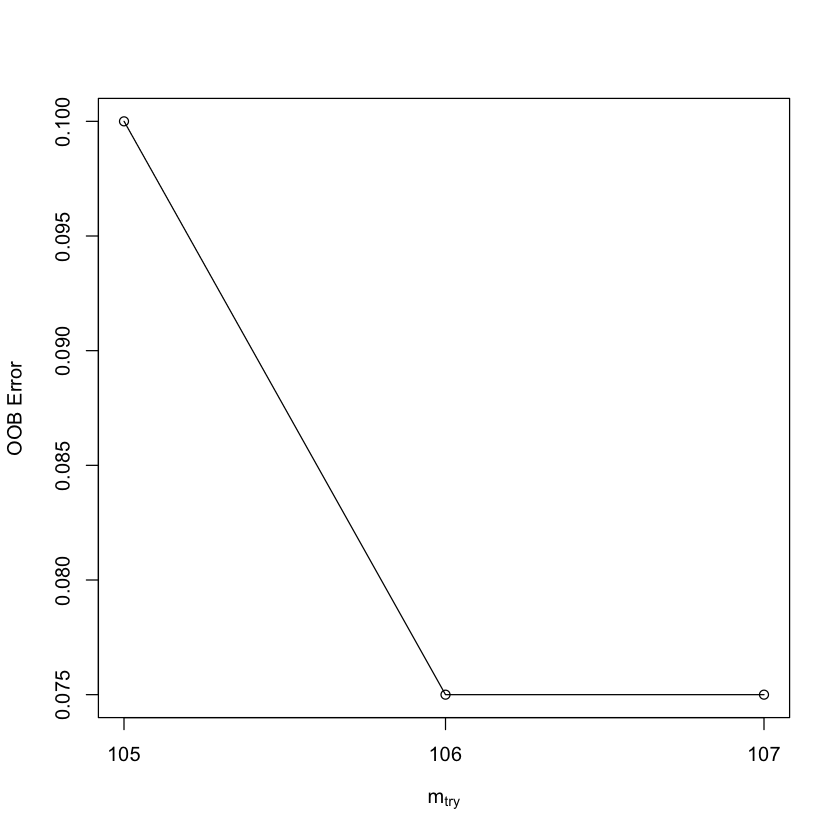

In [37]:
require(randomForest)
mtry <- tuneRF(x=t(vsdWF), y=coldata$K5_stage, ntreeTry=2000, mtryStart=106,
               stepFactor=1.01,improve=0.001, trace=TRUE, plot=TRUE)
best.m <- mtry[mtry[, 2] == min(mtry[, 2]), 1]
print(mtry)
print(best.m)

In [38]:
require(randomForest)

#try forest on all genes, with K4 class as factors
set.seed(1234)
print(date())
rf.k5 <- randomForest(x=t(vsdWF), y=coldata$K5_stage, ntree=2000, mtry=106, importance=T)
print(date())

[1] "Thu Feb 15 14:43:53 2018"
[1] "Thu Feb 15 14:44:34 2018"


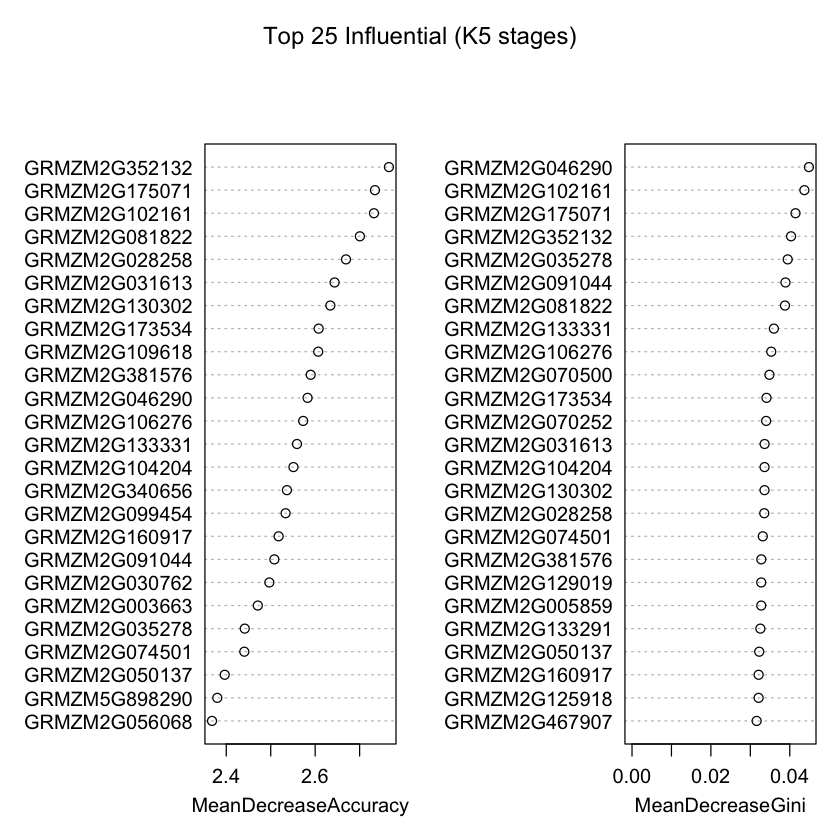

In [39]:
varImpPlot(rf.k5, n.var=25, main="Top 25 Influential (K5 stages)")

In [40]:
#extract influence metrics from random forest generation
influence <- importance(rf.k5)
#order by error and output
head(influence[order(influence[,6], decreasing=T),])
influence.order <- influence[order(influence[,6], decreasing=T),]
write.table(influence.order, 
            file="./deseq/randomForest_k5_vsd_3s.5c.txt", sep="\t", quote=F)

,1,2,3,4,5,MeanDecreaseAccuracy,MeanDecreaseGini
GRMZM2G352132,1.300417,1.414921,1.709749,1.840592,2.370899,2.765923,0.04032755
GRMZM2G175071,1.716248,0.000000,2.310216,2.093654,2.422003,2.734506,0.04145761
GRMZM2G102161,2.201033,1.667825,1.665633,2.225414,1.230921,2.732311,0.04371272
GRMZM2G081822,2.703515,0.000000,1.000250,1.406259,1.977589,2.700581,0.03878875
GRMZM2G028258,2.166195,0.000000,2.388620,0.000000,1.265417,2.669340,0.03353822
GRMZM2G031613,0.000000,0.000000,2.742265,1.988762,1.000250,2.643712,0.03362515


In [41]:
summary(rf.k5)
rf.k5

                Length Class  Mode     
call                 6 -none- call     
type                 1 -none- character
predicted           40 factor numeric  
err.rate         12000 -none- numeric  
confusion           30 -none- numeric  
votes              200 matrix numeric  
oob.times           40 -none- numeric  
classes              5 -none- character
importance      173089 -none- numeric  
importanceSD    148362 -none- numeric  
localImportance      0 -none- NULL     
proximity            0 -none- NULL     
ntree                1 -none- numeric  
mtry                 1 -none- numeric  
forest              14 -none- list     
y                   40 factor numeric  
test                 0 -none- NULL     
inbag                0 -none- NULL     


Call:
 randomForest(x = t(vsdWF), y = coldata$K5_stage, ntree = 2000,      mtry = 106, importance = T) 
               Type of random forest: classification
                     Number of trees: 2000
No. of variables tried at each split: 106

        OOB estimate of  error rate: 7.5%
Confusion matrix:
  1 2 3  4 5 class.error
1 9 0 0  0 0           0
2 2 0 1  0 0           1
3 0 0 9  0 0           0
4 0 0 0 10 0           0
5 0 0 0  0 9           0

In [42]:
length(rownames(head(influence.order,5000)))

[1] 5000

In [43]:
#Try different subsets of total stage mean scaled values by forest walk importance
#top 5000 genes for classifying k=5 stages
res <- stage_mean[rownames(head(influence.order,2500)),]
cpm <- data.matrix(res)

In [45]:
require(kohonen)
require(reshape)
require(colorRamps)
require(ggplot2)

# use the kohonen package to create a 'grid' of nodes
# empirically test the largest grid you can produce without any empty nodes

som_grid <- somgrid(xdim=10, ydim=10, topo="hexagonal")

# run the clustering algorithm, rlen = number of iterations, alpha = decaying learning rate

som_model <- som(cpm, grid=som_grid, rlen=50000, alpha=c(0.15,0.01), keep.data = TRUE)

Loading required package: kohonen
Loading required package: reshape
Loading required package: colorRamps


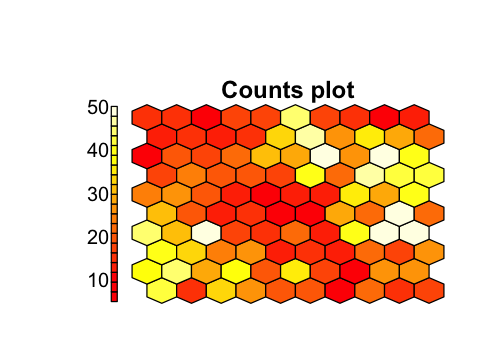

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.00   16.00   21.00   25.00   33.25   50.00 

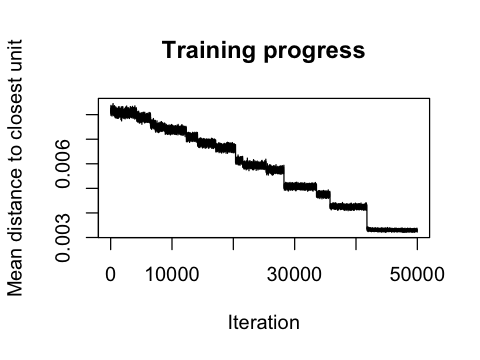

In [46]:
# might be fun to check some of the kohonen object diagnostic plots
# try one type at a type
options(repr.plot.width=4, repr.plot.height=3)
som_counts <- plot(som_model, type = "counts", shape = "straight")
plot(som_model, type = "changes")

summary(som_counts)

In [53]:
require(kohonen)
require(reshape)
require(colorRamps)
require(ggplot2)
# extract and plot the data, but first write to file

som_result <- cbind(cpm, as.factor(som_model$unit.classif))
colnames(som_result)[ncol(som_result)] <- "Node"  # change last column name to Node
write.table(som_result, file="SOM_randomF2500_10x10_FEB01.txt", sep="\t", quote=F)

# as a heatmap (dendrogram optional: dendrogram = c("both","row","column","none"))

#som_sorted <- som_result[order(som_result[,ncol(som_result)]),]
#som_colors <- primary.colors(length(levels(as.factor(som_model$unit.classif))))[som_result[,ncol(som_result)]]
#heatmap.2(t(som_result[,ncol(som_result)]), Rowv=F, Colv=F, scale="column", ColSideColors=som_colors, trace="none", col="topo.colors")

# as line graphs (this one was hard to code)


node_values <- som_model$codes[[1]] #the 'codes' data.frame created by the kohonen package contains all the node values
rownames(node_values) <- c(1:nrow(som_model$codes[[1]]))  #very ugly way to make clean rownames
#colnames(node_values) <- temp$ETU #change names to ETU values
node <- melt(node_values, varnames=c("Node", "Stage"))  #separate node names and values to a long, value-by-value format
colnames(node)[3] <- "CPM" # add back label for CPM values

#colnames(cpm) <- temp$ETU #change names to ETU values
somplot <- melt(as.matrix(cpm), varnames=c("GeneID", "Stage"))
somplot <- cbind(somplot, som_result[,ncol(som_result)][as.character(somplot[,1])]) #look up Node in som_result by GeneID in somplot
colnames(somplot)[3:4] <- c("CPM", "Node")

pdf(file="som_linegraph.pdf", wi=9, he=6)
# try one type at a type
options(repr.plot.width=12, repr.plot.height=12)
ggplot(data = somplot, aes(x=Stage, y=CPM, group=GeneID, color=as.factor(Node))) + 
	geom_line(color="grey40", alpha=0.6) + 
	geom_line(data = node, aes(x=Stage, y=CPM, group=Node), color = "purple4") + 
	theme_bw() + 
    theme(panel.spacing= unit(1, "points")) +
	facet_wrap(~Node, scales="free") + 
	ylab("Relative Expression")
dev.off()


Loading required package: kohonen
Loading required package: reshape

Attaching package: ‘reshape’

The following objects are masked from ‘package:S4Vectors’:

    expand, rename

Loading required package: colorRamps


pdf 
  2

In [1239]:
#Could these be markers?
forest.marker <- read.table(text=
"GRMZM2G136750	GRMZM2G136750
GRMZM2G001223	myb126
GRMZM2G178753	LLRKL
GRMZM2G035243	KELCH
GRMZM2G020148	TLCL
AC197377.3_FG001	AC197377.3_FG001
GRMZM2G122337	fdx1
GRMZM2G138268	iaa10
GRMZM2G141707	TRXzL
GRMZM2G126260	pin10
GRMZM2G131409	SVBL
GRMZM2G111666	GRMZM2G111666
GRMZM2G110295	gata23
GRMZM2G151087	PEPL
GRMZM2G147266	fer2
GRMZM2G027068	bhlh48
GRMZM2G096486	VAMP726L
GRMZM2G131969	BRO1L
GRMZM2G061126	GRMZM2G061126
GRMZM2G412161	GRMZM2G412161
GRMZM2G474555	GRMZM2G474555
AC202864.3_FG002	gata25
GRMZM2G142097	GRMZM2G142097
GRMZM5G808847	AXR1
GRMZM2G175076	GRMZM2G175076
GRMZM2G141277	GRMZM2G141277
GRMZM2G021687	psa2
GRMZM5G805387	zmm18
GRMZM2G018375	thi1
GRMZM2G098063	abi4
GRMZM2G001241	LTL1L
GRMZM2G173536	GRMZM2G173536
GRMZM2G037452	GRMZM2G037452
GRMZM2G169005	GRMZM2G169005
GRMZM2G113340	GRMZM2G113340
GRMZM2G117531	GRMZM2G117531
GRMZM2G066612	TH9
GRMZM2G142664	GRMZM2G142664
GRMZM2G160838	myb32
GRMZM2G004012	umc1431
GRMZM2G123204	ADSSL
GRMZM2G036217	msh1
GRMZM2G337113	gpa1
GRMZM2G377663	GRMZM2G377663
GRMZM2G121360	GRMZM2G121360
GRMZM2G329144	GPX4L
GRMZM2G093731	GRMZM2G093731
GRMZM2G084806	MRH1L
GRMZM2G458974	GRMZM2G458974
GRMZM5G873519	GRMZM5G873519
GRMZM2G140915	CYP75B1
GRMZM2G119769	GRMZM2G119769
GRMZM2G162305	GRMZM2G162305
GRMZM2G036120	ENTHL
GRMZM2G100349	L18aeL
GRMZM2G316275	SAURL", sep="\t", header=F)


In [1240]:
for (marker in 1:nrow(forest.marker)) {
    plotGene( as.character(forest.marker[marker,1]) , as.character(forest.marker[marker,2]) )
}

In [1270]:
#create Stage K=5 model matrix and test add to DESeq object
coldata$K5_stage
stage1 <- unlist(lapply(coldata$K5_stage, function(x) ifelse(x!=1,'not',x)))
stage2 <- unlist(lapply(coldata$K5_stage, function(x) ifelse(x!=2,'not',x)))
stage3 <- unlist(lapply(coldata$K5_stage, function(x) ifelse(x!=3,'not',x)))
stage4 <- unlist(lapply(coldata$K5_stage, function(x) ifelse(x!=4,'not',x)))
stage5 <- unlist(lapply(coldata$K5_stage, function(x) ifelse(x!=5,'not',x)))
stage_libs <- cbind(rownames(coldata),stage1,stage2,stage3,stage4,stage5)
head(stage_libs)

[1] 5 5 5 3 4 4 4 5 5 5 5 4 4 5 5 4 3 4 4 3 4 3 2 3 3 4 3 3 3 2 1 2 1 1 1 1 1 1
[39] 1 1
Levels: 1 2 3 4 5

,stage1,stage2,stage3,stage4,stage5
SHSL002_01_S1.count.txt,not,not,not,not,5
SHSL002_02_S2.count.txt,not,not,not,not,5
SHSL002_03_S3.count.txt,not,not,not,not,5
SHSL002_04_S4.count.txt,not,not,3,not,not
SHSL002_05_S5.count.txt,not,not,not,4,not
SHSL002_06_S6.count.txt,not,not,not,4,not


In [1284]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage1,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 127 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage11"   "stage1not"

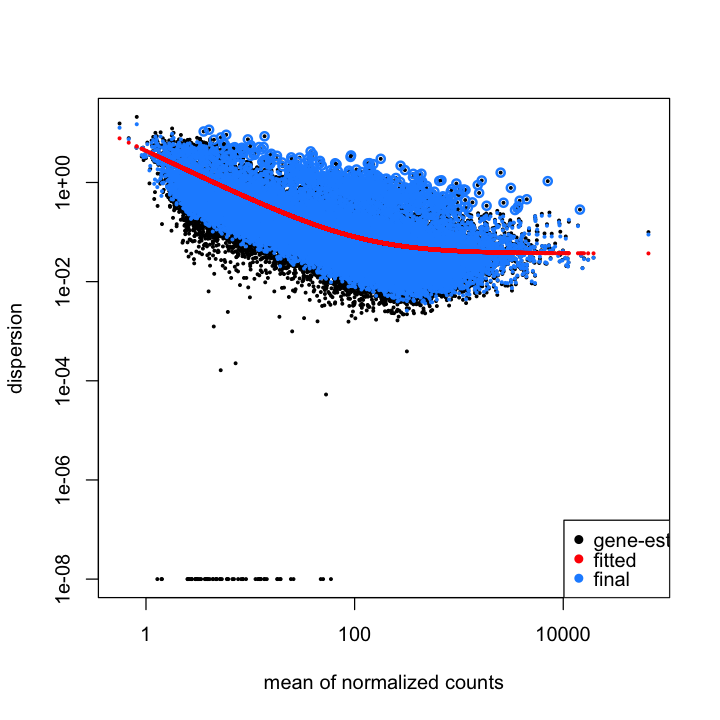

In [1285]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res1 <- results(ddsWF, contrast=c("stage1","1","not"), alpha=0.05)


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 4220, 17% 
LFC < 0 (down)   : 5724, 23% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



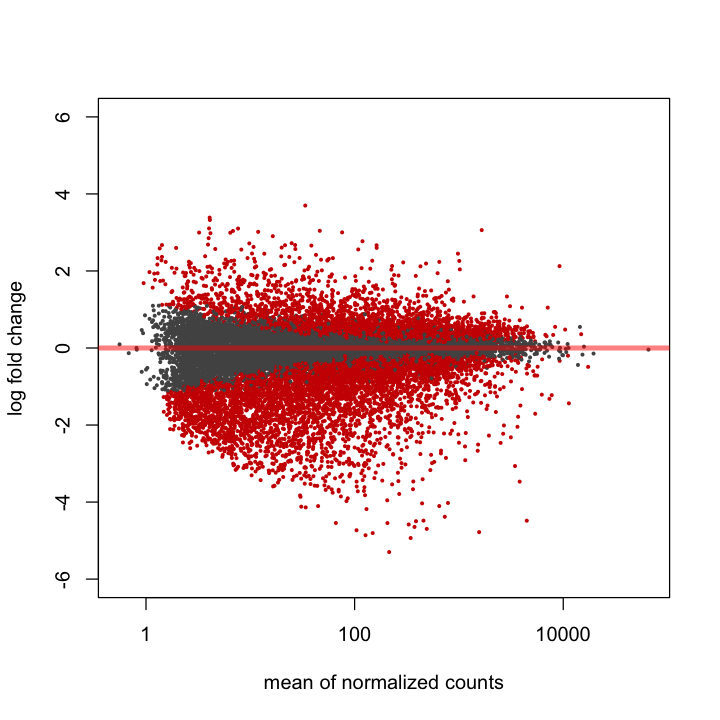

In [1286]:
summary(res1);
plotMA(res1,ylim=c(-6,6));

In [1302]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage2,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 239 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage22"   "stage2not"

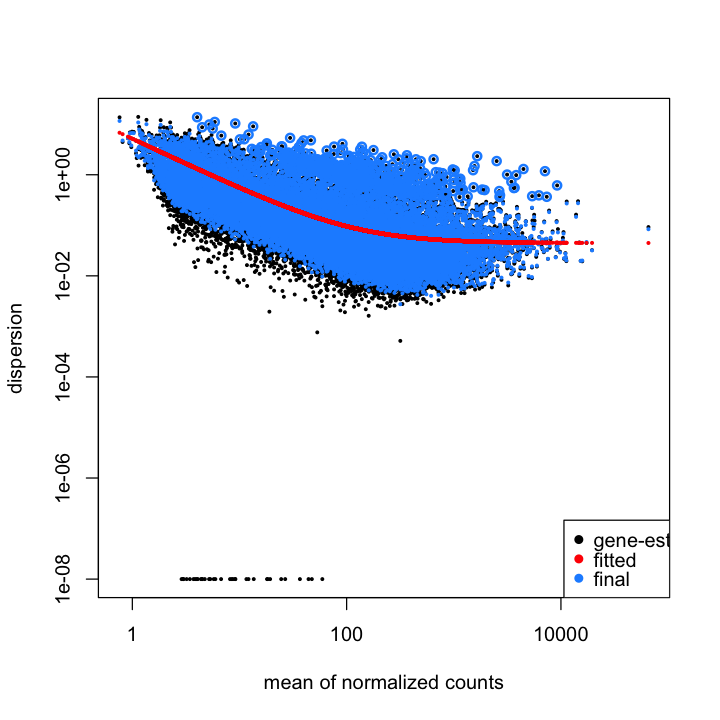

In [1303]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res2 <- results(ddsWF, contrast=c("stage2","2","not"), alpha=0.05)


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 1637, 6.6% 
LFC < 0 (down)   : 1031, 4.2% 
outliers [1]     : 137, 0.55% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



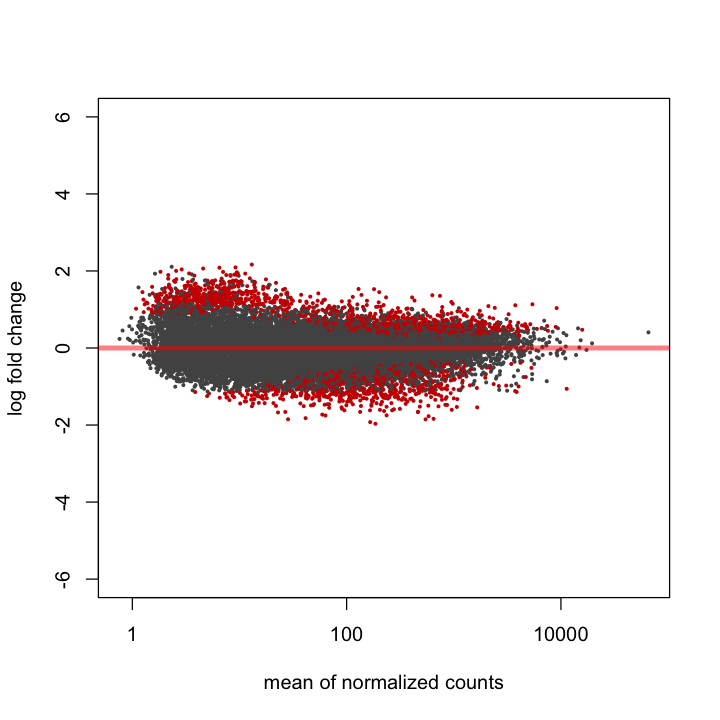

In [1304]:
summary(res2);
plotMA(res2,ylim=c(-6,6));

In [1291]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage3,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 87 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage33"   "stage3not"

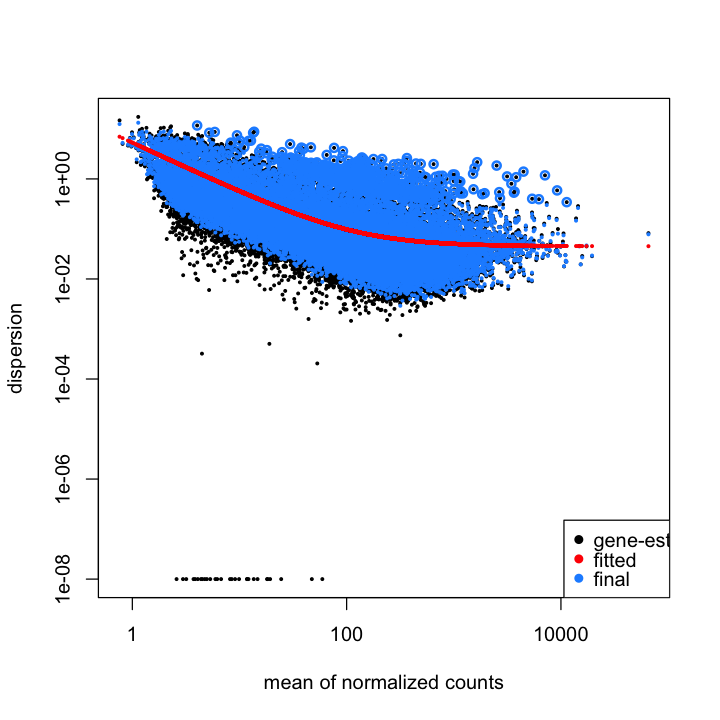

In [1292]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res3 <- results(ddsWF, contrast=c("stage3","3","not"), alpha=0.05)


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 664, 2.7% 
LFC < 0 (down)   : 1118, 4.5% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



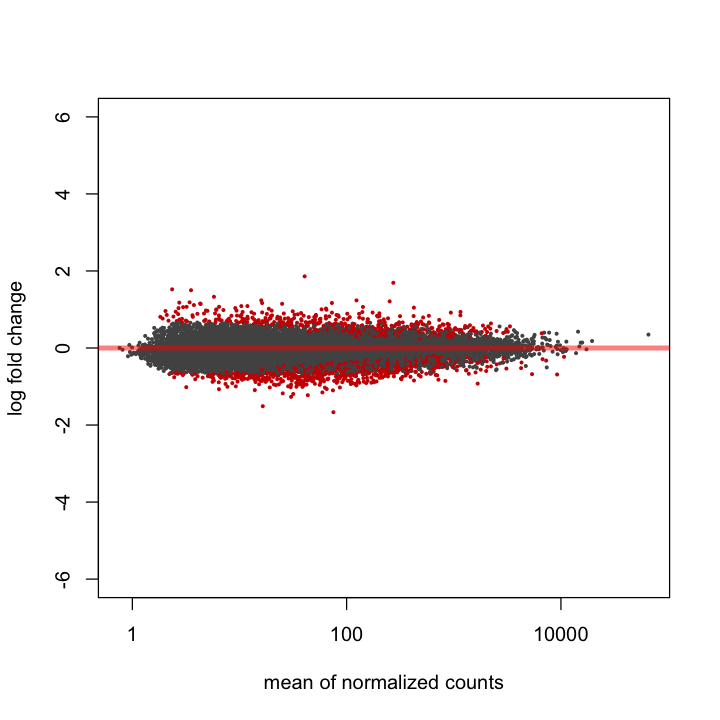

In [1293]:
summary(res3);
plotMA(res3,ylim=c(-6,6));

In [1294]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage4,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 68 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage44"   "stage4not"

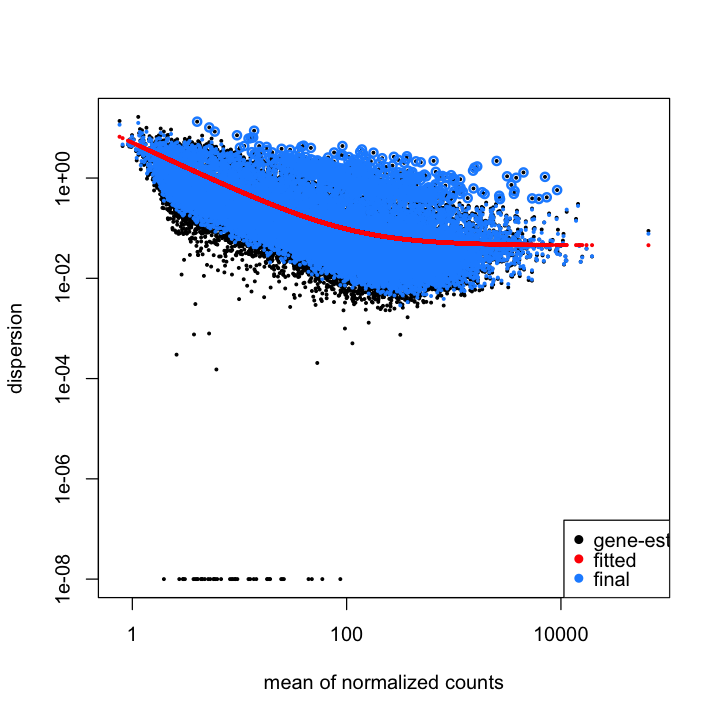

In [1297]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res4 <- results(ddsWF, contrast=c("stage4","4","not"), alpha=0.05)


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 553, 2.2% 
LFC < 0 (down)   : 1405, 5.7% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



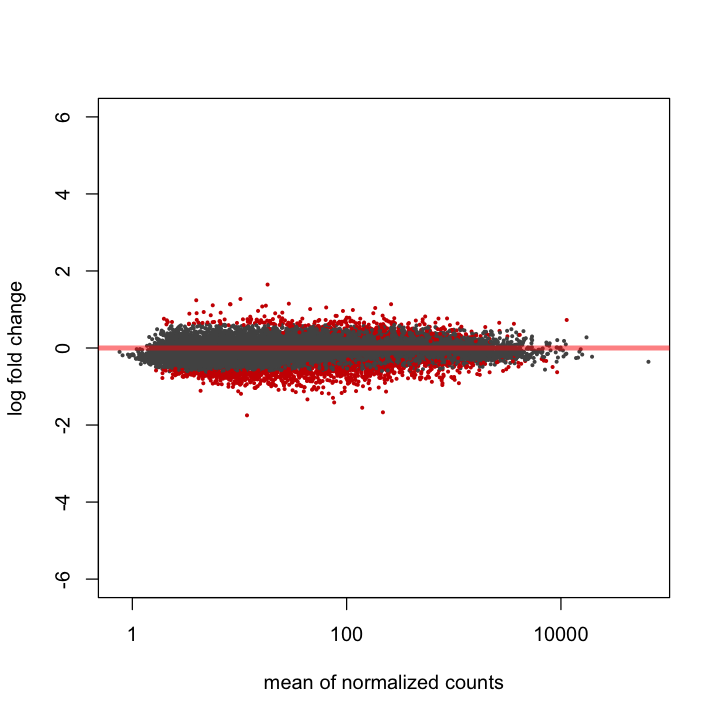

In [1298]:
summary(res4);
plotMA(res4,ylim=c(-6,6));

In [1299]:
#object count created at the top of this notebook
ddsWF <- DESeqDataSetFromMatrix(countData = count,
                                colData = stage_libs,
                                design = ~ stage5,
                                tidy = F)
ddsWF <- estimateSizeFactors(ddsWF)
ddsWF <- ddsWF[ rowSums(counts(ddsWF, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
#ddsWF <- estimateDispersions(ddsWF)
ddsWF <- DESeq(ddsWF)

using pre-existing size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 43 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


[1] "Intercept" "stage55"   "stage5not"

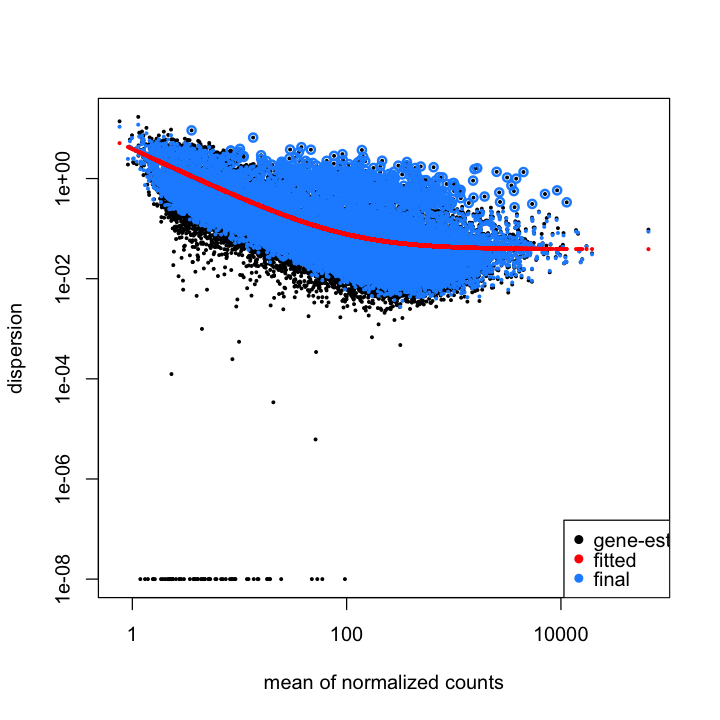

In [1300]:
#How about stage-unique / DE genes?
#Compare 1 stage to all others

options(repr.plot.width=6, repr.plot.height=6)
plotDispEsts(ddsWF)
resultsNames(ddsWF)
res5 <- results(ddsWF, contrast=c("stage5","5","not"), alpha=0.05)


out of 24727 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 6136, 25% 
LFC < 0 (down)   : 5986, 24% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



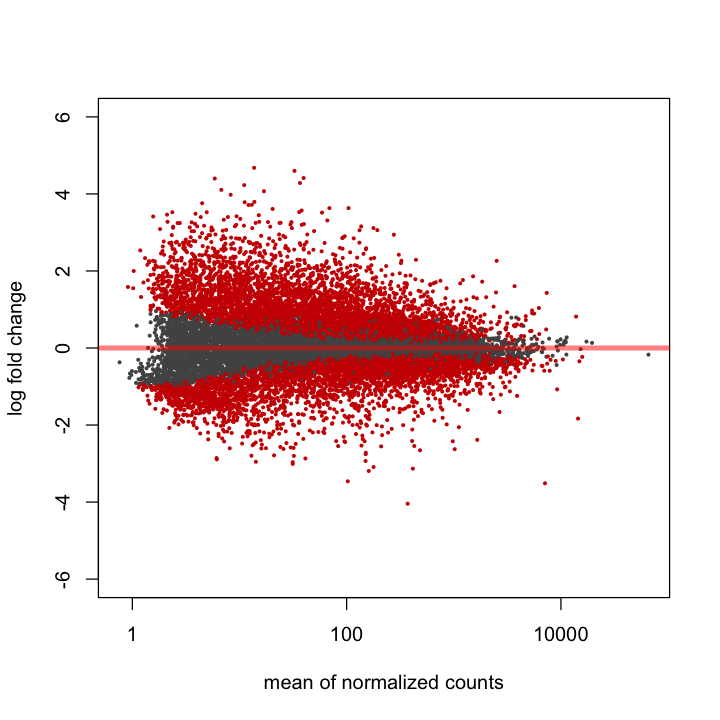

In [1301]:
summary(res5);
plotMA(res5,ylim=c(-6,6));

In [1305]:
stage_DE.res <- cbind(res1,res2,res3,res4,res5)
#export as TSV
write.table(as.data.frame(stage_DE.res), 
            file="./deseq/stageDE_3s.5c.txt",
            sep="\t", quote=F)

Ok well that's *confusing*
maybe I'll try to predict Eveland et al. tassel ages using the RFs from above

In [115]:
#create a VSD dataset to match DESeq filtering criteria
dds.vsd <- DESeqDataSetFromMatrix(countData = count,
                                colData = coldata,
                                design = ~ ETU,
                                tidy = F)
dds.vsd <- estimateSizeFactors(dds.vsd)
#dds.vsd <- dds.vsd[ rowSums(counts(dds.vsd, normalized=TRUE) >= 20) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.vsd <- estimateDispersions(dds.vsd)
vsd <- varianceStabilizingTransformation(dds.vsd)
vsdRF <- assay(vsd)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [116]:
print(date())
rf.relax <- randomForest(x=t(vsdRF), y=coldata$ETU, ntree=8000, mtry=3604, importance=TRUE)
print(date())

[1] "Fri Feb 16 10:14:43 2018"
[1] "Fri Feb 16 10:17:46 2018"


In [123]:
#create a VSD dataset to match DESeq filtering criteria
dds.vsd <- DESeqDataSetFromMatrix(countData = count,
                                colData = coldata,
                                design = ~ K5_stage,
                                tidy = F)
dds.vsd <- estimateSizeFactors(dds.vsd)
#dds.vsd <- dds.vsd[ rowSums(counts(dds.vsd, normalized=TRUE) >= 20) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.vsd <- estimateDispersions(dds.vsd)
vsd <- varianceStabilizingTransformation(dds.vsd)
vsdRF.k5 <- assay(vsd)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [124]:
print(date())
rf.relax.k5 <- randomForest(x=t(vsdRF), y=coldata$K5_stage, ntree=8000, mtry=3604, importance=TRUE)
print(date())

[1] "Fri Feb 16 10:21:55 2018"
[1] "Fri Feb 16 10:28:09 2018"


In [1311]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/RA_realign", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/RA_realign", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

ra.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(ra.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
ra.counts <- cbind(ra.counts, new_file) # add on the new column
colnames(ra.counts) <- c(file_names[1:f]) # add on the new column's name
}

ra.count <- head(ra.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [114]:
dim (ra.count); head (ra.count); head(count)

[1] 39469     6

,SRR999038.count.txt,SRR999039.count.txt,SRR999040.count.txt,SRR999041.count.txt,SRR999042.count.txt,SRR999043.count.txt
AC148152.3_FG001,0,0,0,0,0,0
AC148152.3_FG005,0,4,4,14,16,46
AC148152.3_FG006,0,0,0,0,0,0
AC148152.3_FG008,4,0,0,2,18,21
AC148167.6_FG001,1102,1264,1080,759,1544,2331
AC149475.2_FG002,1903,1636,1879,693,1320,1251


,SHSL002_01_S1.count.txt,SHSL002_02_S2.count.txt,SHSL002_03_S3.count.txt,SHSL002_04_S4.count.txt,SHSL002_05_S5.count.txt,SHSL002_06_S6.count.txt,SHSL002_07_S7.count.txt,SHSL002_08_S8.count.txt,SHSL002_09_S9.count.txt,SHSL002_10_S10.count.txt,⋯,SHSL002_31_S31.count.txt,SHSL002_32_S32.count.txt,SHSL002_33_S33.count.txt,SHSL002_34_S34.count.txt,SHSL002_35_S35.count.txt,SHSL002_36_S36.count.txt,SHSL002_37_S37.count.txt,SHSL002_38_S38.count.txt,SHSL002_39_S39.count.txt,SHSL002_40_S40.count.txt
AC148152.3_FG001,0,0,0,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AC148152.3_FG005,2,15,1,9,2,3,6,0,0,0,⋯,0,2,1,0,0,0,0,0,0,0
AC148152.3_FG006,0,0,0,0,0,0,0,0,0,0,⋯,2,0,2,0,0,0,0,0,0,0
AC148152.3_FG008,25,35,25,3,9,3,1,13,6,25,⋯,4,2,2,0,1,0,0,1,1,0
AC148167.6_FG001,578,653,752,567,583,622,563,517,385,545,⋯,326,212,649,651,572,613,365,614,391,442
AC149475.2_FG002,728,921,820,806,767,827,853,706,389,987,⋯,388,365,1110,931,636,652,389,845,525,634


In [117]:
require(DESeq2)
#create a VSD dataset to match DESeq filtering criteria
dds.ra <- DESeqDataSetFromMatrix(countData = ra.count,
                                colData = data.frame(colnames(ra.count)),
                                design = ~ 1,
                                tidy = F)
dds.ra <- estimateSizeFactors(dds.ra)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 1) , ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.ra <- estimateDispersions(dds.ra)
vsd.ra <- varianceStabilizingTransformation(dds.ra)
vsdRA <- assay(vsd.ra)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [118]:
rf.ra.ETU <- predict(rf.relax, t(vsdRA), type="response", 
                     predict.all=T, nodes=T)

In [119]:
summary(rf.ra.ETU)

           Length Class  Mode   
aggregate      6  -none- numeric
individual 48000  -none- numeric

SRR999038.count.txt SRR999039.count.txt SRR999040.count.txt SRR999041.count.txt 
           4.703978            5.291232            5.304961            6.451744 
SRR999042.count.txt SRR999043.count.txt 
           6.912211            7.086913

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   3.004   5.470   5.291   7.750   9.750 

[1] 5.47

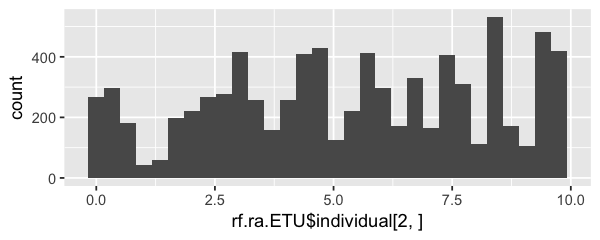

In [122]:
rf.ra.ETU$aggregate

options(repr.plot.width=5, repr.plot.height=2)
qplot(rf.ra.ETU$individual[2,])
summary(rf.ra.ETU$individual[2,])
median(rf.ra.ETU$individual[2,])

## OMG I THINK IT WORKS

In [125]:
rf.ra.K5 <- predict(rf.relax.k5, t(vsdRA),  type = "prob",
                   predict.all=T, nodes=T)

In [126]:
summary(rf.ra.K5)

           Length Class  Mode     
aggregate     30  matrix numeric  
individual 48000  -none- character

In [127]:
rf.ra.K5$aggregate

,1,2,3,4,5
SRR999038.count.txt,0.265875,0.091500,0.238625,0.200500,0.203500
SRR999039.count.txt,0.229250,0.073500,0.263750,0.207250,0.226250
SRR999040.count.txt,0.197625,0.074625,0.318625,0.192250,0.216875
SRR999041.count.txt,0.128000,0.048250,0.288250,0.271375,0.264125
SRR999042.count.txt,0.110750,0.044500,0.231500,0.329750,0.283500
SRR999043.count.txt,0.092625,0.036500,0.236750,0.341625,0.292500


In [1329]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/BD1_RNAseq/counts", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/BD1_RNAseq/counts", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

bd.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(bd.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
bd.counts <- cbind(bd.counts, new_file) # add on the new column
colnames(bd.counts) <- c(file_names[1:f]) # add on the new column's name
}

bd.count <- head(bd.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1333]:
#create a VSD dataset to match DESeq filtering criteria
dds.bd <- DESeqDataSetFromMatrix(countData = bd.count,
                                colData = data.frame(colnames(bd.count)),
                                design = ~ 1,
                                tidy = F)
dds.bd <- estimateSizeFactors(dds.bd)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.bd <- estimateDispersions(dds.bd)
vsd.bd <- varianceStabilizingTransformation(dds.bd)
vsdBD <- assay(vsd.bd)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [54]:
rf.bd.ETU <- predict(rf, t(vsdBD), type="response",
                     predict.all=T, nodes=T)

In [55]:
summary(rf.bd.ETU)
rf.bd.ETU$aggregate

           Length Class  Mode   
aggregate      6  -none- numeric
individual 48000  -none- numeric

bd_mutant_replicate1.raw_count.txt bd_mutant_replicate2.raw_count.txt 
                          5.415303                           4.833669 
bd_mutant_replicate3.raw_count.txt        WT_replicate1.raw_count.txt 
                          5.487654                           4.107333 
       WT_replicate2.raw_count.txt        WT_replicate3.raw_count.txt 
                          3.860634                           4.043752

In [128]:
rf.bd.K5 <- predict(rf.relax.k5, t(vsdBD),  type = "prob",
                   predict.all=T, nodes=T)

In [129]:
summary(rf.bd.K5)
rf.bd.K5$aggregate

           Length Class  Mode     
aggregate     30  matrix numeric  
individual 48000  -none- character

,1,2,3,4,5
bd_mutant_replicate1.raw_count.txt,0.119000,0.115000,0.25775,0.234250,0.274000
bd_mutant_replicate2.raw_count.txt,0.134625,0.134000,0.26000,0.200625,0.270750
bd_mutant_replicate3.raw_count.txt,0.123000,0.116625,0.26275,0.215250,0.282375
WT_replicate1.raw_count.txt,0.164625,0.158500,0.27700,0.157000,0.242875
WT_replicate2.raw_count.txt,0.169500,0.157750,0.26700,0.180250,0.225500
WT_replicate3.raw_count.txt,0.165375,0.155125,0.28375,0.164375,0.231375


In [1340]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/WAB_rnaseq/htseq", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/WAB_rnaseq/htseq", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

WAB.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(WAB.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
WAB.counts <- cbind(WAB.counts, new_file) # add on the new column
colnames(WAB.counts) <- c(file_names[1:f]) # add on the new column's name
}

WAB.count <- head(WAB.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1341]:
#create a VSD dataset to match DESeq filtering criteria
dds.wab <- DESeqDataSetFromMatrix(countData = WAB.count,
                                colData = data.frame(colnames(WAB.count)),
                                design = ~ 1,
                                tidy = F)
dds.wab <- estimateSizeFactors(dds.wab)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.wab <- estimateDispersions(dds.wab)
vsd.wab <- varianceStabilizingTransformation(dds.wab)
vsdWAB <- assay(vsd.wab)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [58]:
rf.wab.ETU <- predict(rf, t(vsdWAB), type="response",
                     predict.all=T, nodes=T)

In [59]:
summary(rf.wab.ETU)
rf.wab.ETU$aggregate

           Length Class  Mode   
aggregate      15 -none- numeric
individual 120000 -none- numeric

A.count.txt B.count.txt C.count.txt D.count.txt E.count.txt F.count.txt 
   3.721256    3.723813    4.260395    3.864841    3.791078    4.100276 
G.count.txt H.count.txt I.count.txt J.count.txt K.count.txt L.count.txt 
   4.870765    4.575946    5.247747    5.046874    5.473390    4.643304 
M.count.txt N.count.txt O.count.txt 
   4.565436    4.644856    4.641339

In [130]:
rf.wab.K5 <- predict(rf.relax.k5, t(vsdWAB),  type = "prob",
                     predict.all=T, nodes=T)

summary(rf.wab.K5)
rf.wab.K5$aggregate

           Length Class  Mode     
aggregate      75 matrix numeric  
individual 120000 -none- character

,1,2,3,4,5
A.count.txt,0.191250,0.174125,0.238750,0.191250,0.204625
B.count.txt,0.186500,0.179750,0.232625,0.200000,0.201125
C.count.txt,0.157125,0.147750,0.245250,0.242625,0.207250
D.count.txt,0.185500,0.170125,0.214125,0.204875,0.225375
E.count.txt,0.187000,0.161250,0.211625,0.247125,0.193000
F.count.txt,0.180625,0.164625,0.223250,0.216375,0.215125
G.count.txt,0.135625,0.130375,0.213875,0.305875,0.214250
H.count.txt,0.145500,0.147250,0.201875,0.296000,0.209375
I.count.txt,0.121250,0.117625,0.232750,0.316750,0.211625
J.count.txt,0.125750,0.122375,0.234500,0.289125,0.228250


In [1345]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/Ts5/RNAseq/htseq", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/Ts5/RNAseq/htseq", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

ts5.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(ts5.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
ts5.counts <- cbind(ts5.counts, new_file) # add on the new column
colnames(ts5.counts) <- c(file_names[1:f]) # add on the new column's name
}

ts5.count <- head(ts5.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."


In [1347]:
#create a VSD dataset to match DESeq filtering criteria
dds.ts5 <- DESeqDataSetFromMatrix(countData = ts5.count,
                                colData = data.frame(colnames(ts5.count)),
                                design = ~ 1,
                                tidy = F)
dds.ts5 <- estimateSizeFactors(dds.ts5)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.ts5 <- estimateDispersions(dds.ts5)
vsd.ts5 <- varianceStabilizingTransformation(dds.ts5)
vsdTS5 <- assay(vsd.ts5)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [61]:
rf.ts5.ETU <- predict(rf, t(vsdTS5), type="response",
                     predict.all=T, nodes=T)

summary(rf.ts5.ETU)
rf.ts5.ETU$aggregate
pred.rf.int <- t(apply( rf.ts5.ETU$individual, 1, function(x){ 
  c( mean(x) + c(-1.96,1.96)*sd(x), quantile(x, c(0.025,0.975)) )}))

pred.rf.int

pred.rf.int2 <- sapply(1:3, function(i) {
   tmp <- rf.ts5.ETU$individual[i,] + rnorm(100000, 0, sqrt(rf$mse))
   quantile(tmp, c(0.025, 0.975))
   })
t(pred.rf.int2)rf.ra.K5 <- predict(rf.k5, t(vsdRA),  type = "prob",
                   predict.all=T, nodes=T)

           Length Class  Mode   
aggregate      3  -none- numeric
individual 24000  -none- numeric

Normal.raw_count.txt    TsA.raw_count.txt    TsB.raw_count.txt 
            6.925724             6.757769             6.778483

,,,2.5%,97.5%
Normal.raw_count.txt,1.803589,12.04786,1.063333,9.72
TsA.raw_count.txt,1.511233,12.00431,0.863150,9.72
TsB.raw_count.txt,1.556354,12.00061,1.005000,9.72


Warning message in rf.ts5.ETU$individual[i, ] + rnorm(1e+05, 0, sqrt(rf$mse)):
“longer object length is not a multiple of shorter object length”Warning message in rf.ts5.ETU$individual[i, ] + rnorm(1e+05, 0, sqrt(rf$mse)):
“longer object length is not a multiple of shorter object length”Warning message in rf.ts5.ETU$individual[i, ] + rnorm(1e+05, 0, sqrt(rf$mse)):
“longer object length is not a multiple of shorter object length”

2.5%,97.5%
1.0367878,10.52848
0.9325644,10.50483
0.9667331,10.50150


In [131]:
rf.ts5.K5 <- predict(rf.relax.k5, t(vsdTS5),  type = "prob",
                   predict.all=T, nodes=T)
rf.ts5.K5$aggregate

,1,2,3,4,5
Normal.raw_count.txt,0.120625,0.077125,0.213125,0.27050,0.318625
TsA.raw_count.txt,0.122625,0.079875,0.215125,0.26625,0.316125
TsB.raw_count.txt,0.121250,0.079750,0.216125,0.26475,0.318125


In [1349]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/FUN_RNAseq/htseq", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/FUN_RNAseq/htseq", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

fun.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(fun.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
fun.counts <- cbind(fun.counts, new_file) # add on the new column
colnames(fun.counts) <- c(file_names[1:f]) # add on the new column's name
}

fun.count <- head(fun.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1350]:
#create a VSD dataset to match DESeq filtering criteria
dds.fun <- DESeqDataSetFromMatrix(countData = fun.count,
                                colData = data.frame(colnames(fun.count)),
                                design = ~ 1,
                                tidy = F)
dds.fun <- estimateSizeFactors(dds.fun)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.fun <- estimateDispersions(dds.fun)
vsd.fun <- varianceStabilizingTransformation(dds.fun)
vsdFUN <- assay(vsd.fun)


gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [62]:
rf.fun.ETU <- predict(rf, t(vsdFUN), type="response",
                     predict.all=T, nodes=T)

summary(rf.fun.ETU)
rf.fun.ETU$aggregate
pred.rf.int <- t(apply( rf.fun.ETU$individual, 1, function(x){ 
  c( mean(x) + c(-1.96,1.96)*sd(x), quantile(x, c(0.025,0.975)) )}))

pred.rf.int

pred.rf.int2 <- sapply(1:4, function(i) {
   tmp <- rf.fun.ETU$individual[i,] + rnorm(1000, 0, sqrt(rf$mse))
   quantile(tmp, c(0.025, 0.975))
   })
t(pred.rf.int2)

           Length Class  Mode   
aggregate      4  -none- numeric
individual 32000  -none- numeric

A.raw_count.txt B.raw_count.txt C.raw_count.txt D.raw_count.txt 
       6.789863        6.785403        6.668865        6.714332

,,,2.5%,97.5%
A.raw_count.txt,1.608978,11.97075,1.0631,9.714
B.raw_count.txt,1.585578,11.98523,0.8300,9.714
C.raw_count.txt,1.409105,11.92863,0.8300,9.714
D.raw_count.txt,1.477512,11.95115,0.8300,9.714


2.5%,97.5%
0.9993775,10.51647
0.8313465,10.57381
0.7723241,10.53508
0.8360145,10.51135


In [132]:
rf.FUN.K5 <- predict(rf.relax.k5, t(vsdFUN),  type = "prob",
                   predict.all=T, nodes=T)
rf.FUN.K5$aggregate

,1,2,3,4,5
A.raw_count.txt,0.126125,0.090875,0.184375,0.252750,0.345875
B.raw_count.txt,0.121250,0.091875,0.183500,0.259250,0.344125
C.raw_count.txt,0.130125,0.096125,0.185500,0.235875,0.352375
D.raw_count.txt,0.129375,0.094750,0.184625,0.236875,0.354375


In [1354]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/P7", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/P7", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

p7.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(p7.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
p7.counts <- cbind(p7.counts, new_file) # add on the new column
colnames(p7.counts) <- c(file_names[1:f]) # add on the new column's name
}

p7.count <- head(p7.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1356]:
#create a VSD dataset to match DESeq filtering criteria
dds.p7 <- DESeqDataSetFromMatrix(countData = p7.count,
                                colData = data.frame(colnames(p7.count)),
                                design = ~ 1,
                                tidy = F)
dds.p7 <- estimateSizeFactors(dds.p7)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.p7 <- estimateDispersions(dds.p7)
vsd.p7 <- varianceStabilizingTransformation(dds.p7)
vsdP7 <- assay(vsd.p7)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [63]:
rf.p7.ETU <- predict(rf, t(vsdP7), type="response",
                     predict.all=T, nodes=T)

summary(rf.p7.ETU)
rf.p7.ETU$aggregate
pred.rf.int <- t(apply( rf.p7.ETU$individual, 1, function(x){ 
  c( mean(x) + c(-1.96,1.96)*sd(x), quantile(x, c(0.025,0.975)) )}))

pred.rf.int

           Length Class  Mode   
aggregate      18 -none- numeric
individual 144000 -none- numeric

epP7_B_1.count.txt epP7_B_2.count.txt epP7_B_3.count.txt epP7_L_1.count.txt 
          4.242614           4.076768           4.117919           3.812518 
epP7_L_2.count.txt epP7_L_3.count.txt epP7_S_1.count.txt epP7_S_2.count.txt 
          4.006013           4.091890           4.351567           4.451436 
epP7_S_3.count.txt   P7_3_B.count.txt   P7_3_L.count.txt   P7_3_S.count.txt 
          4.451149           4.833785           4.758363           5.352017 
  P7_4_B.count.txt   P7_4_L.count.txt   P7_4_S.count.txt   P7_5_B.count.txt 
          4.941021           5.139140           5.091239           5.007584 
  P7_5_L.count.txt   P7_5_S.count.txt 
          4.992221           5.393407

,,,2.5%,97.5%
epP7_B_1.count.txt,-1.7876753,10.272903,0.010000,9.645000
epP7_B_2.count.txt,-1.9325172,10.086054,0.008000,9.612075
epP7_B_3.count.txt,-1.9083525,10.144190,0.010000,9.630000
epP7_L_1.count.txt,-2.1206464,9.745682,0.008000,9.588112
epP7_L_2.count.txt,-1.9784980,9.990523,0.010000,9.612000
epP7_L_3.count.txt,-1.9110153,10.094795,0.010000,9.622500
epP7_S_1.count.txt,-1.7413324,10.444466,0.010000,9.645000
epP7_S_2.count.txt,-1.7410269,10.643899,0.010000,9.654000
epP7_S_3.count.txt,-1.6853303,10.587628,0.010000,9.660000
P7_3_B.count.txt,-1.1018469,10.769417,0.040000,9.660000


In [133]:
rf.p7.K5 <- predict(rf.relax.k5, t(vsdP7),  type = "prob",
                   predict.all=T, nodes=T)
rf.p7.K5$aggregate

,1,2,3,4,5
epP7_B_1.count.txt,0.260625,0.127250,0.170500,0.171625,0.270000
epP7_B_2.count.txt,0.279125,0.129125,0.154250,0.173625,0.263875
epP7_B_3.count.txt,0.266500,0.128750,0.147750,0.184500,0.272500
epP7_L_1.count.txt,0.313875,0.136750,0.148000,0.173375,0.228000
epP7_L_2.count.txt,0.307375,0.131500,0.145000,0.178125,0.238000
epP7_L_3.count.txt,0.294375,0.137250,0.140125,0.182500,0.245750
epP7_S_1.count.txt,0.271125,0.124625,0.162875,0.171750,0.269625
epP7_S_2.count.txt,0.278125,0.121875,0.149000,0.171375,0.279625
epP7_S_3.count.txt,0.257500,0.122875,0.158250,0.185375,0.276000
P7_3_B.count.txt,0.201000,0.127750,0.153375,0.206375,0.311500


In [1358]:
#create a count matrix from htseq count files
file_names <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/P4", pattern = "*.txt") # create a list of all txt files in the "edgeR" folder
file_paths <- list.files(path="~/Desktop/P4_RNAseq/network_analysis/counts/P4", pattern = "*.txt", full.names=T) # create a list of all txt files' full locations in the "edgeR" folder

p4.counts <- read.table(file_paths[1], sep="\t", header=F, row.names=1) # start by reading the first file
colnames(p4.counts) <- c(file_names[1]) # name the first column
for (f in 2:length(file_paths)) { # loop over all the rest of the files
new_file <- read.table(file_paths[f], sep="\t", header=F, row.names=1)
print ("Merging file...")
p4.counts <- cbind(p4.counts, new_file) # add on the new column
colnames(p4.counts) <- c(file_names[1:f]) # add on the new column's name
}

p4.count <- head(p4.counts,-5) #remove last 5 lines, describing reads that were not attributed to gene models

[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."
[1] "Merging file..."


In [1359]:
#create a VSD dataset to match DESeq filtering criteria
dds.p4 <- DESeqDataSetFromMatrix(countData = p4.count,
                                colData = data.frame(colnames(p4.count)),
                                design = ~ 1,
                                tidy = F)
dds.p4 <- estimateSizeFactors(dds.p4)
#RF requires the same number of variables as detected in the test set. Will not filter this data.
#dds.ra <- dds.ra[ rowSums(counts(dds.ra, normalized=TRUE) >= 5) > 3, ] #only consider detected genes, >= 5 RPM in more than 3 tissues
dds.p4 <- estimateDispersions(dds.p4)
vsd.p4 <- varianceStabilizingTransformation(dds.p4)
vsdP4 <- assay(vsd.p4)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [1397]:
rf.p4.ETU <- predict(rf, t(vsdP4), type="response",
                     predict.all=T, nodes=T)

summary(rf.p4.ETU)
rf.p4.ETU$aggregate
pred.rf.int <- t(apply( rf.p4.ETU$individual, 1, function(x){ 
  c( mean(x) + c(-1.96,1.96)*sd(x), quantile(x, c(0.025,0.975)) )}))

pred.rf.int

           Length Class  Mode   
aggregate      15 -none- numeric
individual 300000 -none- numeric

1A.count.txt 1B.count.txt 1C.count.txt 1D.count.txt 1E.count.txt 2A.count.txt 
    5.600582     5.960106     5.792097     5.585408     5.469156     5.836223 
2B.count.txt 2C.count.txt 2D.count.txt 2E.count.txt 3A.count.txt 3B.count.txt 
    5.744293     5.661745     5.500848     5.511178     6.381774     5.979304 
3C.count.txt 3D.count.txt 3E.count.txt 
    5.837803     5.723850     5.680866

,,,2.5%,97.5%
1A.count.txt,0.02981441,11.17135,0.2799500,9.690
1B.count.txt,0.46347725,11.45674,0.4000000,9.690
1C.count.txt,0.22656007,11.35763,0.3124375,9.690
1D.count.txt,-0.01702857,11.18785,0.2879250,9.690
1E.count.txt,-0.17576179,11.11407,0.2566667,9.690
2A.count.txt,0.25580432,11.41664,0.2840000,9.690
2B.count.txt,0.12682965,11.36176,0.2820000,9.690
2C.count.txt,0.02491962,11.29857,0.2325000,9.690
2D.count.txt,-0.18095444,11.18265,0.1999500,9.690
2E.count.txt,-0.20205495,11.22441,0.2020000,9.690


In [134]:
rf.p4.K5 <- predict(rf.relax.k5, t(vsdP4),  type = "prob",
                   predict.all=T, nodes=T)
rf.p4.K5$aggregate

,1,2,3,4,5
1A.count.txt,0.165500,0.129125,0.170375,0.233500,0.301500
1B.count.txt,0.158875,0.122000,0.156250,0.249250,0.313625
1C.count.txt,0.167375,0.129000,0.164750,0.225375,0.313500
1D.count.txt,0.164875,0.124750,0.159875,0.240375,0.310125
1E.count.txt,0.162250,0.130500,0.160250,0.237125,0.309875
2A.count.txt,0.160500,0.117000,0.210250,0.212375,0.299875
2B.count.txt,0.174250,0.124500,0.171375,0.213875,0.316000
2C.count.txt,0.167875,0.124125,0.180375,0.227750,0.299875
2D.count.txt,0.175750,0.117375,0.169125,0.234250,0.303500
2E.count.txt,0.179250,0.127250,0.160625,0.215125,0.317750


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


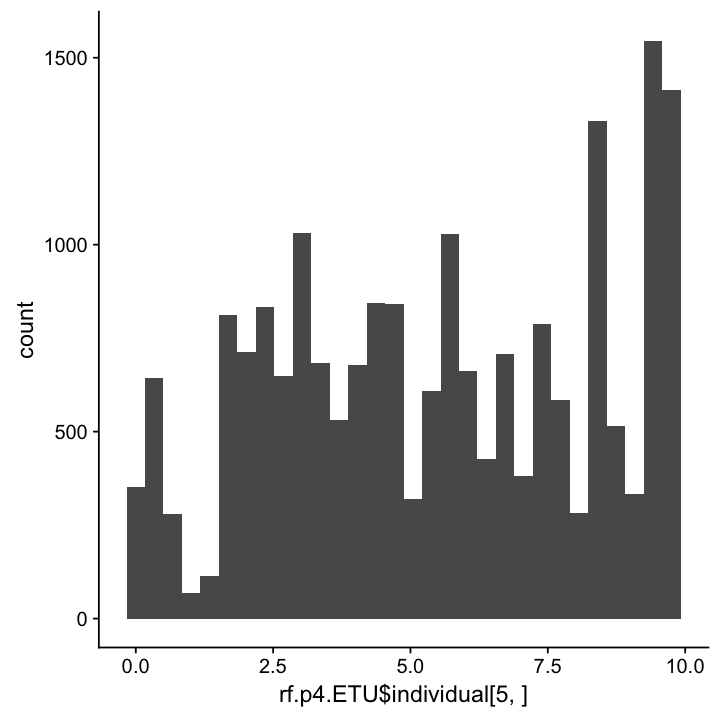

In [1398]:
qplot(rf.p4.ETU$individual[5,])

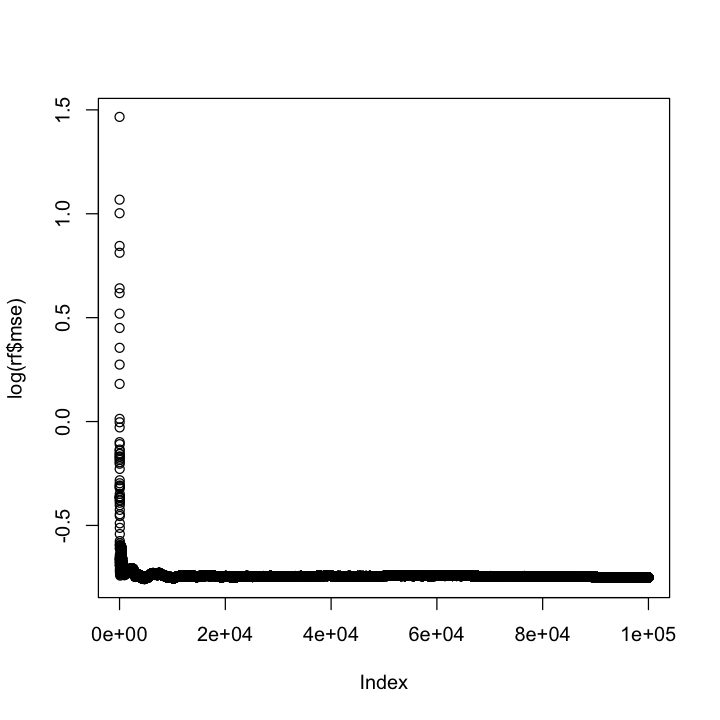

In [135]:
save.image(file="021918.RData")

In [3]:
load(file="021918.RData")